In [ ]:
"""Exploratory data analysis :
    
Dataset consist of following columns: 'country', 'country_long', 'name', 'gppd_idnr', 'capacity_mw',
       'latitude', 'longitude', 'primary_fuel', 'other_fuel1', 'other_fuel2',
       'other_fuel3', 'commissioning_year', 'owner', 'source', 'url',
       'geolocation_source', 'wepp_id', 'year_of_capacity_data',
       'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015',
       'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018',
       'generation_gwh_2019', 'generation_data_source',
       'estimated_generation_gwh'
       
There are 907 rows and 27 columns.

Following are data types of columns:
country                      object
country_long                 object
name                         object
gppd_idnr                    object
capacity_mw                 float64
latitude                    float64
longitude                   float64
primary_fuel                 object
other_fuel1                  object
other_fuel2                  object
other_fuel3                 float64
commissioning_year          float64
owner                        object
source                       object
url                          object
geolocation_source           object
wepp_id                     float64
year_of_capacity_data       float64
generation_gwh_2013         float64
generation_gwh_2014         float64
generation_gwh_2015         float64
generation_gwh_2016         float64
generation_gwh_2017         float64
generation_gwh_2018         float64
generation_gwh_2019         float64
generation_data_source       object
estimated_generation_gwh    float64

We can see that dataset contanis lot of null values.

estimated_generation_gwh    907
other_fuel3                 907
wepp_id                     907
generation_gwh_2013         907
generation_gwh_2019         907
other_fuel2                 906
other_fuel1                 709
owner                       565
generation_gwh_2014         509
generation_gwh_2015         485
generation_gwh_2016         473
generation_gwh_2017         467
generation_gwh_2018         459
generation_data_source      458
year_of_capacity_data       388
commissioning_year          380

Mostly null values can be seen in above columns.
    
"""

"""Large variation can be seen between max and min and mean values of capacity_mw and all generation_gwh columns

TOP FREQUENCIES

For country and country_long there is only one unique value.

ACME Solar Tower has top frequency in names.

WRI1020239 has top frequency in gppd_idnr.

primary_fuel has top frequency coal.

generation_data_source,owner, commissioning_year: most values are not available.
    
in source, Central Electricity Authority has top freq.

Most url have http://www.cea.nic.in/ value.
    
geolocation_source wri.

year_of_capacity_data: 2019

We are dropping left null values of: latitude,longitude,geolocation_source

By looking at max min mean values: outliers presence can be felt.

List of categorical columns: ['country', 'country_long', 'name', 'gppd_idnr', 'primary_fuel',
       'commissioning_year', 'owner', 'source', 'url', 'geolocation_source',
       'year_of_capacity_data', 'generation_data_source']
    
List of numerical columns: ['capacity_mw', 'latitude', 'longitude', 'generation_gwh_2014',
       'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017',
       'generation_gwh_2018']
       
For country , most frequent value is:  ModeResult(mode=array(['IND'], dtype=object), count=array([861])) 

For country_long , most frequent value is:  ModeResult(mode=array(['India'], dtype=object), count=array([861])) 

For name , most frequent value is:  ModeResult(mode=array(['ACME Solar Tower'], dtype=object), count=array([1])) 

For gppd_idnr , most frequent value is:  ModeResult(mode=array(['IND0000001'], dtype=object), count=array([1])) 

For primary_fuel , most frequent value is:  ModeResult(mode=array(['Coal'], dtype=object), count=array([253])) 


Checking frequencies: 

For primary fuel
Highest:
coal and hydro has highest
Lowest:
Oil and nuclear

For commisioning year
Highest not available data
Lowest: before 1972

For source
Highest central electricity

For geolocation source
Highest wri
Lowest NREL

For yearofcapacity
Highest NA
Lowest 2019

scatterplot between latitude and longitude and capacity predict low frequencies when capacity > 1500
A trend can be seen between capacity and all generation_gwh columns
WRI has highest range of frequencies.
All gemeration_gwh features are related to each other.
Mostly data points lie between 5000 gewolocation gwh and 1000 for capacity mw

WRi geolocation source has variety of options for primary fuel.
NREl and industry about rely on solar for primary fuel
Coal and hydro produce max capacity_mw.
Central electricity authority produces max capacity_mw

Using relational plots:

All generation_gwh features are positively related with capacity_mw
No clear relation can be seen between latitude longitude and capacity mw

Analysing histogram data:

Feature: capacity mw
max frequency range 0 to 1000
min frequency range 1000 to 4000

Feature: latitude
max frequency range 15 to 28

Feature: longitude
max frequency range 72 to 80

Feature: generation_gwh
max frequency range 0 to 5000

Analysing outliers:
All numerical columns except latitude have outliers

Coal wri and central electricty aut. being having highest range of values have lot of outliers as well.

Analysing fuels:
Biomass nuclear and oil have least relation with capacity mw.

Coal hydro and gas have good +ive relation with capacity mw.

Analysing skewness:

generation_gwh features and capacity_mw have highest skewness due to presence of large outliers.

4.18 percent of outliers are removed.

Now we have skewness underlimit
latitude              -0.108047
longitude              0.967396
generation_gwh_2017    1.280814
generation_gwh_2018    1.319552
generation_gwh_2015    1.389486
generation_gwh_2016    1.410976
generation_gwh_2014    1.515514
capacity_mw            1.945004

analysing correlation:
All the features can be seen +ively correlated with target column.

analysing multicollinearity:
All generation gwh columns are highly correlated with each other which is confirmed using vif.

Furthur using PowerTransformer, Principal Component Analysis that is a diamensionallity reduction technique,
we proceed with model instantiation and evaluation:

For regression:

MODEL USED XGBOOST

MAE:  104.17561739620085
MSE:  28244.294577172477
RMSE:  168.06038967339234
R2:  0.8165421300307603 

Score:  1.0

For classification

Training accuracy:  100.0
Testing accuracy:  82.25806451612904
Confusion matrix: 
 [[17  3  0  0  0  0  0  0]
 [ 1 53  2 10  0  1  0  0]
 [ 0  3  2  7  0  2  0  0]
 [ 0  6  7 69  0  0  0  0]
 [ 0  0  0  1  0  0  0  0]
 [ 0  0  0  1  0  1  0  0]
 [ 0  0  0  0  0  0 25  0]
 [ 0  0  0  0  0  0  0 37]]
classification report:                precision    recall  f1-score   support

           0       0.94      0.85      0.89        20
           1       0.82      0.79      0.80        67
           2       0.18      0.14      0.16        14
           3       0.78      0.84      0.81        82
           4       0.00      0.00      0.00         1
           5       0.25      0.50      0.33         2
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        37

    accuracy                           0.82       248
   macro avg       0.62      0.64      0.63       248
weighted avg       0.82      0.82      0.82       248


"""

In [4]:
# Imp libs:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Spliting data
from sklearn.model_selection import train_test_split,GridSearchCV

# Algorithms
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
import itertools
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.naive_bayes import GaussianNB
# Importing metrics
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

from statsmodels.stats.outliers_influence import variance_inflation_factor

# Removing warnings
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [5]:
# Standardizing and Normalizing data:
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LinearRegression
import xgboost as xgb

# Spliting data
from sklearn.model_selection import train_test_split,GridSearchCV

# Importing metrics
from sklearn import metrics
from sklearn.metrics import r2_score,mean_squared_error

# Removing warnings
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [6]:
file_loc = 'https://raw.githubusercontent.com/wri/global-power-plant-database/master/source_databases_csv/database_IND.csv'
df = pd.read_csv(file_loc)

In [4]:
print('First 10 rows')
df.head(10)

First 10 rows


,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
0,IND,India,ACME Solar Tower,WRI1020239,2.5,28.1839,73.2407,Solar,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,IND,India,ADITYA CEMENT WORKS,WRI1019881,98.0,24.7663,74.6090,Coal,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,IND,India,AES Saurashtra Windfarms,WRI1026669,39.2,21.9038,69.3732,Wind,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,IND,India,AGARTALA GT,IND0000001,135.0,23.8712,91.3602,Gas,NaN,NaN,...,2019.0,NaN,617.789264,843.7470,886.004428,663.774500,626.239128,NaN,Central Electricity Authority,NaN
4,IND,India,AKALTARA TPP,IND0000002,1800.0,21.9603,82.4091,Coal,Oil,NaN,...,2019.0,NaN,3035.550000,5916.3700,6243.000000,5385.579736,7279.000000,NaN,Central Electricity Authority,NaN
5,IND,India,AKRIMOTA LIG,IND0000003,250.0,23.7689,68.6447,Coal,Oil,NaN,...,2019.0,NaN,1153.421000,1208.8520,1175.765000,1147.913000,976.655000,NaN,Central Electricity Authority,NaN
6,IND,India,ALIYAR,IND0000004,60.0,10.4547,77.0078,Hydro,NaN,NaN,...,2019.0,NaN,157.558250,152.1952,61.421350,89.629600,48.327150,NaN,Central Electricity Authority,NaN
7,IND,India,ALLAIN DUHANGAN,IND0000005,192.0,32.2258,77.2070,Hydro,NaN,NaN,...,2019.0,NaN,674.391100,721.3352,675.724400,679.594950,579.318850,NaN,Central Electricity Authority,NaN
8,IND,India,ALMATTI DAM,IND0000006,290.0,16.3300,75.8863,Hydro,NaN,NaN,...,2019.0,NaN,480.594950,144.4342,402.029750,439.372100,406.377900,NaN,Central Electricity Authority,NaN
9,IND,India,AMAR KANTAK,IND0000007,210.0,23.1642,81.6373,Coal,Oil,NaN,...,2019.0,NaN,1887.904000,1643.0460,1338.093000,1563.457000,1487.880000,NaN,Central Electricity Authority,NaN


In [5]:
print('Last 10 rows')
df.tail(10)

Last 10 rows


,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
897,IND,India,Wind power project by Riddhi Siddhi Gluco Biol...,WRI1026753,34.65,8.8709,77.4466,Wind,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
898,IND,India,Wind power project in Rajasthan,WRI1026769,42.00,27.1715,70.6877,Wind,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
899,IND,India,YAMUNANAGAR TPP,IND0000511,600.00,30.1081,77.3257,Coal,Oil,NaN,...,2019.0,NaN,3194.35982,3709.552200,3123.572061,3156.053669,3039.66118,NaN,Central Electricity Authority,NaN
900,IND,India,YASHWANTRAO MOHITE,WRI1019995,16.00,17.1653,74.2456,Biomass,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
901,IND,India,YELHANKA (DG),IND0000512,106.60,13.1156,77.5838,Oil,NaN,NaN,...,2019.0,NaN,0.00000,0.000000,0.000000,NaN,0.00000,NaN,Central Electricity Authority,NaN
902,IND,India,YERMARUS TPP,IND0000513,1600.00,16.2949,77.3568,Coal,Oil,NaN,...,2019.0,NaN,NaN,0.994875,233.596650,865.400000,686.50000,NaN,Central Electricity Authority,NaN
903,IND,India,Yelesandra Solar Power Plant,WRI1026222,3.00,12.8932,78.1654,Solar,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
904,IND,India,Yelisirur wind power project,WRI1026776,25.50,15.2758,75.5811,Wind,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
905,IND,India,ZAWAR MINES,WRI1019901,80.00,24.3500,73.7477,Coal,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
906,IND,India,iEnergy Theni Wind Farm,WRI1026761,16.50,9.9344,77.4768,Wind,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
df.columns

Index(['country', 'country_long', 'name', 'gppd_idnr', 'capacity_mw',
       'latitude', 'longitude', 'primary_fuel', 'other_fuel1', 'other_fuel2',
       'other_fuel3', 'commissioning_year', 'owner', 'source', 'url',
       'geolocation_source', 'wepp_id', 'year_of_capacity_data',
       'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015',
       'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018',
       'generation_gwh_2019', 'generation_data_source',
       'estimated_generation_gwh'],
      dtype='object')

In [7]:
df.shape

(907, 27)

In [8]:
df.dtypes

country                      object
country_long                 object
name                         object
gppd_idnr                    object
capacity_mw                 float64
latitude                    float64
longitude                   float64
primary_fuel                 object
other_fuel1                  object
other_fuel2                  object
other_fuel3                 float64
commissioning_year          float64
owner                        object
source                       object
url                          object
geolocation_source           object
wepp_id                     float64
year_of_capacity_data       float64
generation_gwh_2013         float64
generation_gwh_2014         float64
generation_gwh_2015         float64
generation_gwh_2016         float64
generation_gwh_2017         float64
generation_gwh_2018         float64
generation_gwh_2019         float64
generation_data_source       object
estimated_generation_gwh    float64
dtype: object

In [7]:
null_data = df.isnull().sum()
null_data.sort_values(ascending=0)

estimated_generation_gwh    907
other_fuel3                 907
wepp_id                     907
generation_gwh_2013         907
generation_gwh_2019         907
other_fuel2                 906
other_fuel1                 709
owner                       565
generation_gwh_2014         509
generation_gwh_2015         485
generation_gwh_2016         473
generation_gwh_2017         467
generation_gwh_2018         459
generation_data_source      458
year_of_capacity_data       388
commissioning_year          380
latitude                     46
longitude                    46
geolocation_source           19
country                       0
url                           0
country_long                  0
primary_fuel                  0
capacity_mw                   0
gppd_idnr                     0
name                          0
source                        0
dtype: int64

In [8]:
null_cols= ['estimated_generation_gwh','other_fuel3','wepp_id','generation_gwh_2013','generation_gwh_2019','other_fuel2',
            'other_fuel1']

In [9]:
df.shape[0]

907

In [10]:
df.drop(columns=null_cols,axis=1,inplace=True)

In [11]:
df.shape

(907, 20)

In [12]:
# Furthur treating null values:

df['owner'].fillna('Not available',axis=0,inplace=True)

In [13]:
df['generation_gwh_2014'].fillna(np.mean(df['generation_gwh_2014']),axis=0,inplace=True)        
df['generation_gwh_2015'].fillna(np.mean(df['generation_gwh_2015']),axis=0,inplace=True)         
df['generation_gwh_2016'].fillna(np.mean(df['generation_gwh_2016']),axis=0,inplace=True)
df['generation_gwh_2017'].fillna(np.mean(df['generation_gwh_2017']),axis=0,inplace=True)         
df['generation_gwh_2018'].fillna(np.mean(df['generation_gwh_2018']),axis=0,inplace=True)

In [14]:
df['generation_data_source'].fillna('Not available',axis=0,inplace=True)
df['year_of_capacity_data'].fillna('Not available',axis=0,inplace=True)
df['commissioning_year'].fillna('Not available',axis=0,inplace=True)

In [15]:
"""Null value treatment:
Lets fill missing values with mean values for generation columns.
For generation_data_source, year_of_capacity_data, commissioning_year since we dont know exact values
lets fill them using not available value"""

'Null value treatment:\nLets fill missing values with mean values for generation columns.\nFor generation_data_source, year_of_capacity_data, commissioning_year since we dont know exact values\nlets fill them using not available value'

In [16]:
desc = df.describe().T
desc['range']=desc['max']-desc['min']
desc

,count,mean,std,min,25%,50%,75%,max,range
capacity_mw,907.0,326.223755,590.085456,0.0000,16.725000,59.200000,385.250000,4760.000,4760.0000
latitude,861.0,21.197918,6.239612,8.1689,16.773900,21.780000,25.512400,34.649,26.4801
longitude,861.0,77.464907,4.939316,68.6447,74.256200,76.719500,79.440800,95.408,26.7633
generation_gwh_2014,907.0,2431.823590,2665.338608,0.0000,1211.362750,2431.823590,2431.823590,28127.000,28127.0000
generation_gwh_2015,907.0,2428.226946,2859.349132,0.0000,916.000000,2428.226946,2428.226946,30539.000,30539.0000
generation_gwh_2016,907.0,2467.936859,2877.890004,0.0000,896.500214,2467.936859,2467.936859,30015.000,30015.0000
generation_gwh_2017,907.0,2547.759305,2921.502193,0.0000,882.594850,2547.759305,2547.759305,35116.000,35116.0000
generation_gwh_2018,907.0,2600.804099,3030.808041,0.0000,824.842340,2600.804099,2600.804099,35136.000,35136.0000


In [17]:
df.describe(include='object').T


,count,unique,top,freq
country,907,1,IND,907
country_long,907,1,India,907
name,907,907,ACME Solar Tower,1
gppd_idnr,907,907,WRI1020239,1
primary_fuel,907,8,Coal,258
commissioning_year,907,74,Not available,380
owner,907,281,Not available,565
source,907,191,Central Electricity Authority,519
url,907,304,http://www.cea.nic.in/,519
geolocation_source,888,3,WRI,765


In [18]:
df.isnull().sum()

country                    0
country_long               0
name                       0
gppd_idnr                  0
capacity_mw                0
latitude                  46
longitude                 46
primary_fuel               0
commissioning_year         0
owner                      0
source                     0
url                        0
geolocation_source        19
year_of_capacity_data      0
generation_gwh_2014        0
generation_gwh_2015        0
generation_gwh_2016        0
generation_gwh_2017        0
generation_gwh_2018        0
generation_data_source     0
dtype: int64

In [19]:
df.dropna(axis=0,inplace=True)

In [20]:
df.isnull().sum()

country                   0
country_long              0
name                      0
gppd_idnr                 0
capacity_mw               0
latitude                  0
longitude                 0
primary_fuel              0
commissioning_year        0
owner                     0
source                    0
url                       0
geolocation_source        0
year_of_capacity_data     0
generation_gwh_2014       0
generation_gwh_2015       0
generation_gwh_2016       0
generation_gwh_2017       0
generation_gwh_2018       0
generation_data_source    0
dtype: int64

In [21]:
desc[['min','mean','max','range']]

,min,mean,max,range
capacity_mw,0.0000,326.223755,4760.000,4760.0000
latitude,8.1689,21.197918,34.649,26.4801
longitude,68.6447,77.464907,95.408,26.7633
generation_gwh_2014,0.0000,2431.823590,28127.000,28127.0000
generation_gwh_2015,0.0000,2428.226946,30539.000,30539.0000
generation_gwh_2016,0.0000,2467.936859,30015.000,30015.0000
generation_gwh_2017,0.0000,2547.759305,35116.000,35116.0000
generation_gwh_2018,0.0000,2600.804099,35136.000,35136.0000


In [22]:
cont_data = df.select_dtypes(include=['int64','float64'])

cat_data= df.select_dtypes(include=['object'])

cont_columns = cont_data.columns

cat_columns = cat_data.columns

In [23]:
cont_columns

Index(['capacity_mw', 'latitude', 'longitude', 'generation_gwh_2014',
       'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017',
       'generation_gwh_2018'],
      dtype='object')

In [24]:
cat_columns

Index(['country', 'country_long', 'name', 'gppd_idnr', 'primary_fuel',
       'commissioning_year', 'owner', 'source', 'url', 'geolocation_source',
       'year_of_capacity_data', 'generation_data_source'],
      dtype='object')

In [25]:
from scipy import stats

for i in ['country', 'country_long', 'name', 'gppd_idnr', 'primary_fuel']:
    print('For',i,', most frequent value is: ',stats.mode(df[i]),'\n')

For country , most frequent value is:  ModeResult(mode=array(['IND'], dtype=object), count=array([861])) 

For country_long , most frequent value is:  ModeResult(mode=array(['India'], dtype=object), count=array([861])) 

For name , most frequent value is:  ModeResult(mode=array(['ACME Solar Tower'], dtype=object), count=array([1])) 

For gppd_idnr , most frequent value is:  ModeResult(mode=array(['IND0000001'], dtype=object), count=array([1])) 

For primary_fuel , most frequent value is:  ModeResult(mode=array(['Coal'], dtype=object), count=array([253])) 



In [29]:
for i in cat_columns:
    print('For column',i,'unique values are: ',df[i].unique())
    print('For column',i,'count of unique values are: ',df[i].nunique(),'\n\n')
    

For column country unique values are:  ['IND']
For column country count of unique values are:  1 


For column country_long unique values are:  ['India']
For column country_long count of unique values are:  1 


For column name unique values are:  ['ACME Solar Tower' 'ADITYA CEMENT WORKS' 'AES Saurashtra Windfarms'
 'AGARTALA GT' 'AKALTARA TPP' 'AKRIMOTA LIG' 'ALIYAR' 'ALLAIN DUHANGAN'
 'ALMATTI DAM' 'AMAR KANTAK' 'AMARAVATI TPP' 'ANANDPUR SAHIB ST-I&II'
 'ANAPARA "C"' 'ANDHRA' 'ANPARA' 'ANTA GT' 'ANUPPUR' 'ANUPUR TPP'
 'ARVINDNAGAR SUGAR' 'ASHOKNAGAR MILL' 'ATHANI SUGAR' 'AURAIYA GT'
 'AVANTHA BHANDAR TPP' 'AWARPUR CEMENT PLANT' 'Amarsar Solar Power Plant'
 'Anabura Wind Farm' 'Ananthapur - Meil Solar Power Plant'
 'Andrha Lake Wind Farm' 'Anikkadavu Wind Farm' 'Arasinagundi Wind Farm'
 'Askandra - DREPL Solar Power Plant'
 'Askandra - Electromech Maritech Solar Power Plant'
 'Askandra - Finehope Solar Power Plant'
 'Askandra - Khaya Solar Power Plant'
 'Askandra - Newton Solar Power 

In [30]:
for i in cat_columns:
    print('For column --',i,'-- value counts are: \n',df[i].value_counts(),'\n\n')

For column -- country -- value counts are: 
 IND    861
Name: country, dtype: int64 


For column -- country_long -- value counts are: 
 India    861
Name: country_long, dtype: int64 


For column -- name -- value counts are: 
 ACME Solar Tower             1
PRAGATI CCCP -III            1
PRIYADARSHNI JURALA          1
PRYAGRAJ (BARA) TPP          1
PULICHINTALA                 1
                            ..
Jangi village wind farm      1
Jeloo Wind Farm              1
Jodiya Wind Farm             1
K.N. Ram Kaltek Wind Farm    1
iEnergy Theni Wind Farm      1
Name: name, Length: 861, dtype: int64 


For column -- gppd_idnr -- value counts are: 
 WRI1020239    1
IND0000343    1
IND0000345    1
IND0000346    1
IND0000523    1
             ..
WRI1026777    1
WRI1026099    1
WRI1026082    1
WRI1026339    1
WRI1026761    1
Name: gppd_idnr, Length: 861, dtype: int64 


For column -- primary_fuel -- value counts are: 
 Coal       253
Hydro      233
Solar      123
Wind       108
Gas        

In [26]:
cat_columns

Index(['country', 'country_long', 'name', 'gppd_idnr', 'primary_fuel',
       'commissioning_year', 'owner', 'source', 'url', 'geolocation_source',
       'year_of_capacity_data', 'generation_data_source'],
      dtype='object')

In [27]:
cont_columns

Index(['capacity_mw', 'latitude', 'longitude', 'generation_gwh_2014',
       'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017',
       'generation_gwh_2018'],
      dtype='object')

In [30]:
group_fuel = df.groupby(['primary_fuel','owner'])
group_fuel.first()

country  \
primary_fuel owner                                                    
Biomass      Ashok Ssk ltd                                      IND   
             Bannari Sugars ltd                                 IND   
             Core Fuels ltd                                     IND   
             Datta Ssk ltd                                      IND   
             Daund Sugar ltd                                    IND   
...                                                             ...   
Wind         Tratnagiri Wind Power Projects Private Limited     IND   
             UPL                                                IND   
             Vaayu Renew                                        IND   
             Weizzmann Forex Limited                            IND   
             iEnergy Wind Farms                                 IND   

                                                            country_long  \
primary_fuel owner                                                         
Biomass      Ashok Ssk ltd                                         India   
             Bannari Sugars ltd                                    India   
             Core Fuels ltd                                        India   
             Datta Ssk ltd                                         India   
             Daund Sugar ltd                                       India   
...                                                                  ...   
Wind         Tratnagiri Wind Power Projects Private Limited        India   
             UPL                                                   India   
             Vaayu Renew                                           India   
             Weizzmann Forex Limited                               India   
             iEnergy Wind Farms                                    India   

                                                                                         name  \
primary_fuel owner                                                                              
Biomass      Ashok Ssk ltd                                                    ASHOKNAGAR MILL   
             Bannari Sugars ltd                                                KOLLEGAL SUGAR   
             Core Fuels ltd                                                  CORE GREEN SUGAR   
             Datta Ssk ltd                                                        SHIROL MILL   
             Daund Sugar ltd                                                      DAUND SUGAR   
...                                                                                       ...   
Wind         Tratnagiri Wind Power Projects Private Limited            Patan Taluka Wind Farm   
             UPL                                                     UPL Dharapuram Wind Farm   
             Vaayu Renew                                                Vaayu Ashti Wind Farm   
             Weizzmann Forex Limited                         Weizzmann Forex Idukki Wind Farm   
             iEnergy Wind Farms                                       iEnergy Theni Wind Farm   

                                                              gppd_idnr  \
primary_fuel owner                                                        
Biomass      Ashok Ssk ltd                                   WRI1019939   
             Bannari Sugars ltd                              WRI1019922   
             Core Fuels ltd                                  WRI1019911   
             Datta Ssk ltd                                   WRI1019985   
             Daund Sugar ltd                                 WRI1019950   
...                                                                 ...   
Wind         Tratnagiri Wind Power Projects Private Limited  WRI1026663   
             UPL                                             WRI1026759   
             Vaayu Renew                                     WRI1026665   
             Weizzmann Forex Limited                        

In [29]:
grp1 = df.groupby(['primary_fuel','capacity_mw'])
grp1.first()

country country_long                   name  \
primary_fuel capacity_mw                                               
Biomass      10.00           IND        India      ARVINDNAGAR SUGAR   
             11.00           IND        India       RAMANAGARAM MILL   
             11.20           IND        India      MUNOLI DISTILLERY   
             12.50           IND        India           RANJANI MILL   
             12.96           IND        India       DNYANESHWAR MILL   
...                          ...          ...                    ...   
Wind         100.80          IND        India  Ingaleshwar Wind Farm   
             102.00          IND        India   ONGC Jerat Wind Farm   
             113.60          IND        India  Andrha Lake Wind Farm   
             150.00          IND        India         Bera Wind Farm   
             200.00          IND        India  Thimmapuram Wind Farm   

                           gppd_idnr  latitude  longitude commissioning_year  \
primary_fuel capacity_mw                                                       
Biomass      10.00        WRI1019938   18.0845    76.1851      Not available   
             11.00        WRI1019931   12.7145    77.4524      Not available   
             11.20        WRI1019928   15.8555    75.1002      Not available   
             12.50        WRI1019979   18.5354    76.2450      Not available   
             12.96        WRI1019952   19.4496    75.0382      Not available   
...                              ...       ...        ...                ...   
Wind         100.80       WRI1026661   16.6208    76.0223      Not available   
             102.00       WRI1026091   26.8180    71.0643      Not available   
             113.60       WRI1026768   18.8580    73.6396      Not available   
             150.00       WRI1026083   23.0544    68.8782      Not available   
             200.00       WRI1026659   14.7053    77.3355      Not available   

                                                              owner  \
primary_fuel capacity_mw                                              
Biomass      10.00                                       Dr Ssk ltd   
             11.00                                      Spr Pvt ltd   
             11.20                                 Shree Sugars ltd   
             12.50                           Natural Alliend indust   
             12.96                                     Shri Ssk ltd   
...                                                             ...   
Wind         100.80             Fortune Five Hydel Projects Limited   
             102.00                                   Not available   
             113.60                                   Not available   
             150.00                                   Not available   
             200.00       Rayala Wind Power Company Private Limited   

                                          source  \
primary_fuel capacity_mw                           
Biomass      10.00                    Dr Ssk ltd   
             11.00                   Spr Pvt ltd   
             11.20              Shree Sugars ltd   
             12.50        Natural Alliend indust   
             12.96                  Shri Ssk ltd   
...                                          ...   
Wind         100.80                          CDM   
             102.00                          CDM   
             113.60                          CDM   
             150.00                          CDM   
             200.00                          CDM   

                                                                        url  \
primary_fuel capacity_mw                                                      
Biomass      10.00                            http://www.ambedkarsugar.com/   
             11.00        http://www.mapsofindia.com/whitepages/foods-an...   
             11.20                             http://www.renukasugars.com/   
             12.50                                 

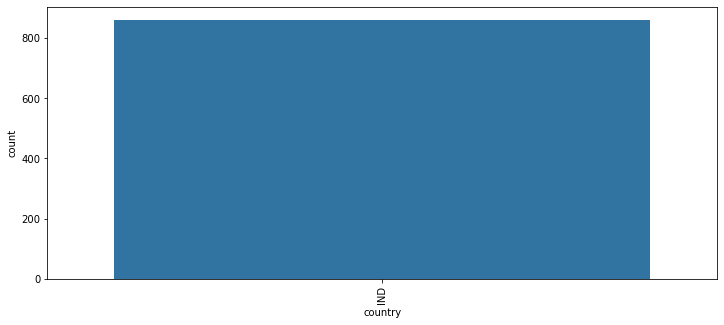

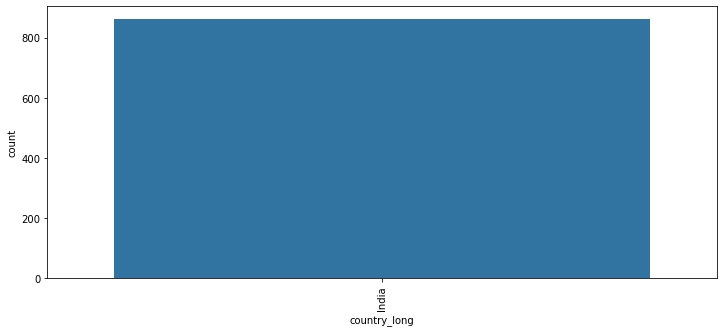

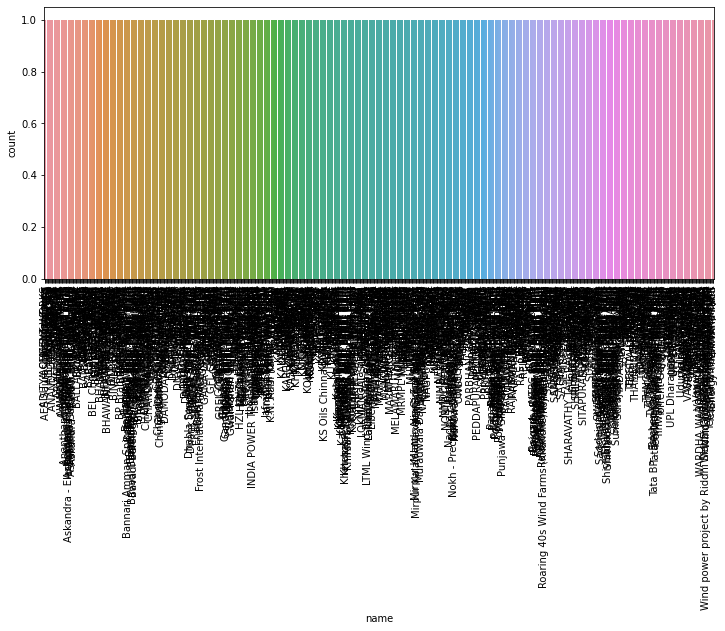

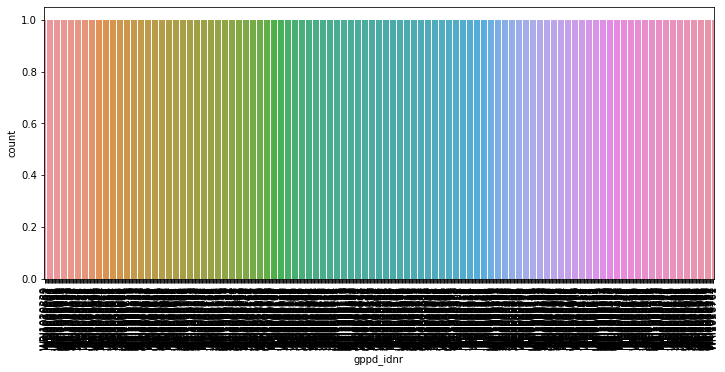

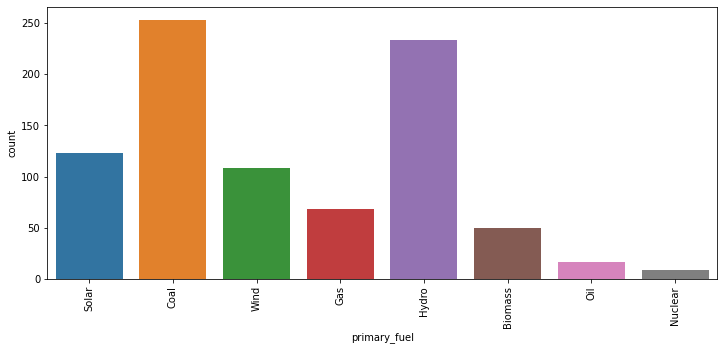

...

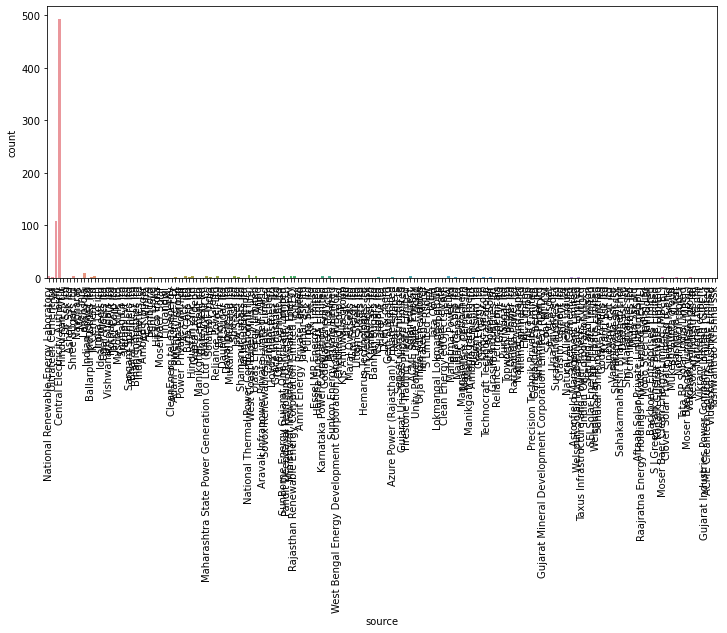

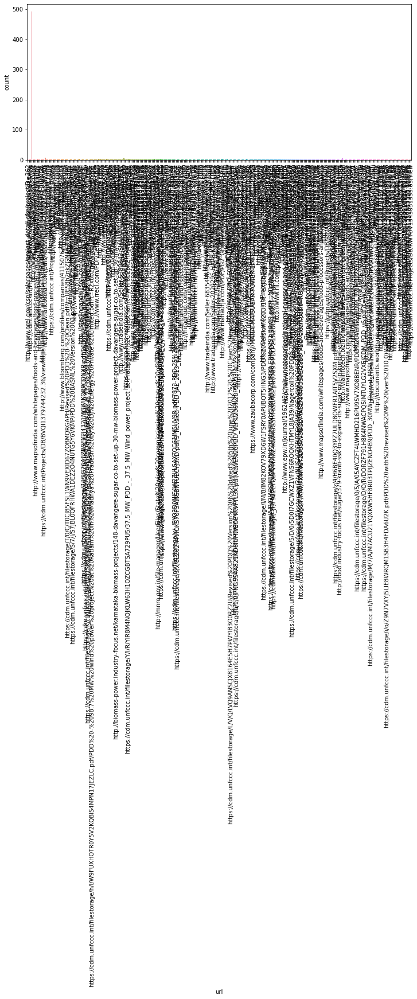

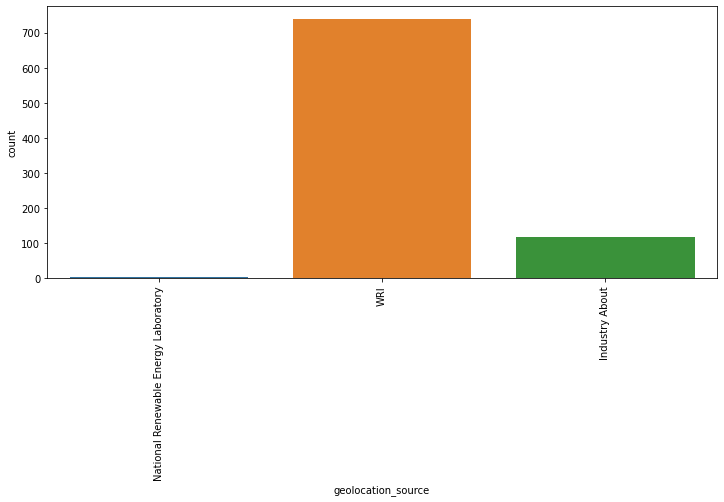

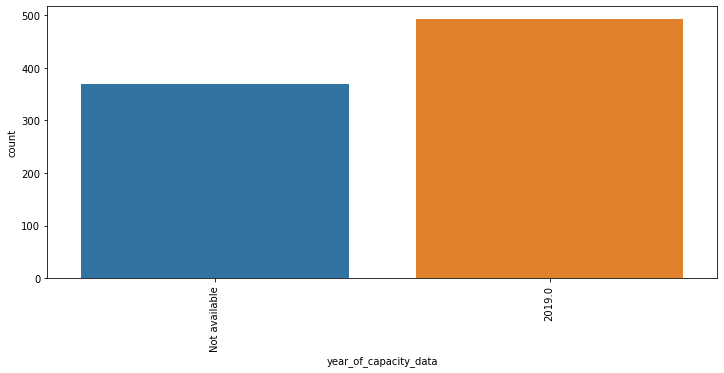

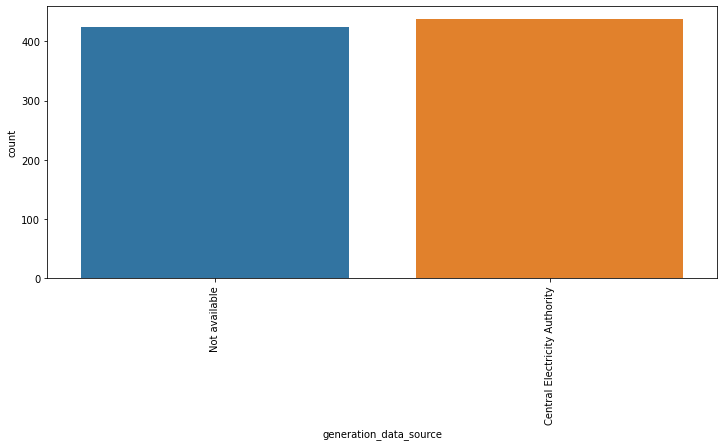

In [28]:
# Univariate analysis:

# COUNTPLOT

for i in cat_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.countplot(x=df[i],data=df)
    plt.xticks(rotation=90)

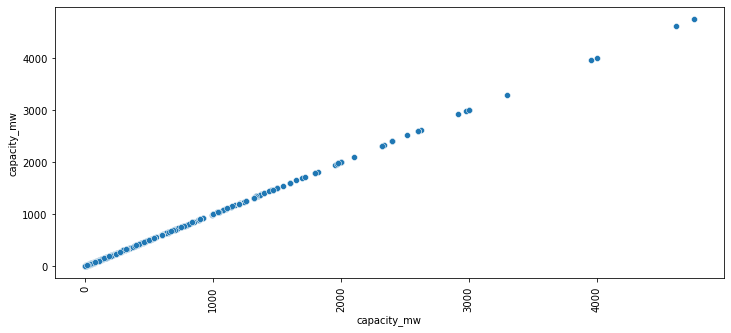

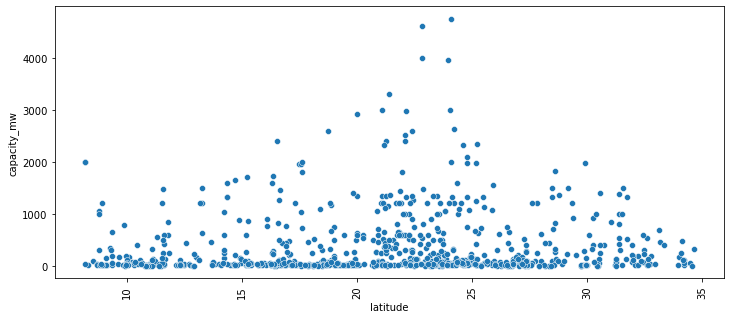

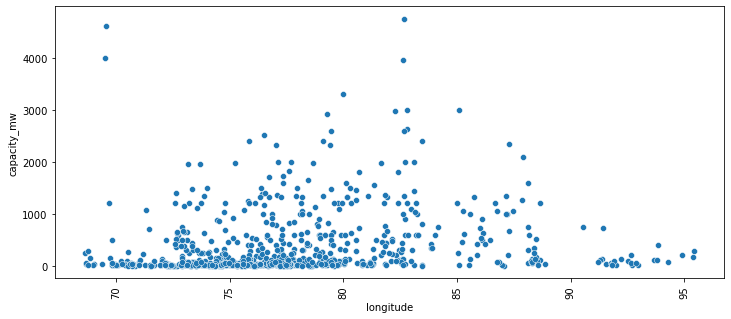

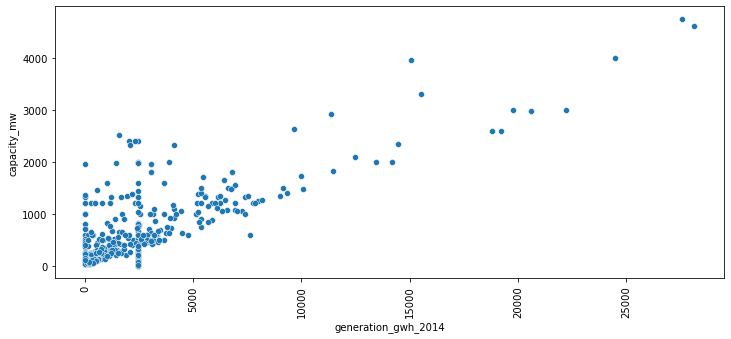

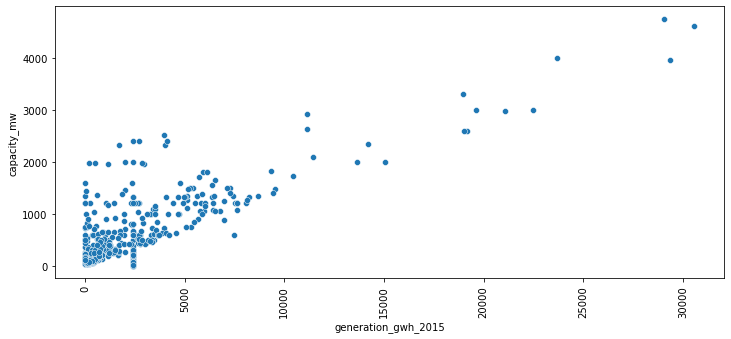

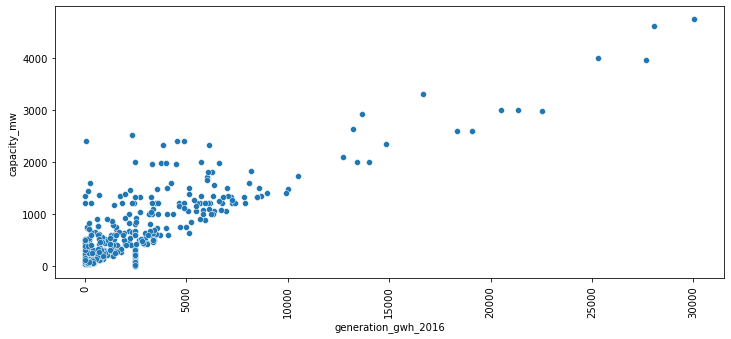

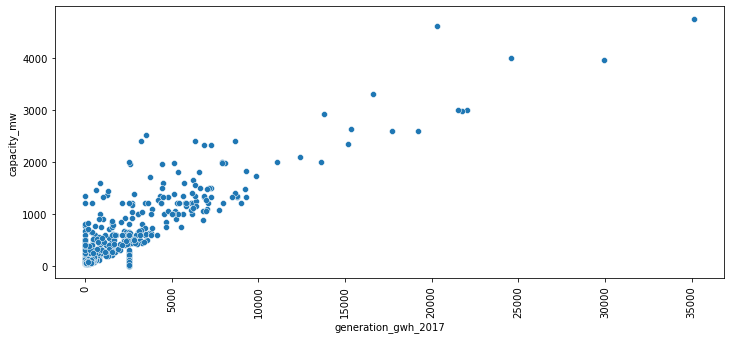

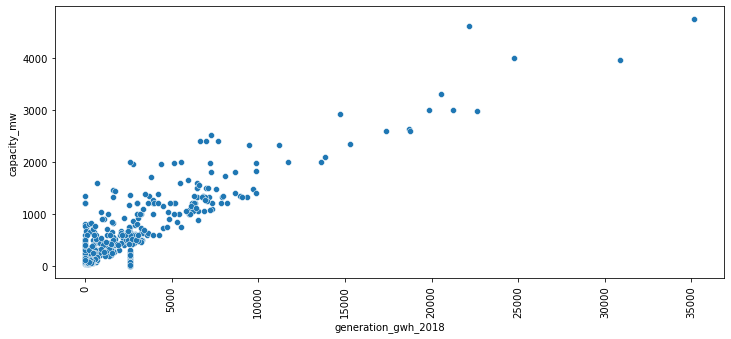

In [35]:
for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.scatterplot(x=df[i],y='capacity_mw',data=df)
    plt.xticks(rotation=90)

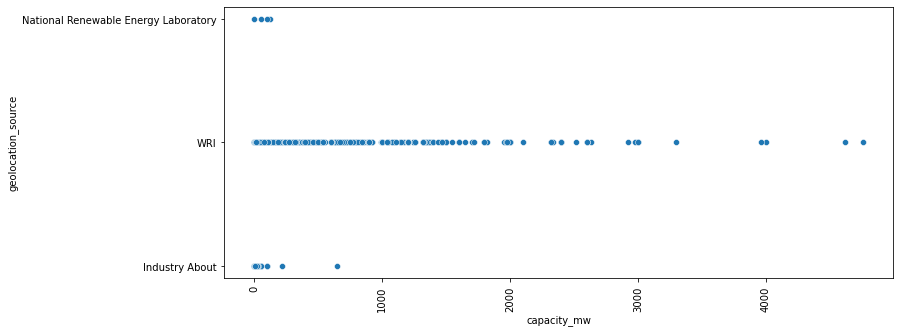

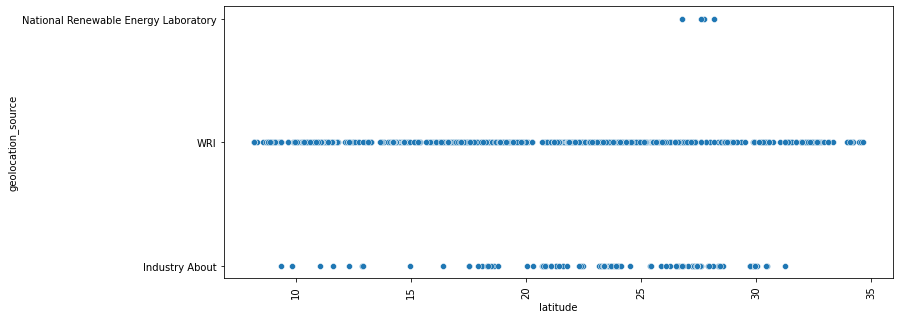

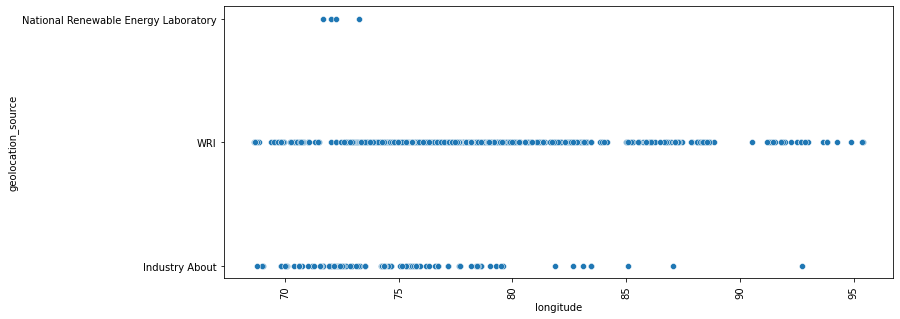

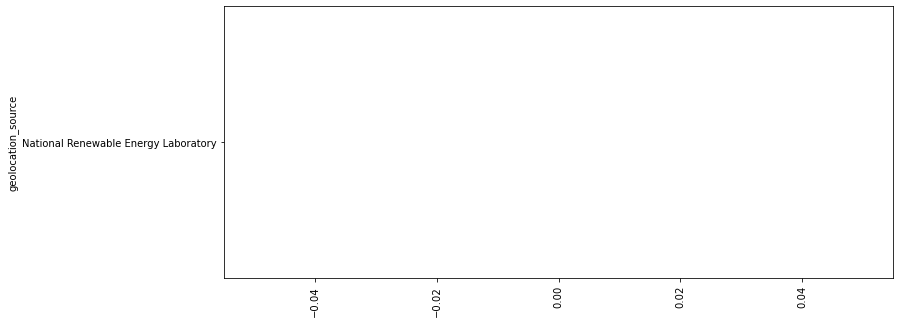

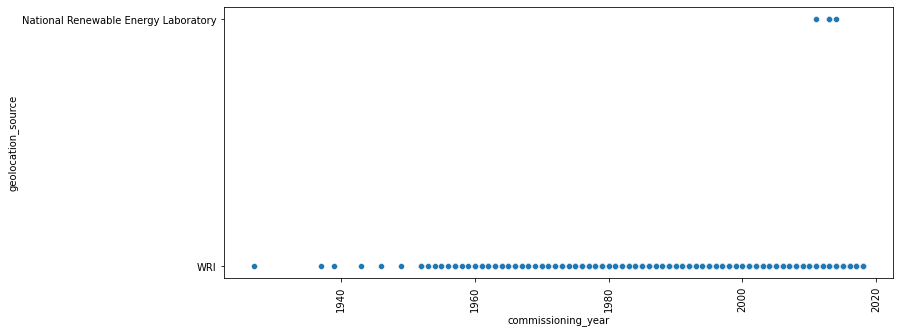

...

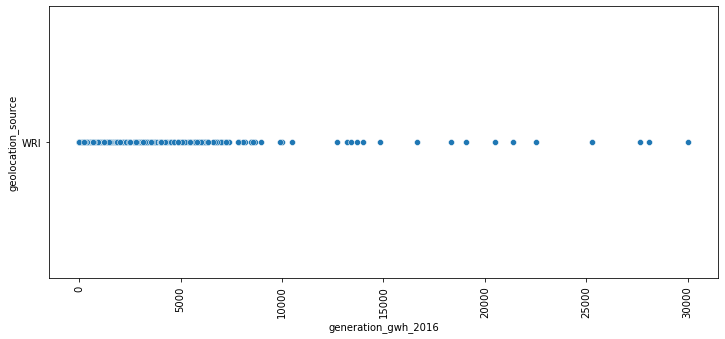

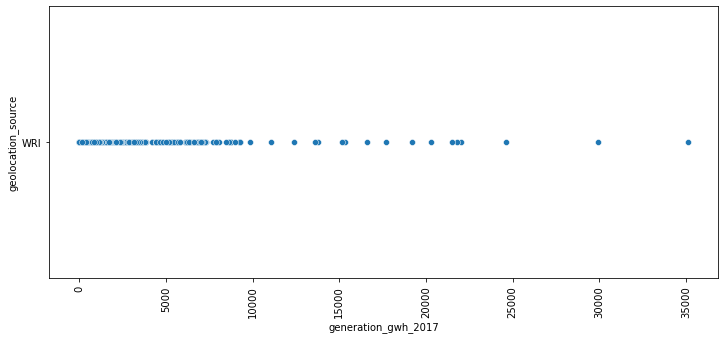

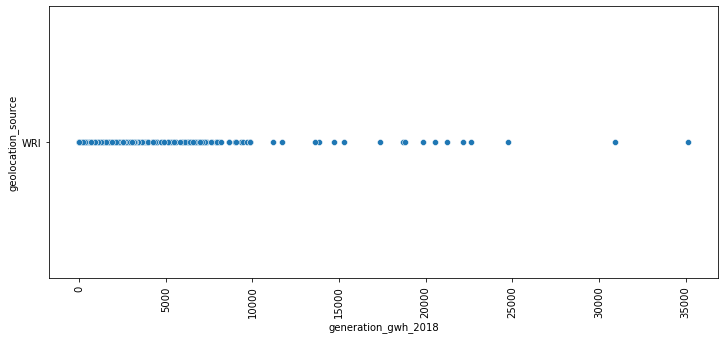

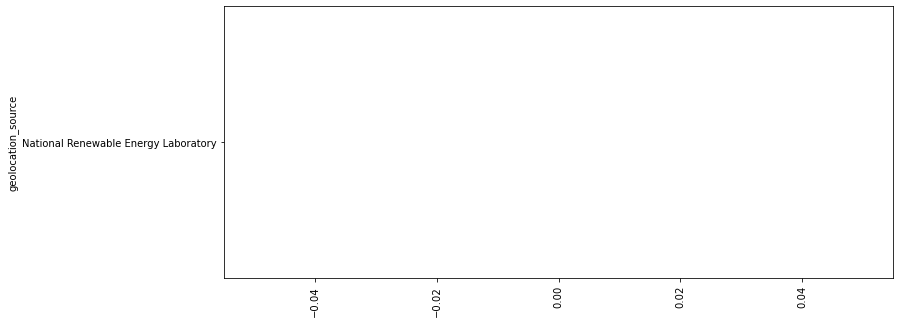

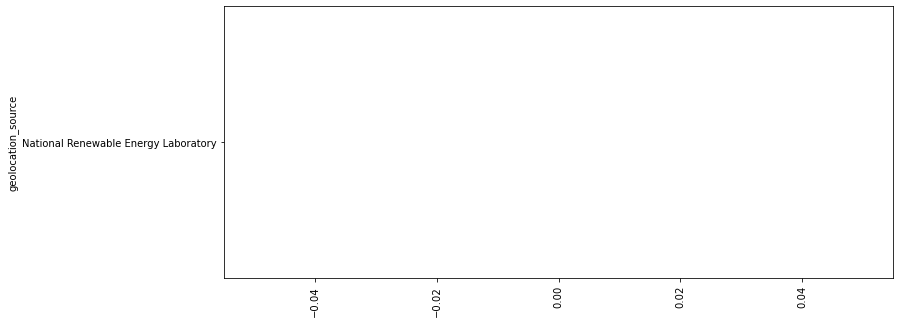

In [32]:
# Bivariate analysis

# Scaterplot

for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.scatterplot(x=df[i],y='geolocation_source',data=df)
    plt.xticks(rotation=90)

In [ ]:
for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.scatterplot(x=df[i],y='generation_gwh_2018',data=df)
    plt.xticks(rotation=90)

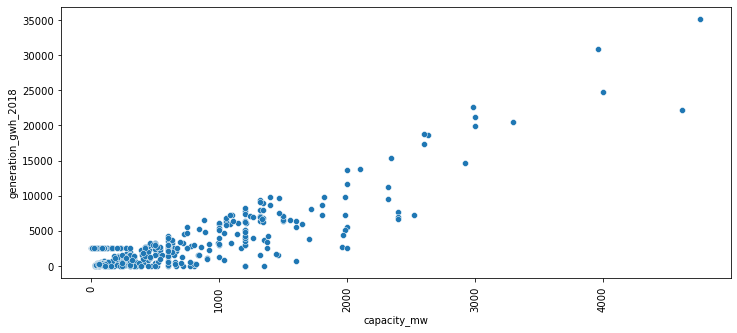

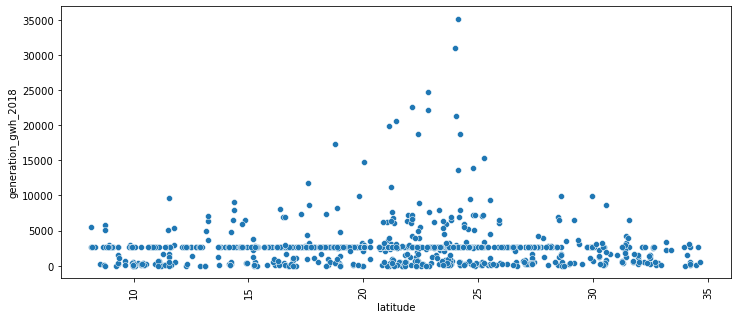

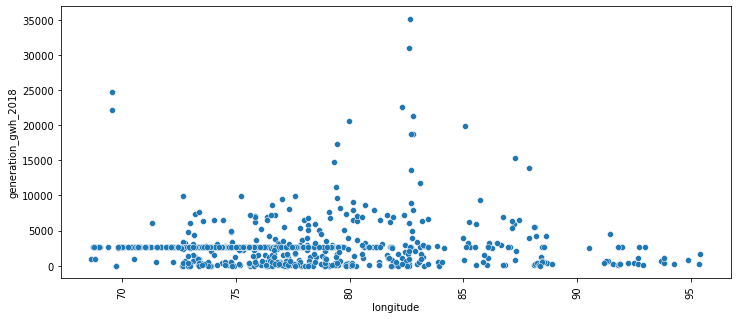

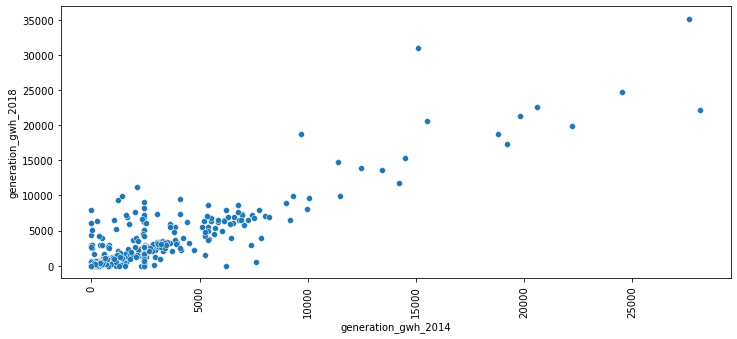

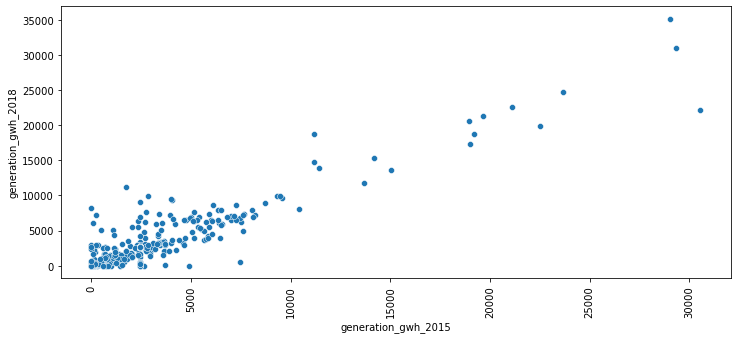

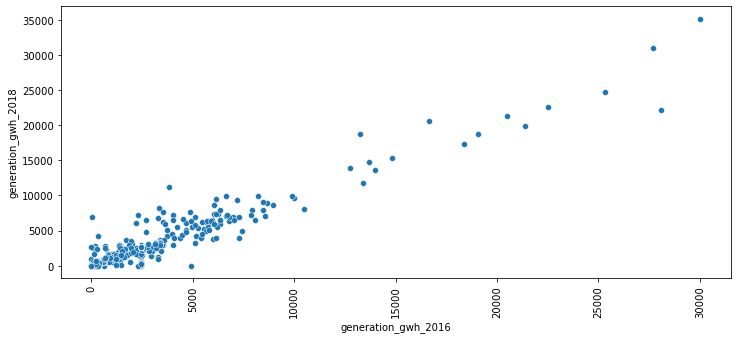

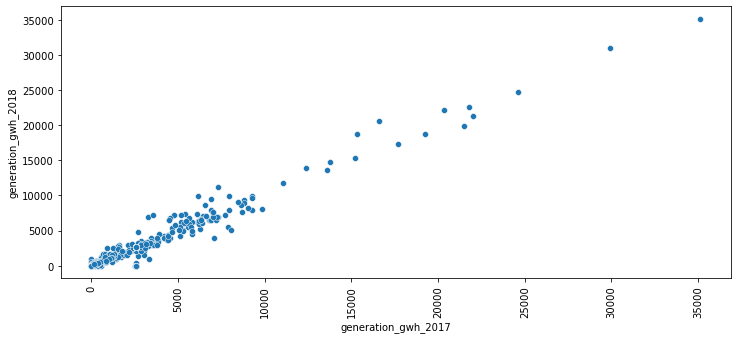

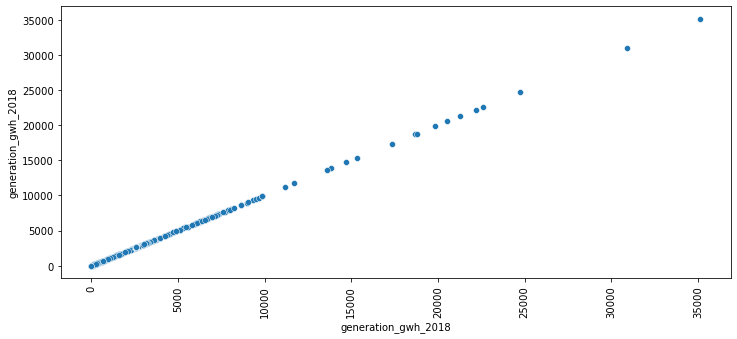

In [42]:
for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.scatterplot(x=df[i],y='generation_gwh_2018',data=df)
    plt.xticks(rotation=90)

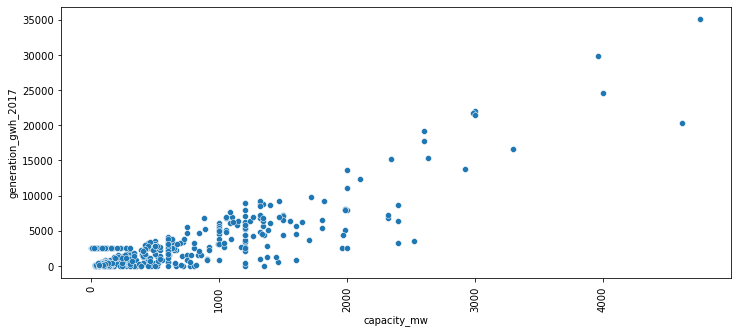

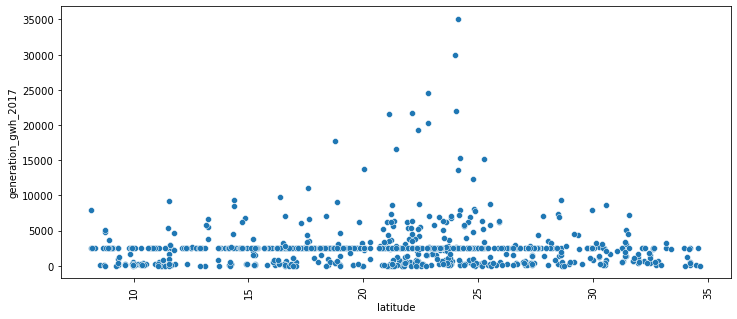

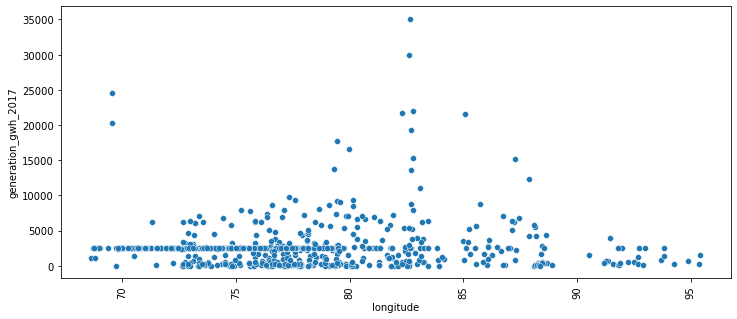

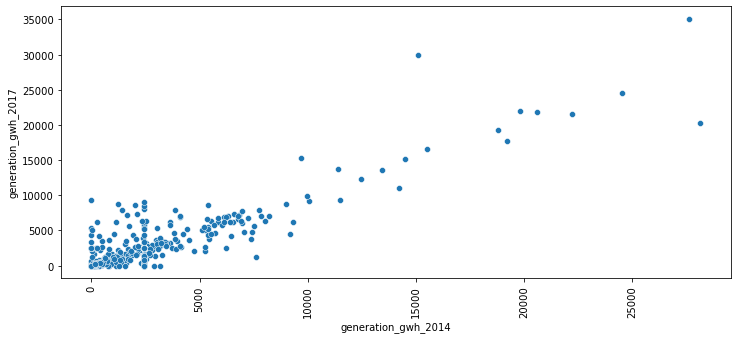

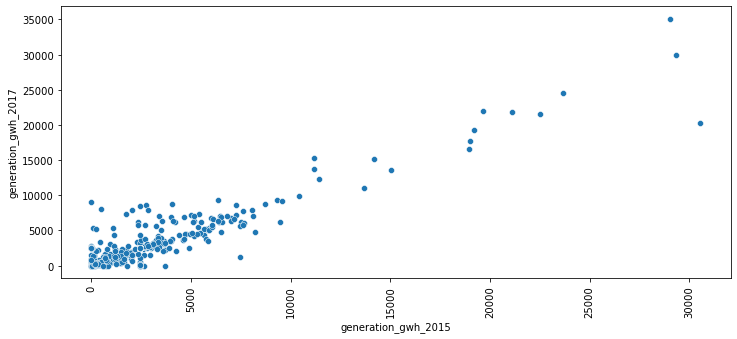

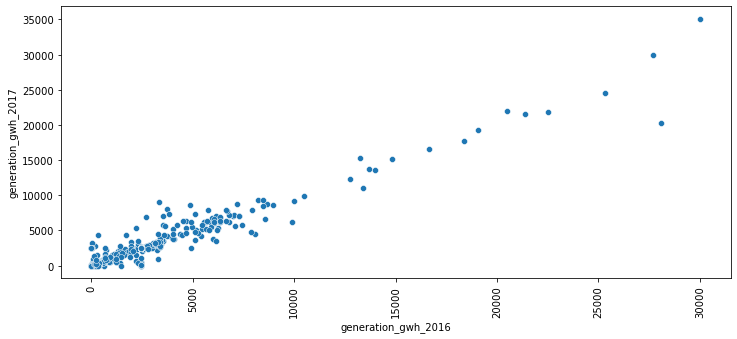

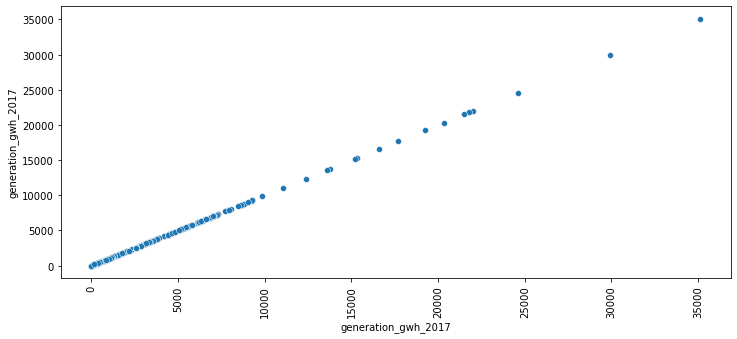

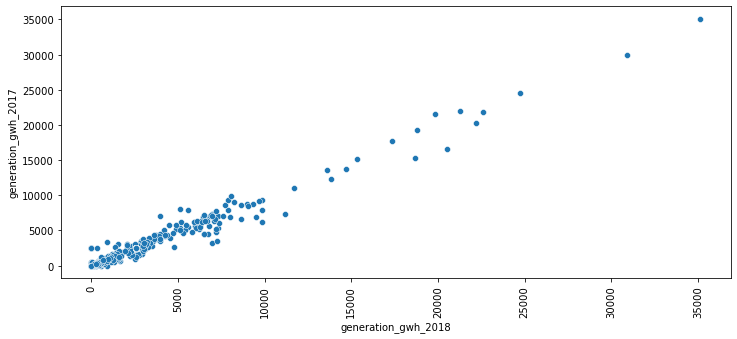

In [41]:
for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.scatterplot(x=df[i],y='generation_gwh_2017',data=df)
    plt.xticks(rotation=90)

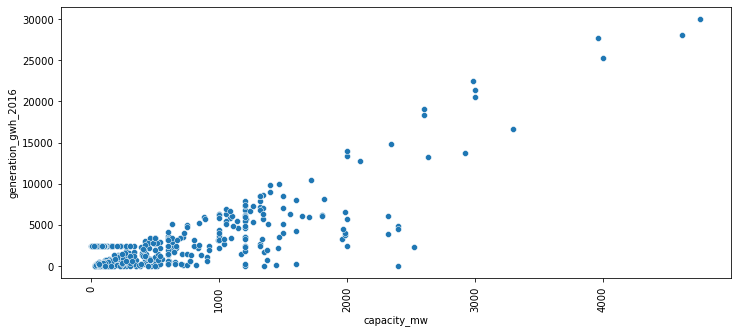

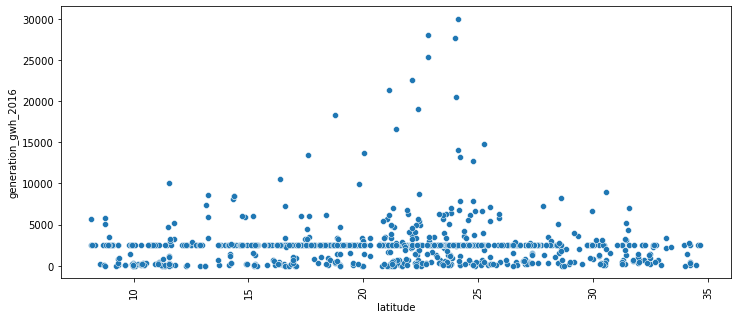

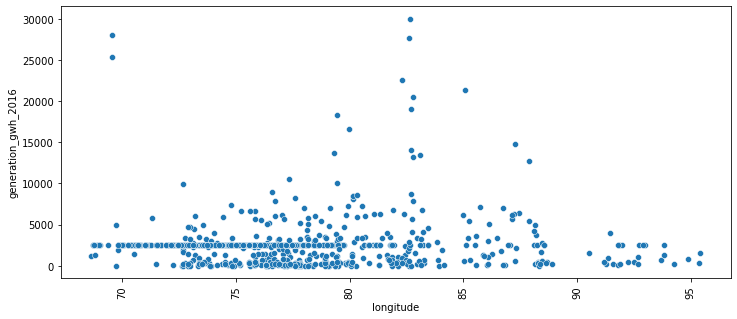

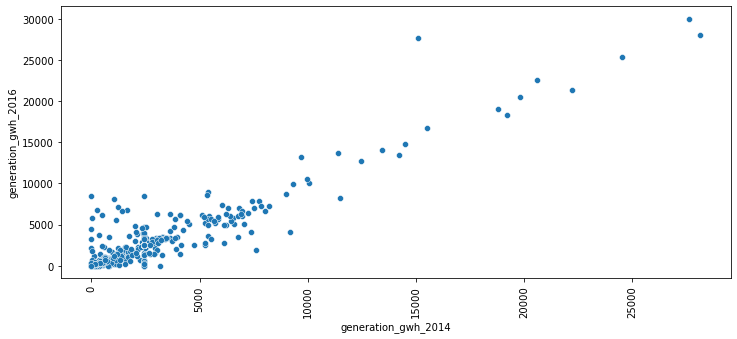

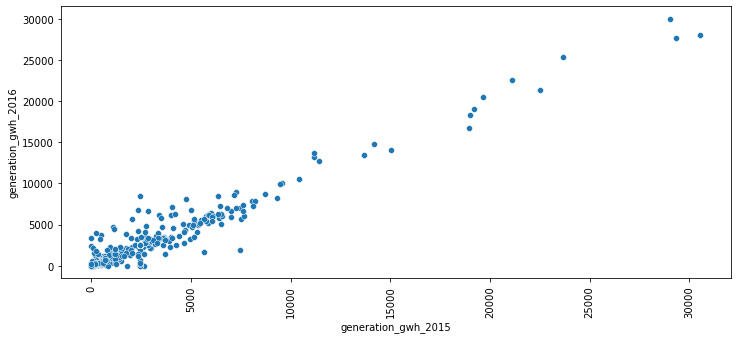

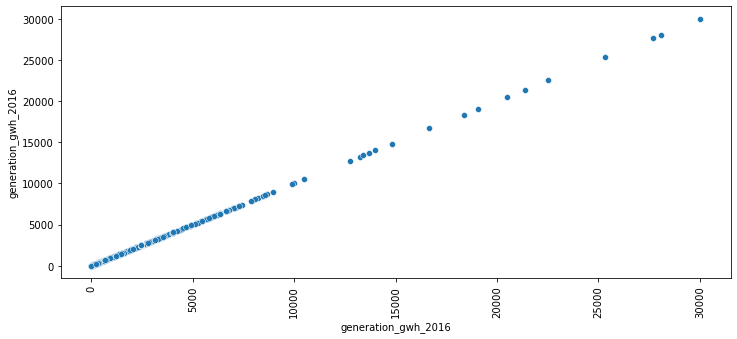

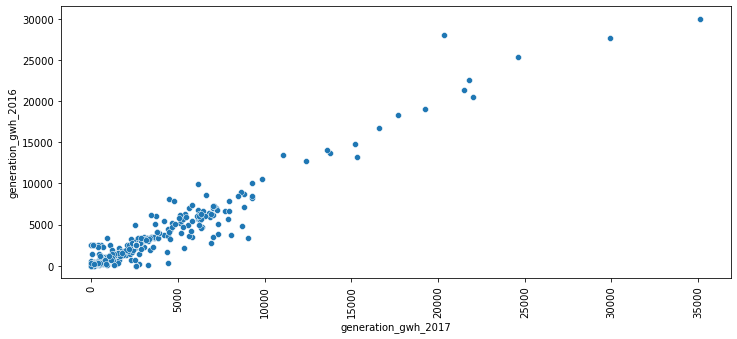

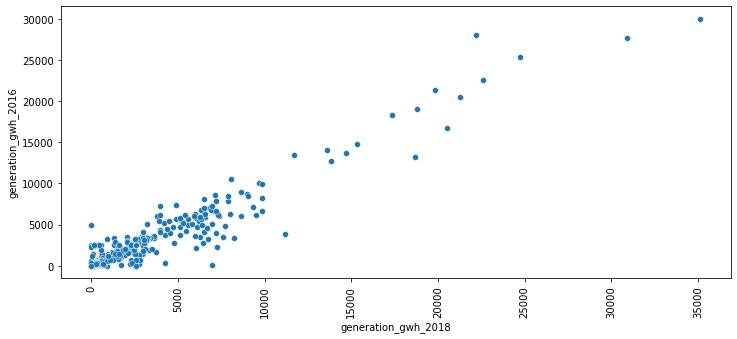

In [40]:
for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.scatterplot(x=df[i],y='generation_gwh_2016',data=df)
    plt.xticks(rotation=90)

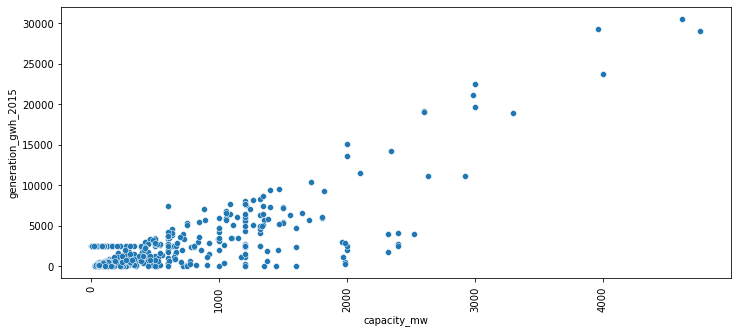

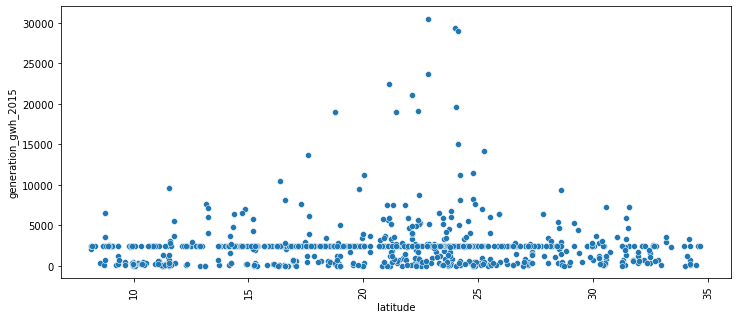

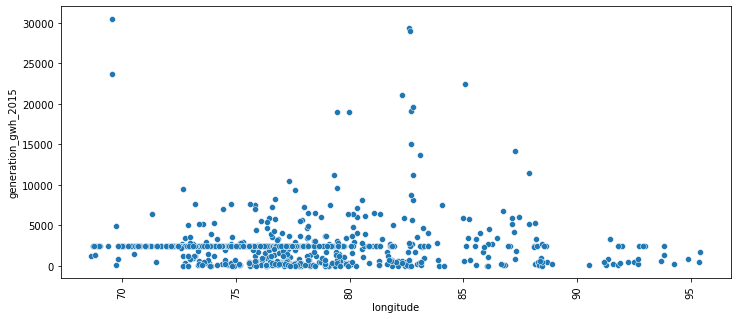

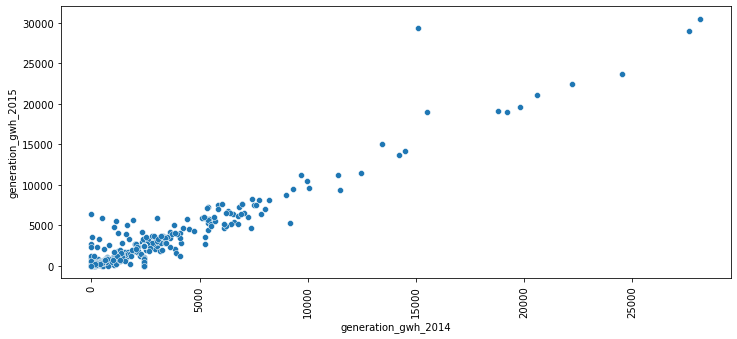

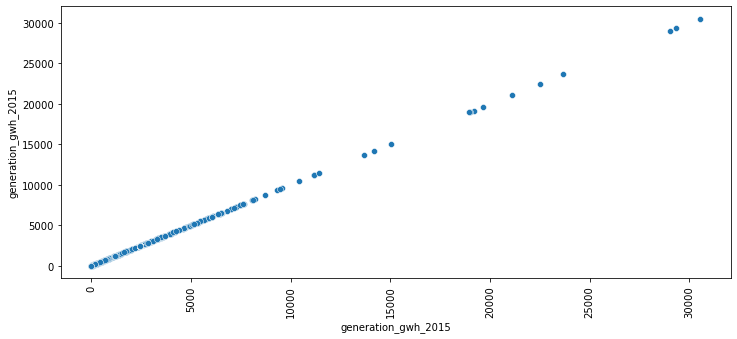

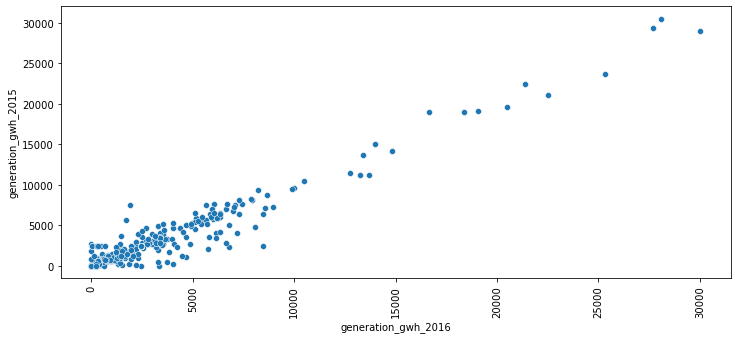

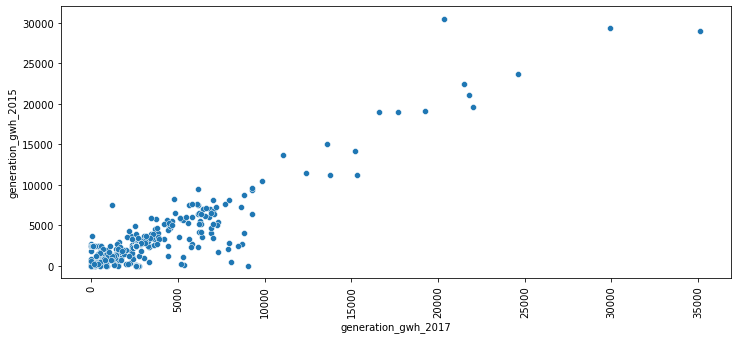

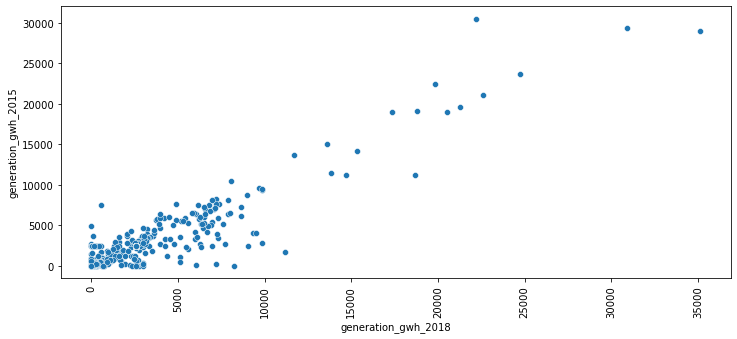

In [39]:
for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.scatterplot(x=df[i],y='generation_gwh_2015',data=df)
    plt.xticks(rotation=90)

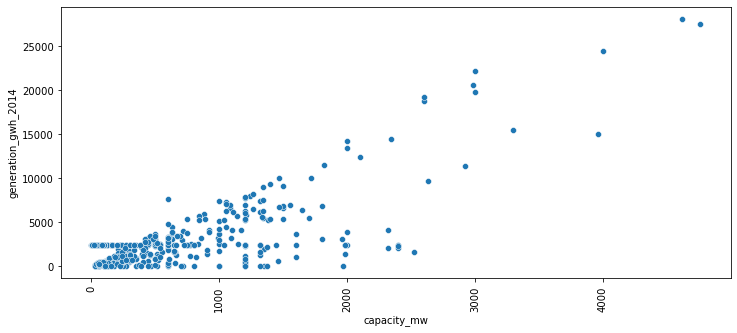

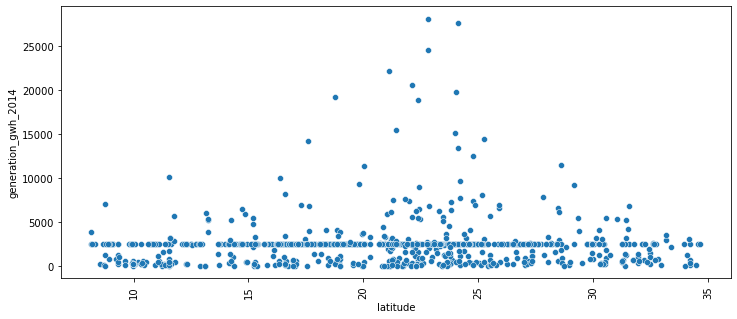

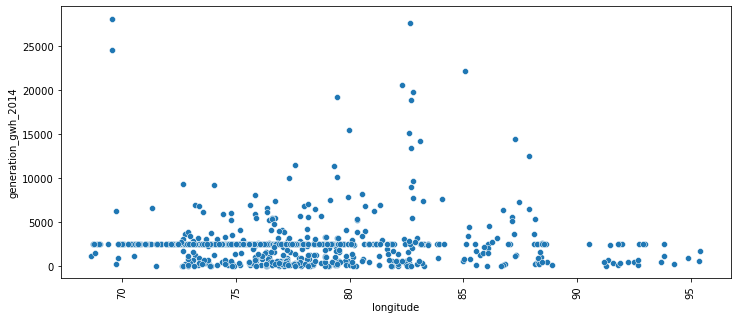

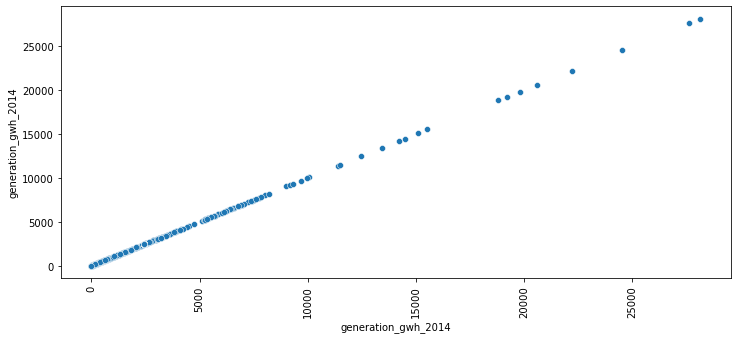

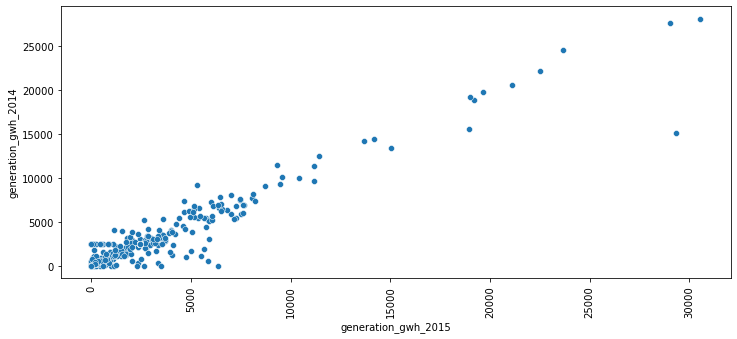

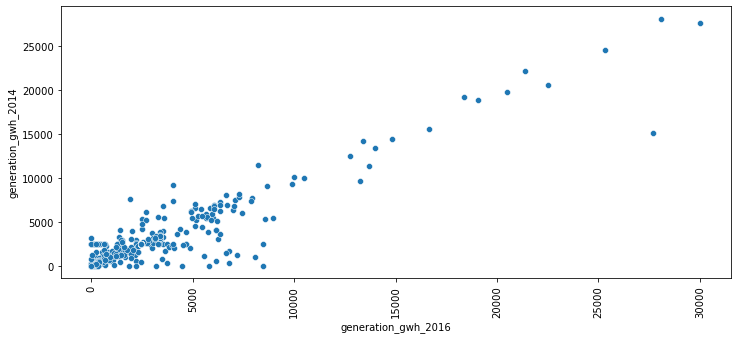

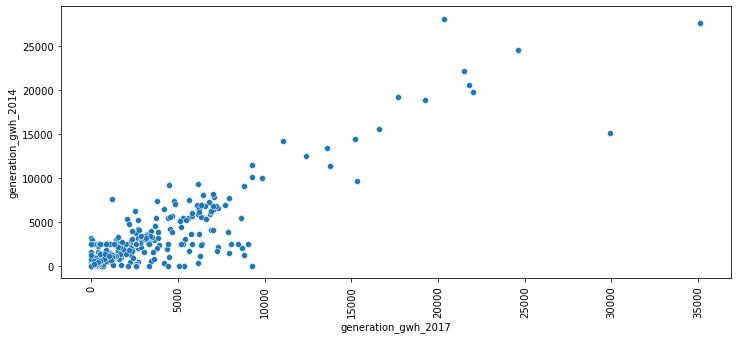

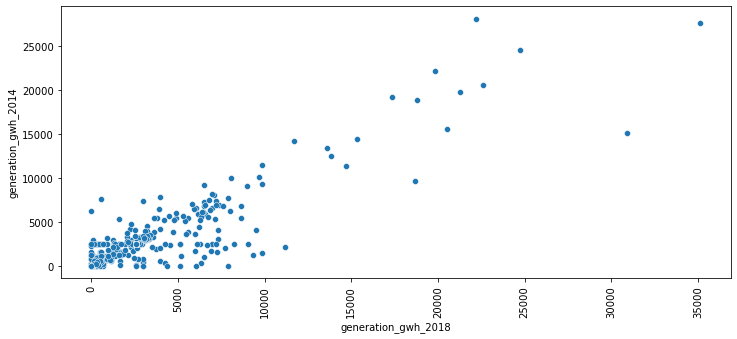

In [38]:
for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.scatterplot(x=df[i],y='generation_gwh_2014',data=df)
    plt.xticks(rotation=90)

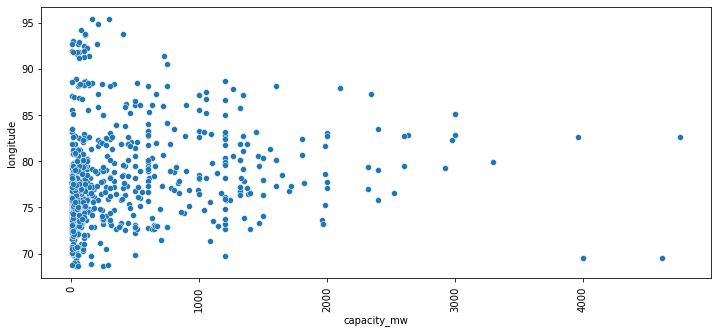

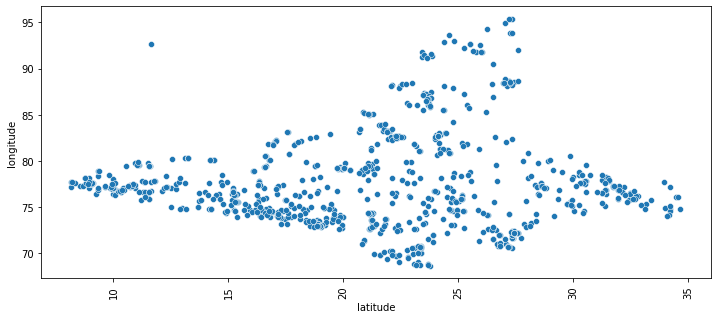

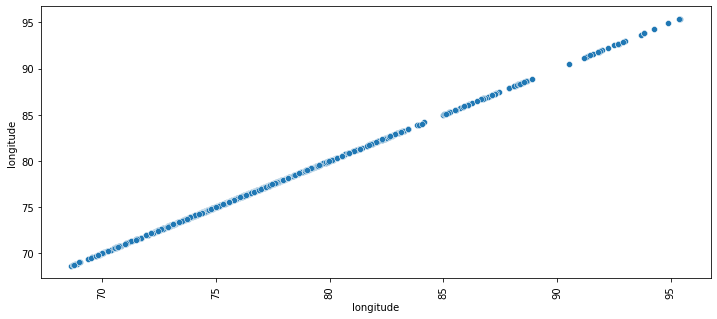

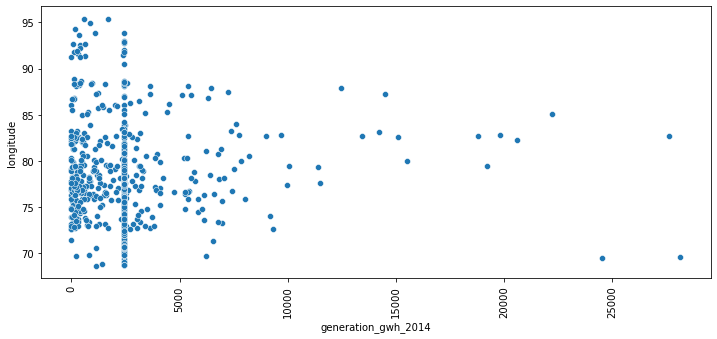

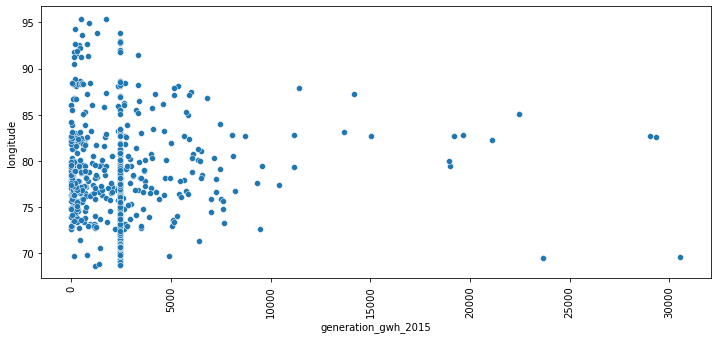

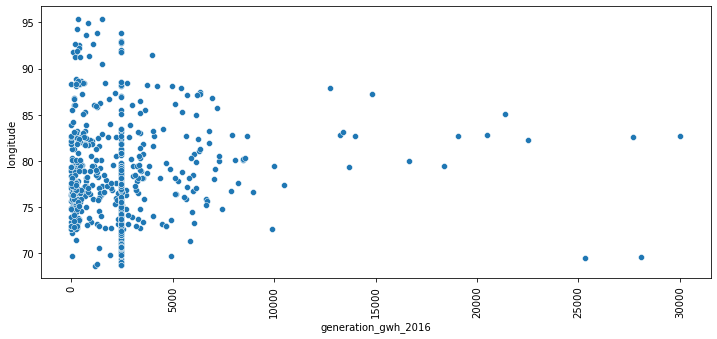

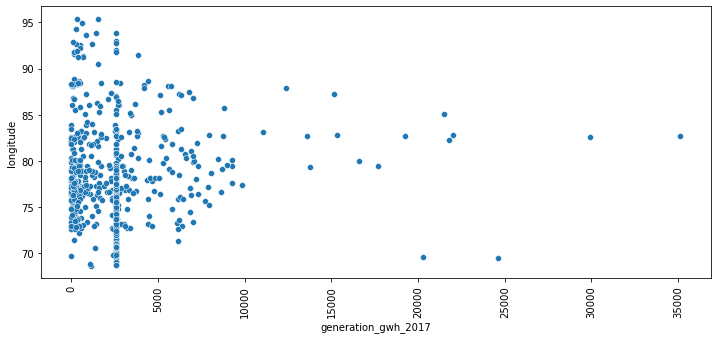

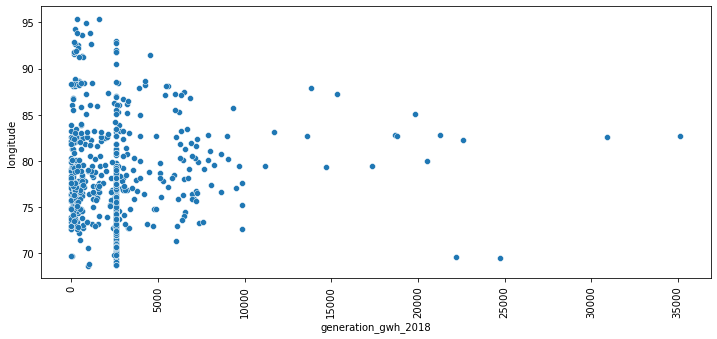

In [37]:
for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.scatterplot(x=df[i],y='longitude',data=df)
    plt.xticks(rotation=90)

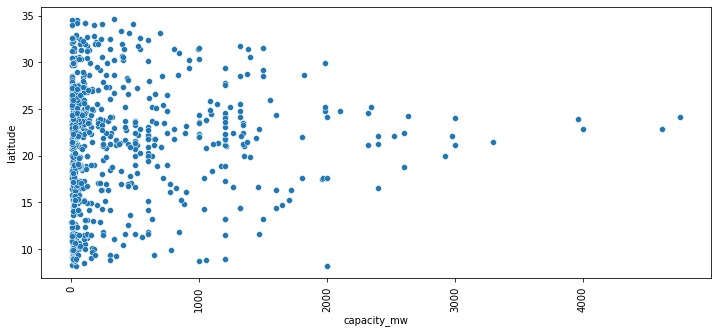

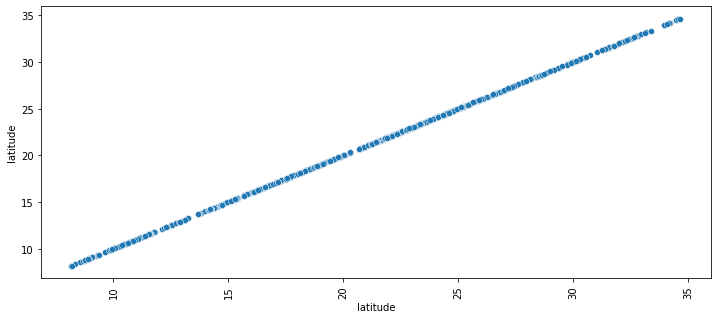

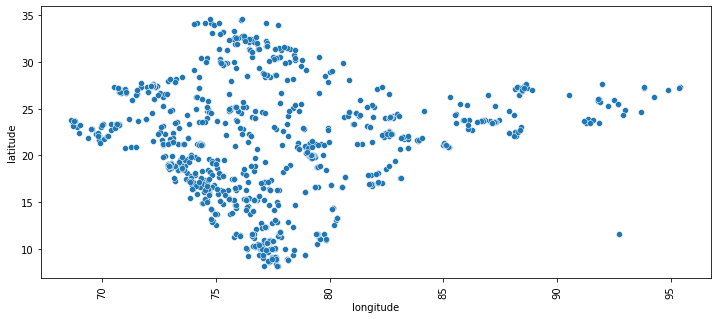

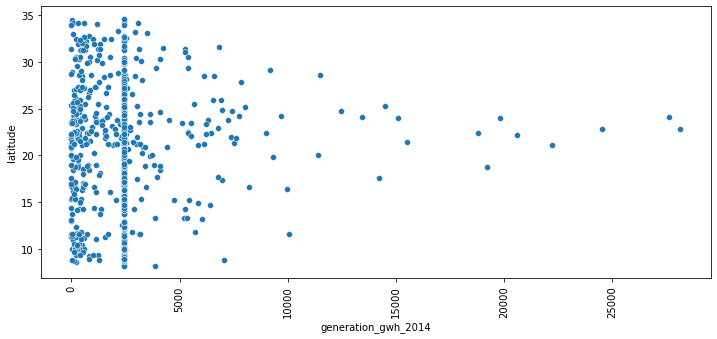

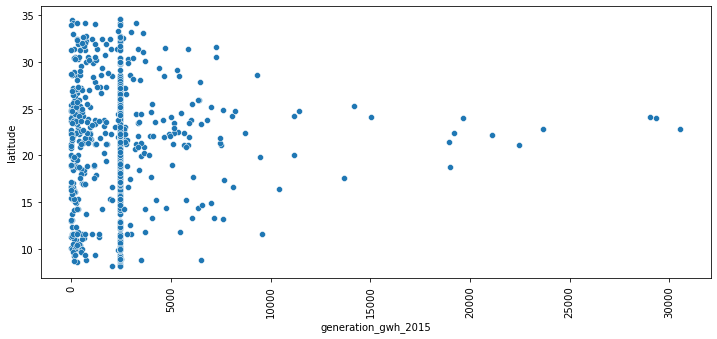

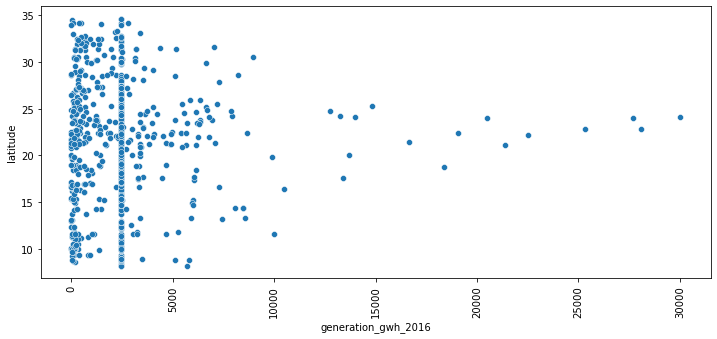

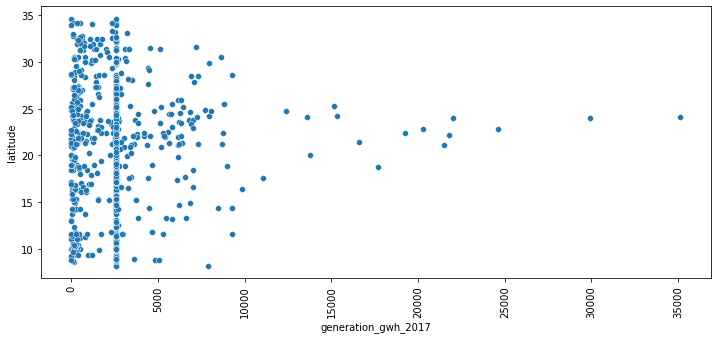

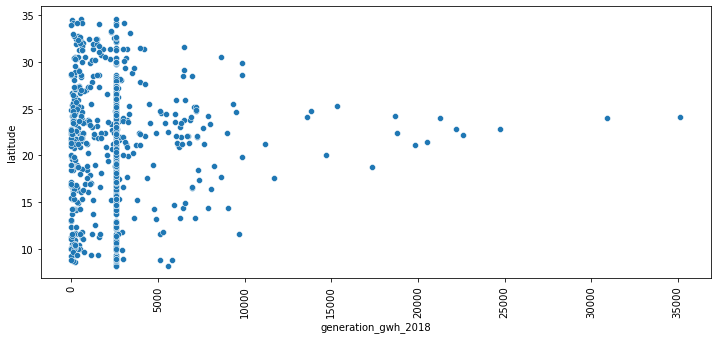

In [36]:
for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.scatterplot(x=df[i],y='latitude',data=df)
    plt.xticks(rotation=90)

In [32]:
cont_columns

Index(['capacity_mw', 'latitude', 'longitude', 'generation_gwh_2014',
       'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017',
       'generation_gwh_2018'],
      dtype='object')

In [56]:
cat_columns

Index(['country', 'country_long', 'name', 'gppd_idnr', 'primary_fuel',
       'commissioning_year', 'owner', 'source', 'url', 'geolocation_source',
       'year_of_capacity_data', 'generation_data_source'],
      dtype='object')

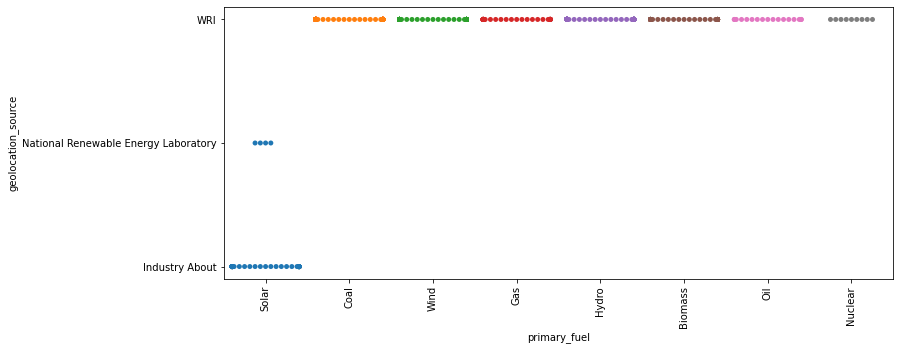

In [63]:
# Catplots

plt.figure(figsize=(12,5))
sns.swarmplot(x='primary_fuel',y='geolocation_source',data=df)
plt.xticks(rotation=90)
plt.show()

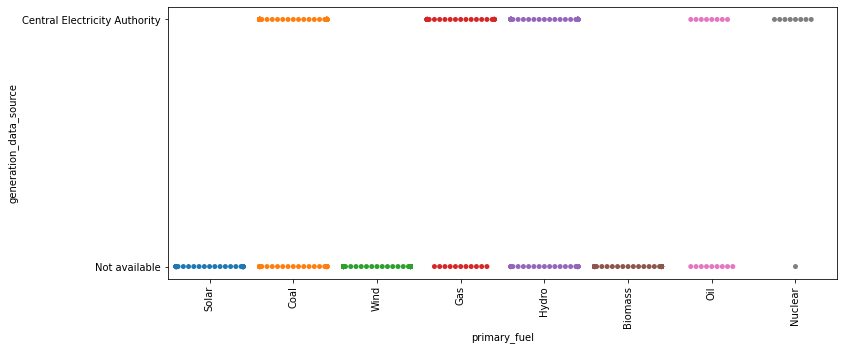

In [67]:
plt.figure(figsize=(12,5))
sns.swarmplot(x='primary_fuel',y='generation_data_source',data=df)
plt.xticks(rotation=90)
plt.show()

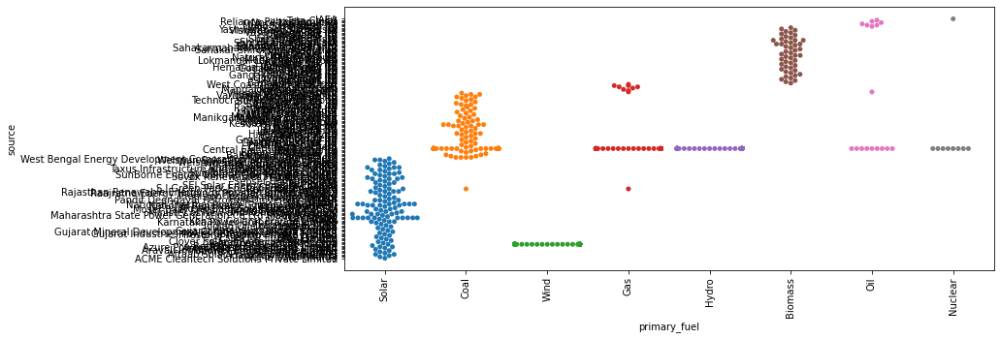

In [65]:
plt.figure(figsize=(12,5))
sns.swarmplot(x='primary_fuel',y='source',data=df)
plt.xticks(rotation=90)
plt.show()

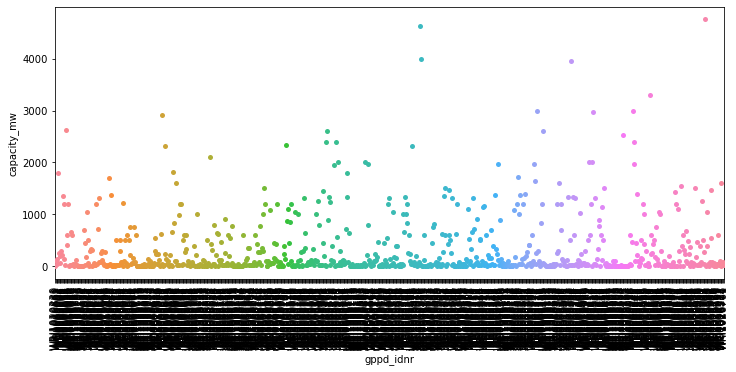

In [71]:
plt.figure(figsize=(12,5))
sns.swarmplot(x='gppd_idnr',y='capacity_mw',data=df)
plt.xticks(rotation=90)
plt.show()

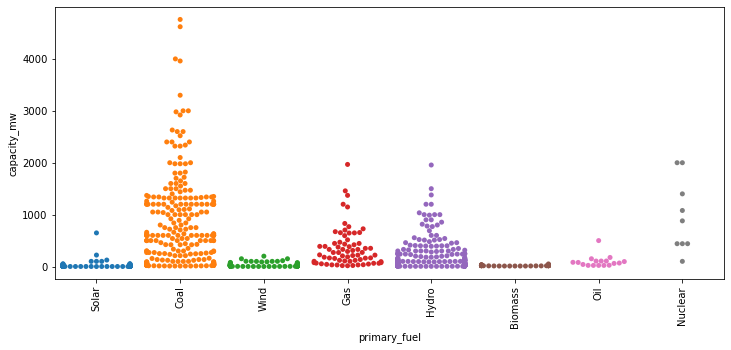

In [68]:
plt.figure(figsize=(12,5))
sns.swarmplot(x='primary_fuel',y='capacity_mw',data=df)
plt.xticks(rotation=90)
plt.show()

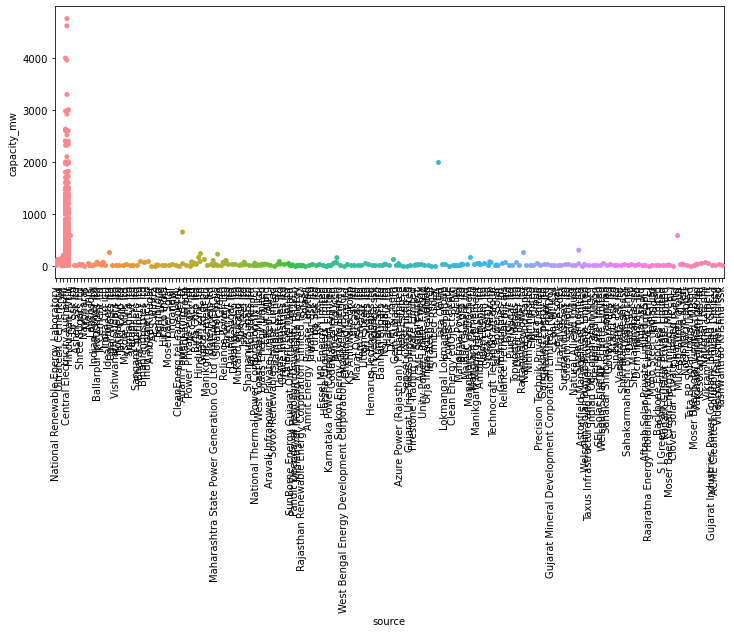

In [69]:
plt.figure(figsize=(12,5))
sns.swarmplot(x='source',y='capacity_mw',data=df)
plt.xticks(rotation=90)
plt.show()

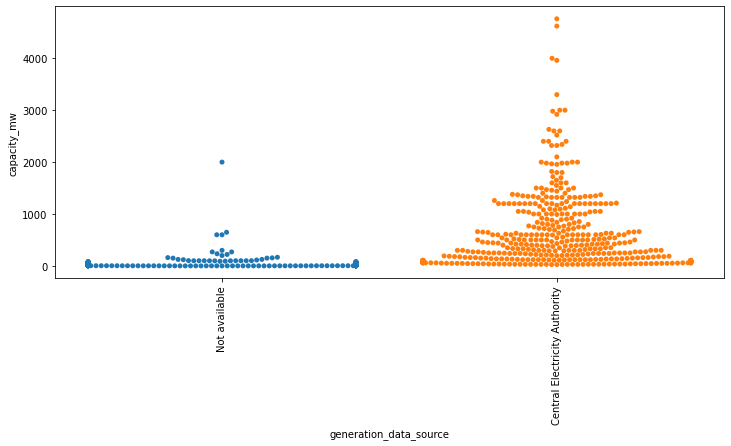

In [70]:
plt.figure(figsize=(12,5))
sns.swarmplot(x='generation_data_source',y='capacity_mw',data=df)
plt.xticks(rotation=90)
plt.show()

In [ ]:
# Relation plots

<Figure size 864x360 with 0 Axes>

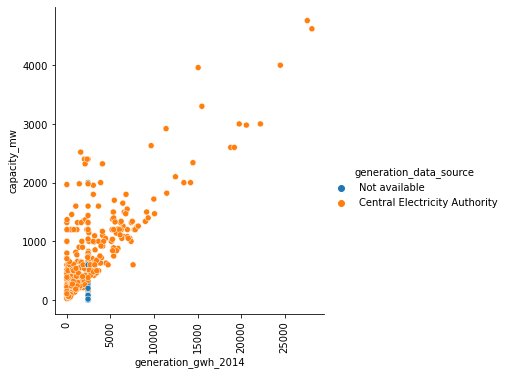

<Figure size 864x360 with 0 Axes>

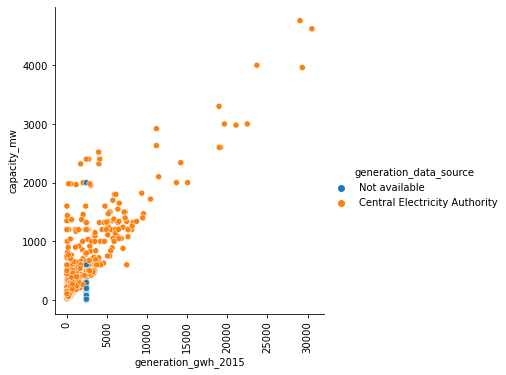

In [56]:
plt.figure(figsize=(12,5))
sns.relplot('generation_gwh_2015','capacity_mw',data=df,hue='generation_data_source')
plt.xlabel('generation_gwh_2015')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 864x360 with 0 Axes>

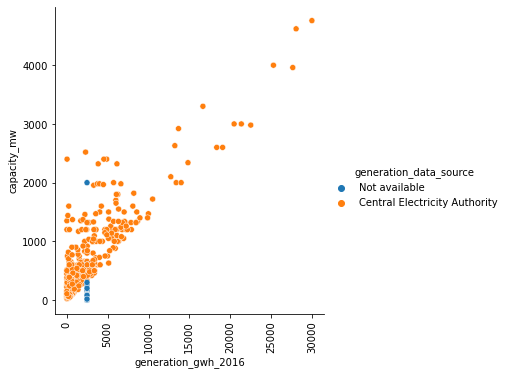

In [52]:
plt.figure(figsize=(12,5))
sns.relplot('generation_gwh_2016','capacity_mw',data=df,hue='generation_data_source')
plt.xlabel('generation_gwh_2016')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 864x360 with 0 Axes>

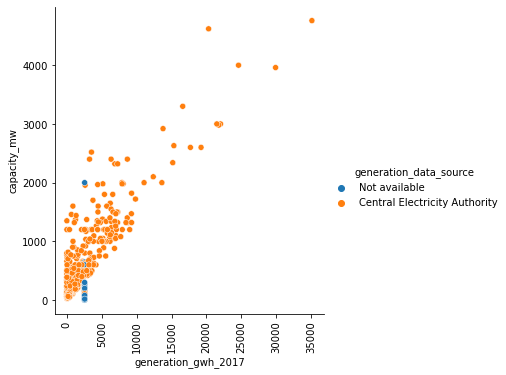

In [53]:
plt.figure(figsize=(12,5))
sns.relplot('generation_gwh_2017','capacity_mw',data=df,hue='generation_data_source')
plt.xlabel('generation_gwh_2017')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 864x360 with 0 Axes>

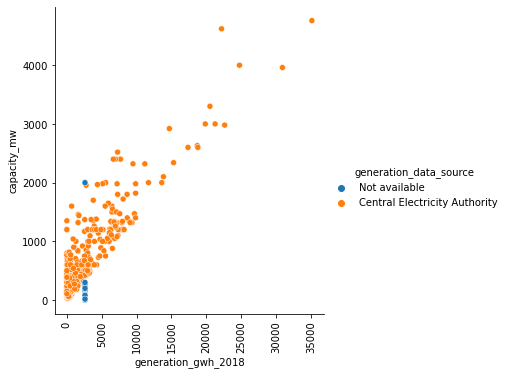

In [54]:
plt.figure(figsize=(12,5))
sns.relplot('generation_gwh_2018','capacity_mw',data=df,hue='generation_data_source')
plt.xlabel('generation_gwh_2018')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 864x360 with 0 Axes>

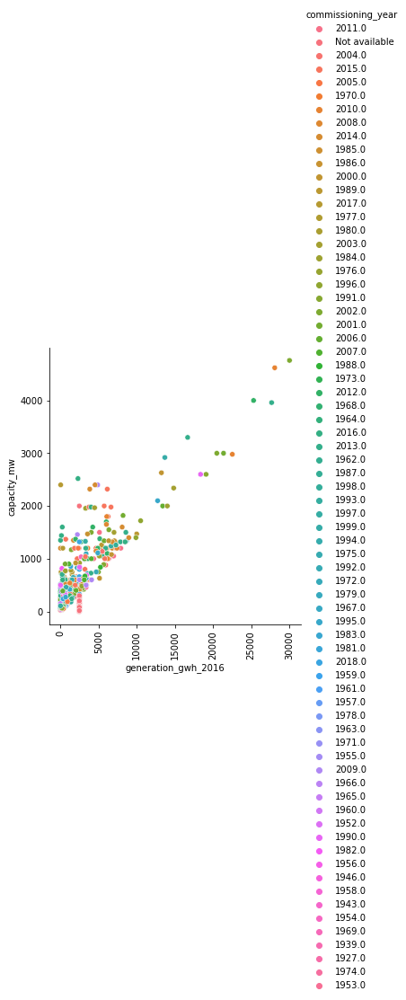

In [50]:
plt.figure(figsize=(12,5))
sns.relplot('generation_gwh_2016','capacity_mw',data=df,hue='commissioning_year')
plt.xlabel('generation_gwh_2016')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 864x360 with 0 Axes>

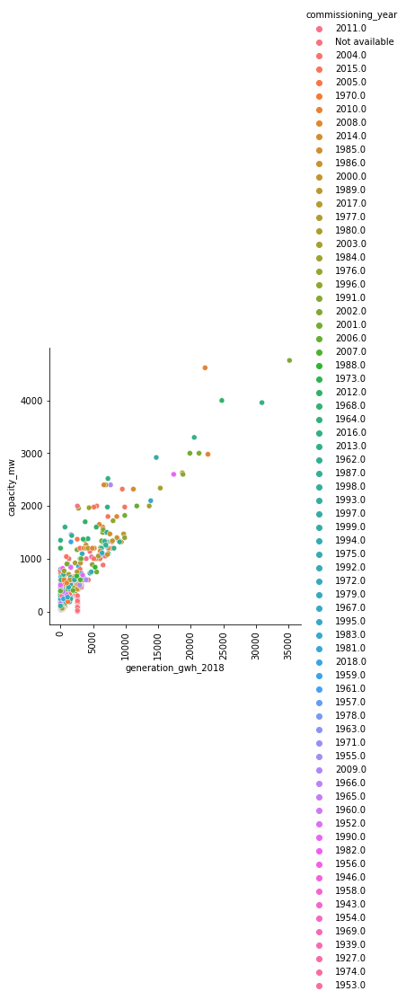

In [49]:
plt.figure(figsize=(12,5))
sns.relplot('generation_gwh_2018','capacity_mw',data=df,hue='commissioning_year')
plt.xlabel('generation_gwh_2018')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 864x360 with 0 Axes>

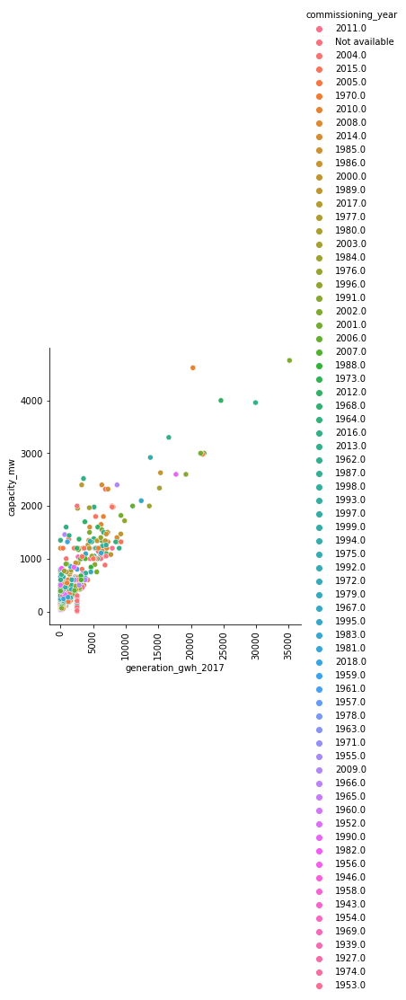

In [51]:
plt.figure(figsize=(12,5))
sns.relplot('generation_gwh_2017','capacity_mw',data=df,hue='commissioning_year')
plt.xlabel('generation_gwh_2017')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 864x360 with 0 Axes>

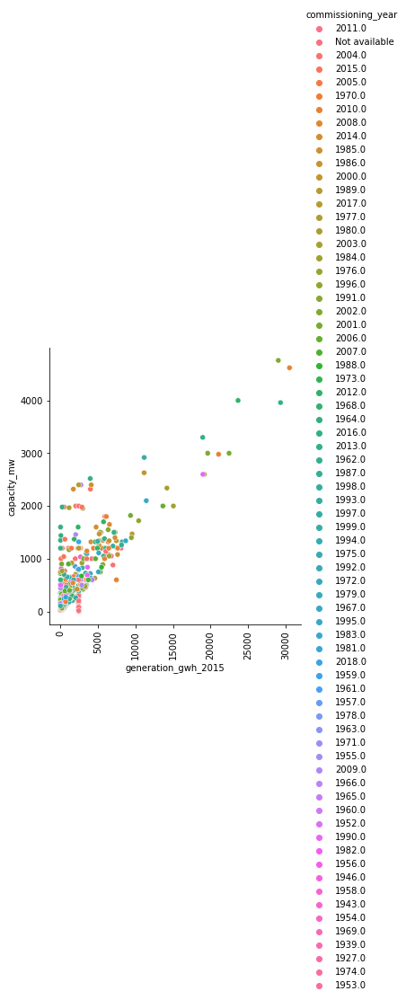

In [48]:
plt.figure(figsize=(12,5))
sns.relplot('generation_gwh_2015','capacity_mw',data=df,hue='commissioning_year')
plt.xlabel('generation_gwh_2015')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 864x360 with 0 Axes>

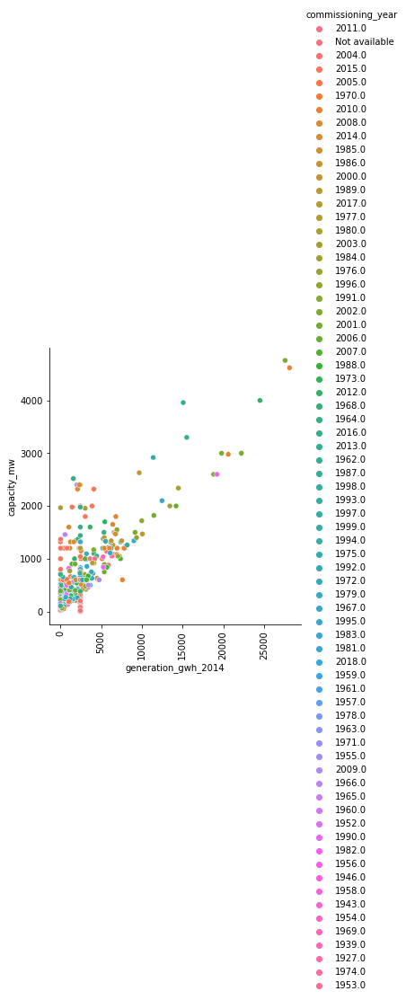

In [47]:
plt.figure(figsize=(12,5))
sns.relplot('generation_gwh_2014','capacity_mw',data=df,hue='commissioning_year')
plt.xlabel('generation_gwh_2014')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 864x360 with 0 Axes>

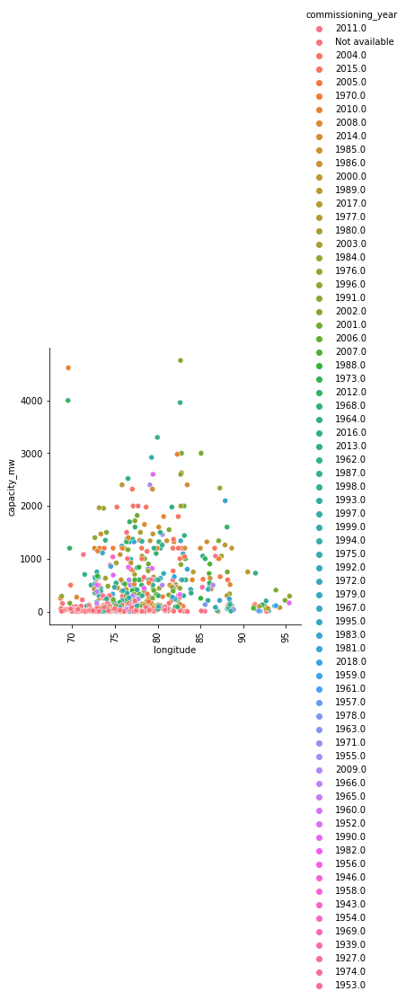

In [46]:
plt.figure(figsize=(12,5))
sns.relplot('longitude','capacity_mw',data=df,hue='commissioning_year')
plt.xlabel('longitude')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 864x360 with 0 Axes>

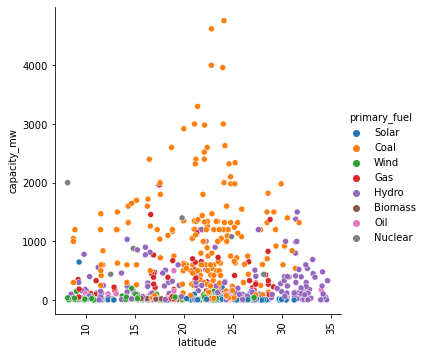

In [44]:
plt.figure(figsize=(12,5))
sns.relplot('latitude','capacity_mw',data=df,hue='primary_fuel')
plt.xlabel('latitude')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 864x360 with 0 Axes>

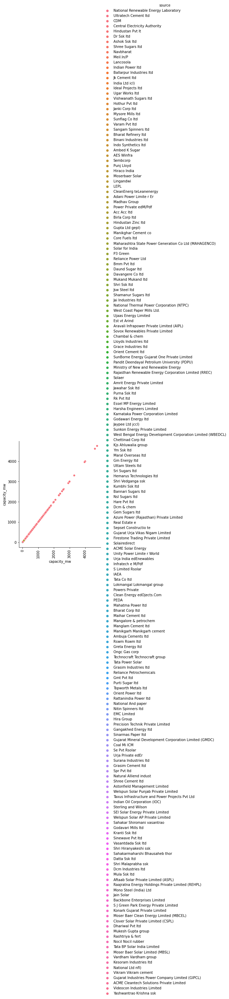

<Figure size 864x360 with 0 Axes>

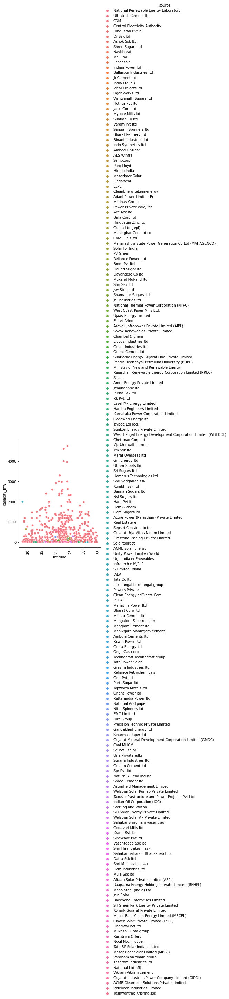

<Figure size 864x360 with 0 Axes>

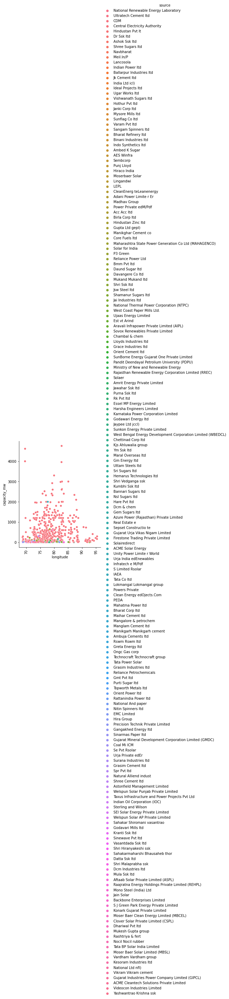

<Figure size 864x360 with 0 Axes>

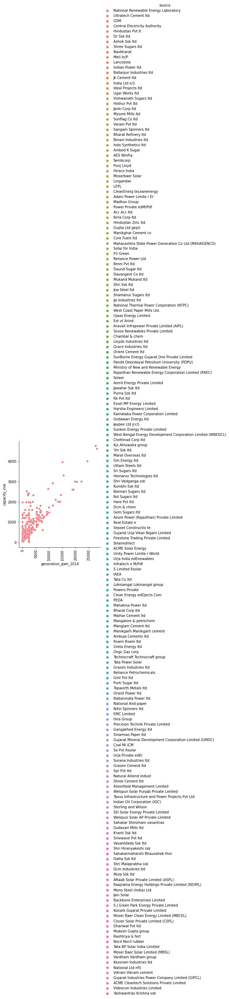

<Figure size 864x360 with 0 Axes>

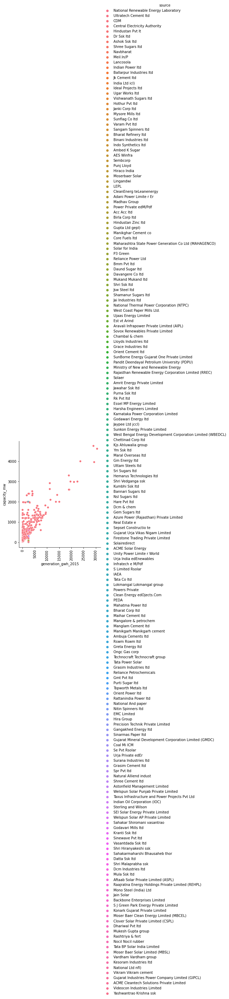

<Figure size 864x360 with 0 Axes>

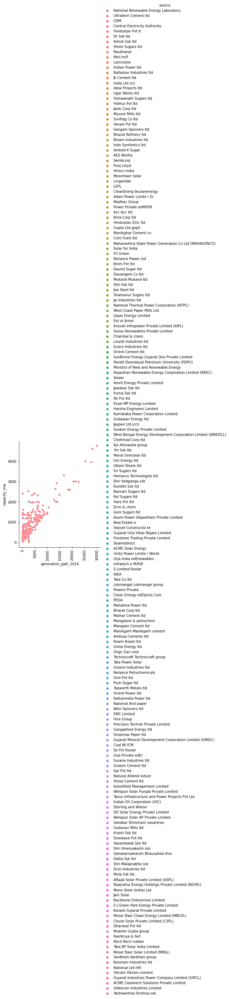

<Figure size 864x360 with 0 Axes>

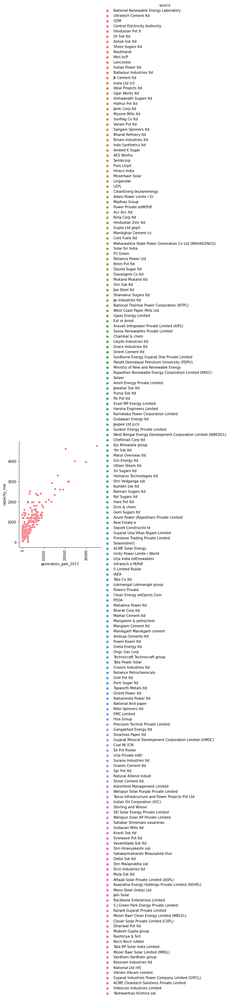

<Figure size 864x360 with 0 Axes>

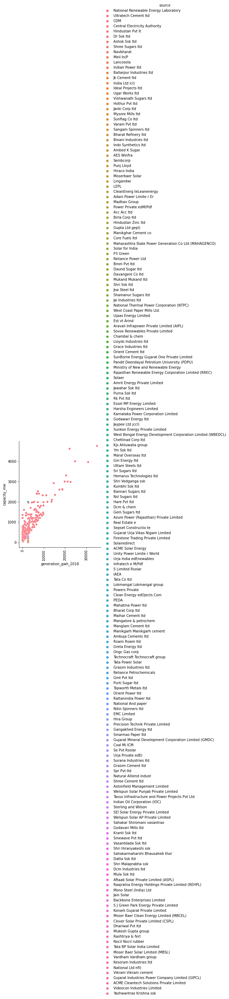

In [57]:
# Relation plots:

for i in cont_columns:
    plt.figure(figsize=(12,5))
    sns.relplot(df[i],'capacity_mw',data=df,hue='source')
    plt.xlabel(i)
    plt.ylabel('capacity_mw')
    plt.xticks(rotation=90)

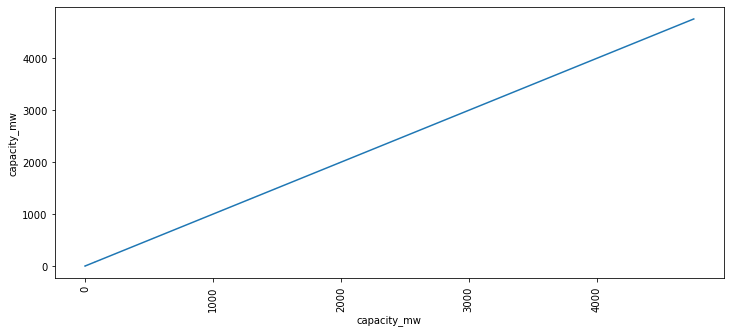

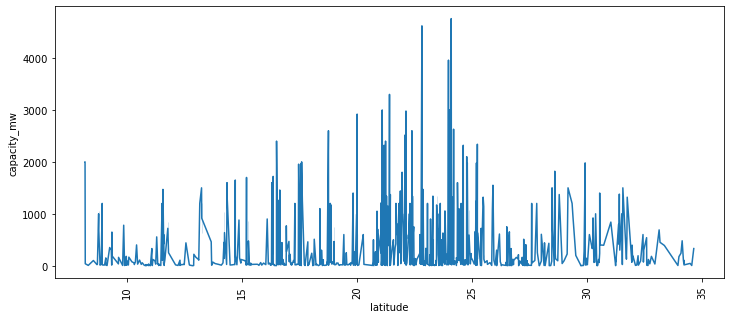

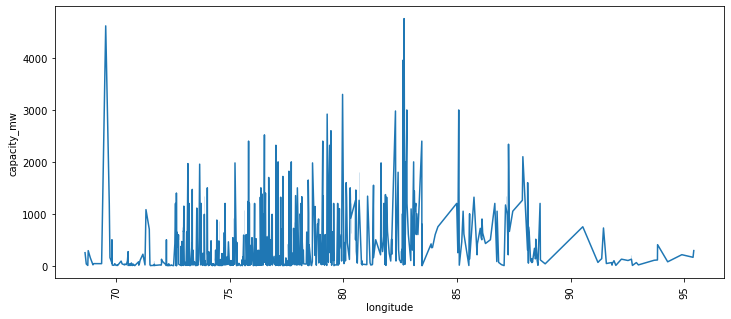

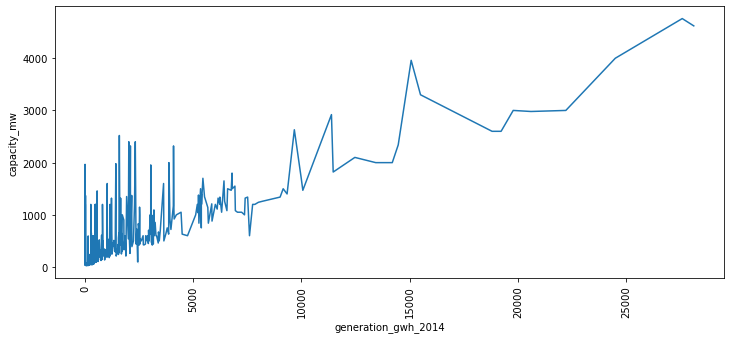

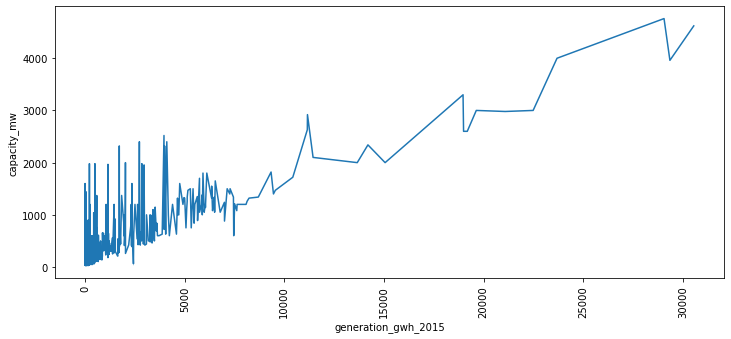

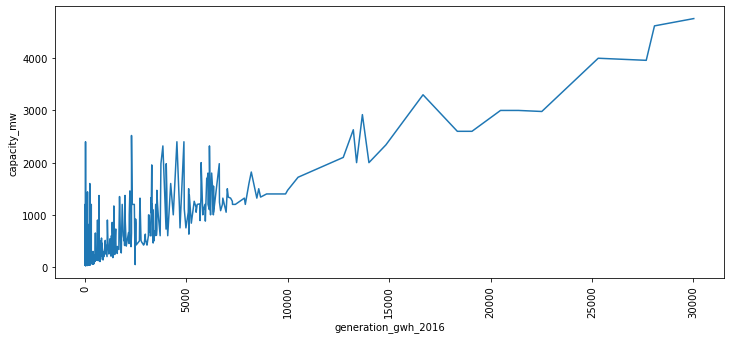

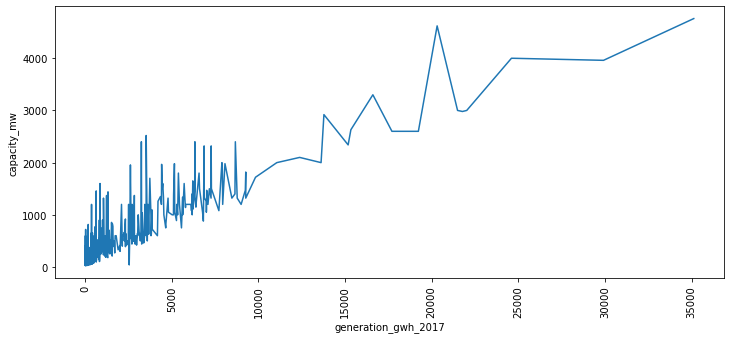

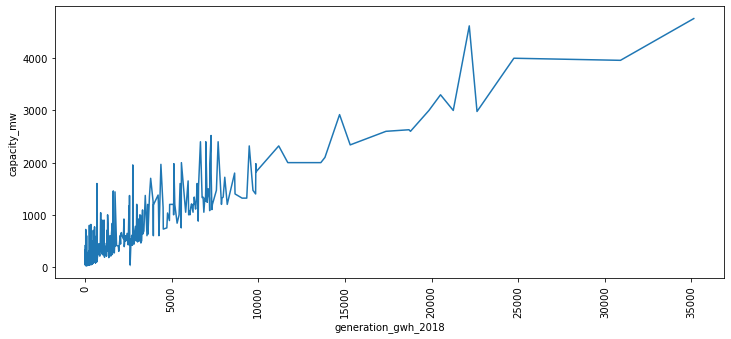

In [46]:
# Lineplot

for i in cont_columns:
    plt.figure(figsize=(12,5))
    sns.lineplot(df[i],'capacity_mw',data=df)
    plt.xlabel(i)
    plt.ylabel('capacity_mw')
    plt.xticks(rotation=90)

In [ ]:
# Univariate analysis using frequency, density and box plots

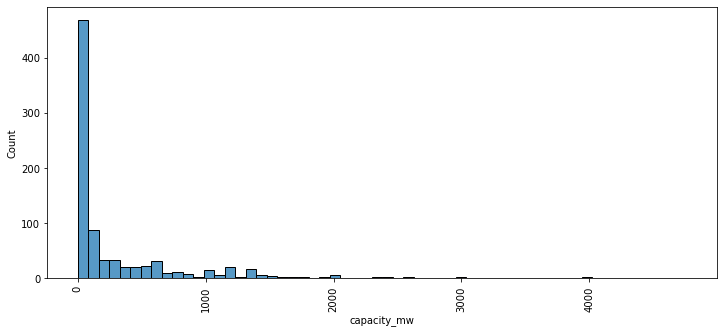

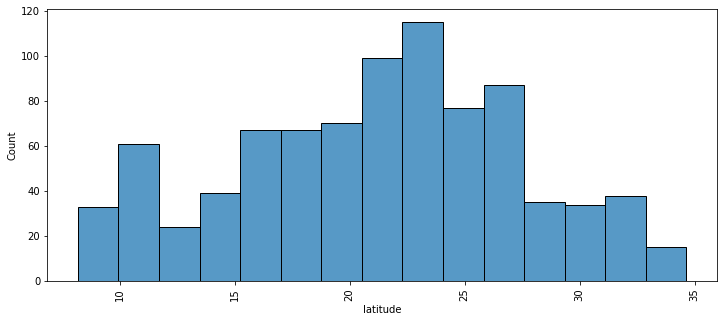

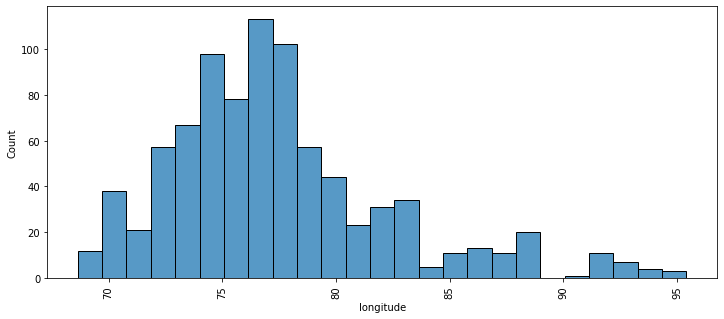

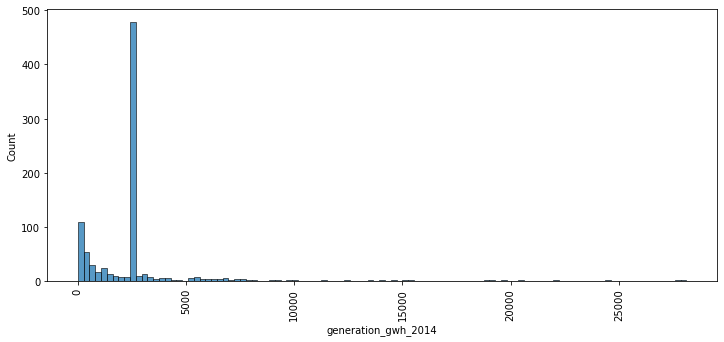

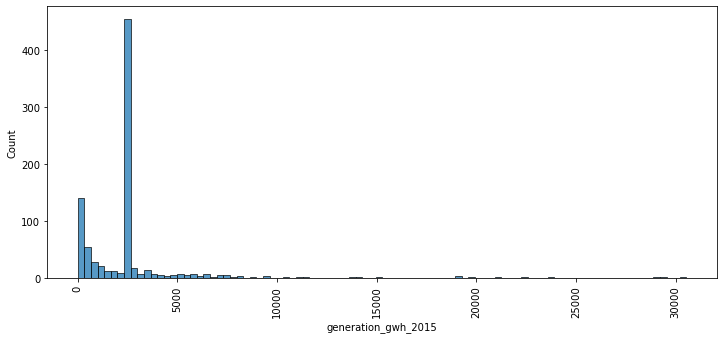

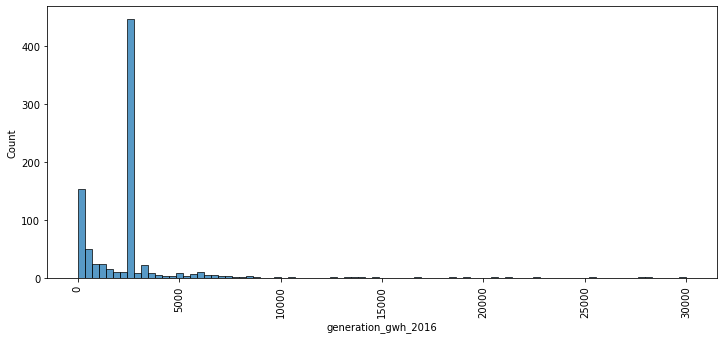

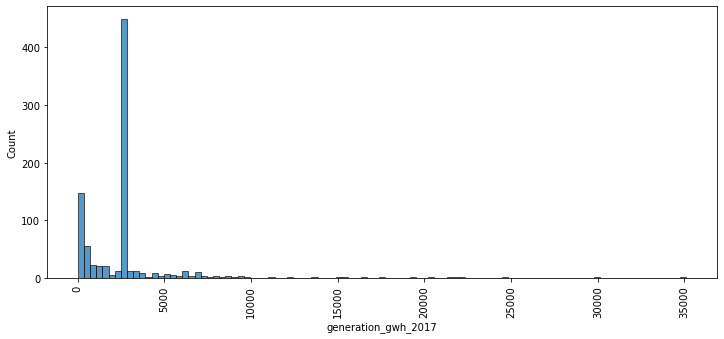

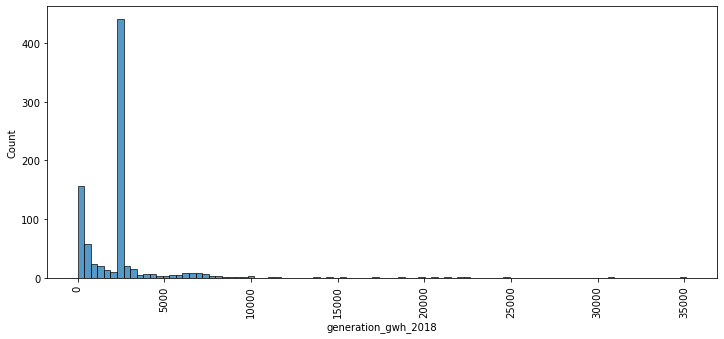

In [47]:
# Hist plot

for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.histplot(x=df[i])
    plt.xlabel(i)
    plt.xticks(rotation=90)

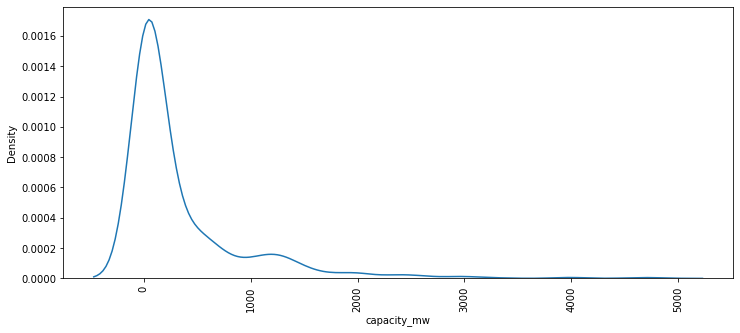

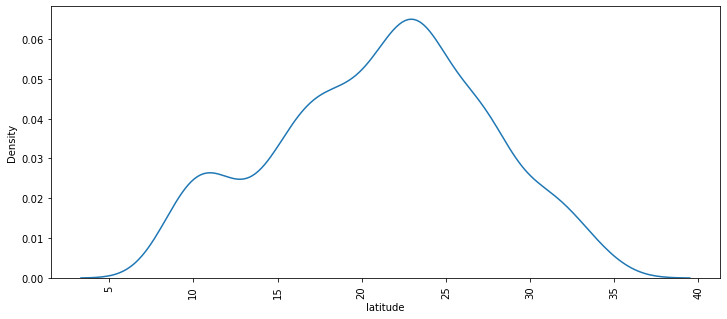

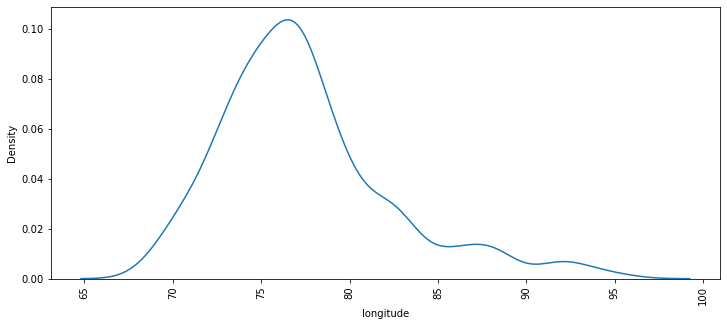

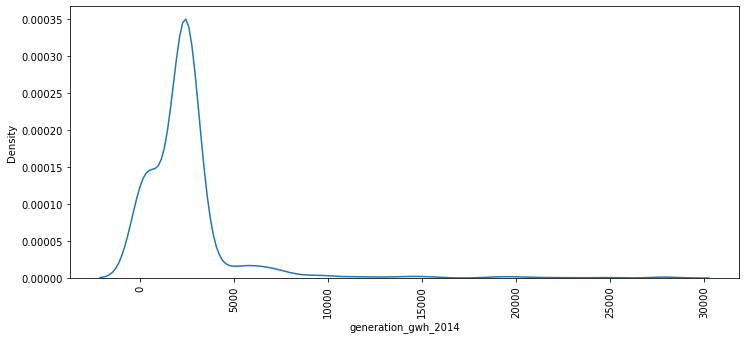

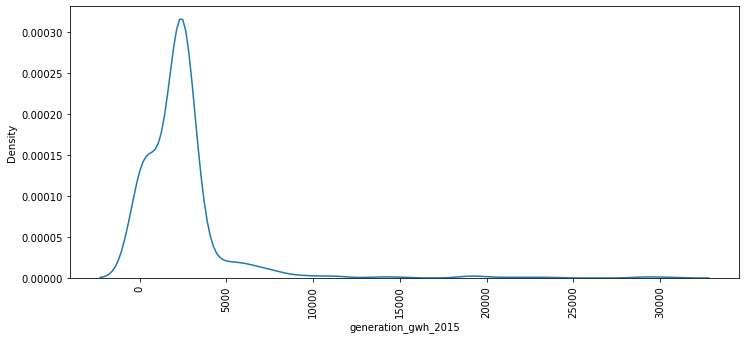

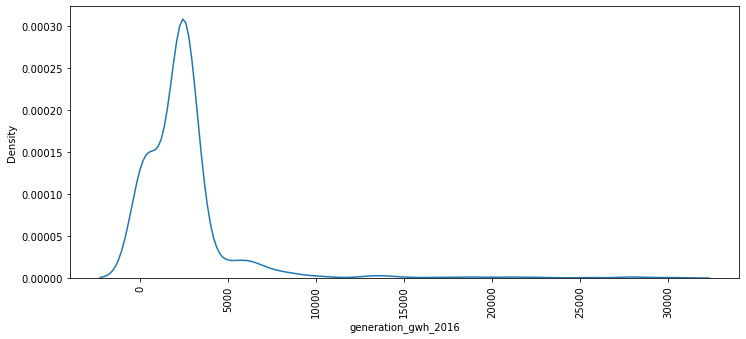

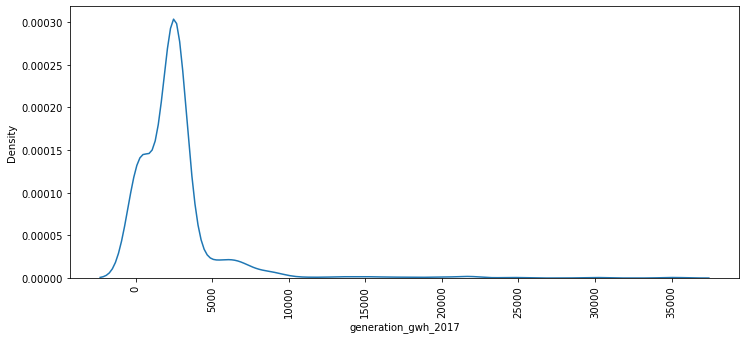

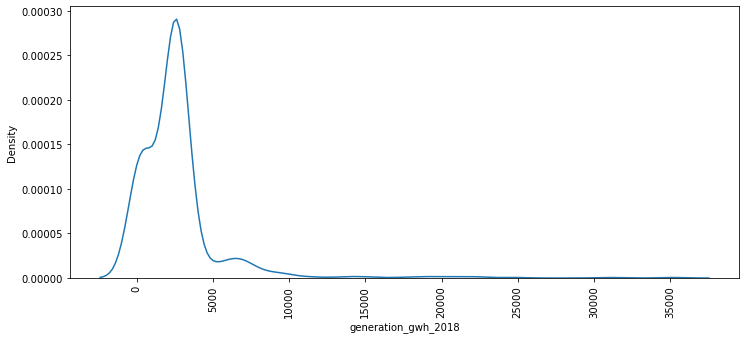

In [52]:
# Kernel density estimation plot

for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.kdeplot(x=df[i])
    plt.xlabel(i)
    plt.xticks(rotation=90)

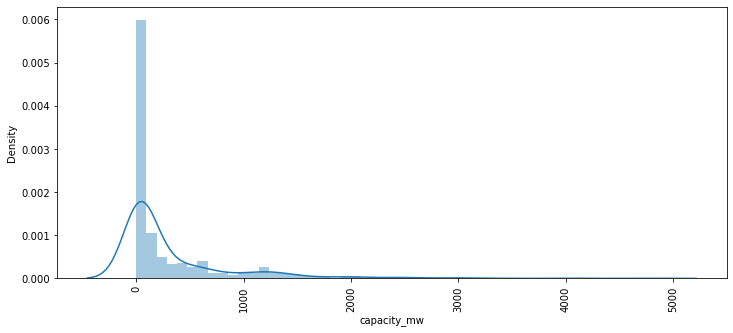

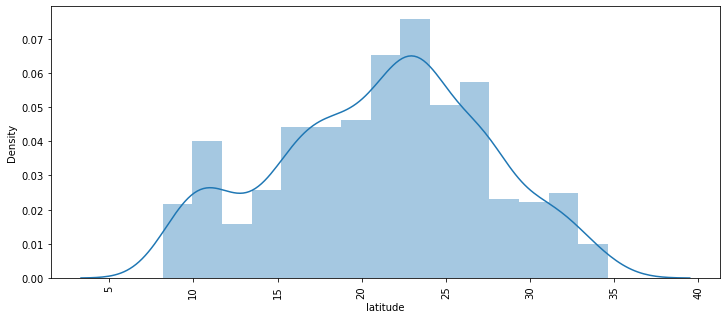

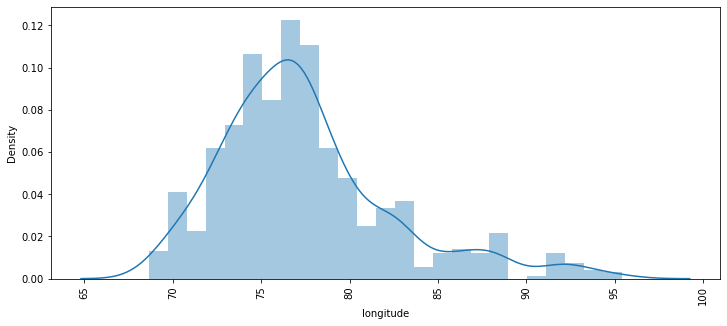

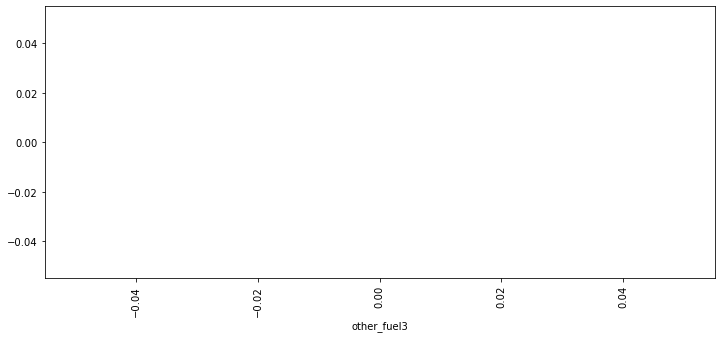

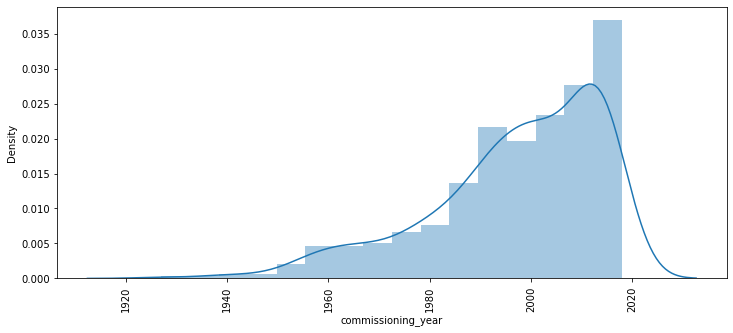

...

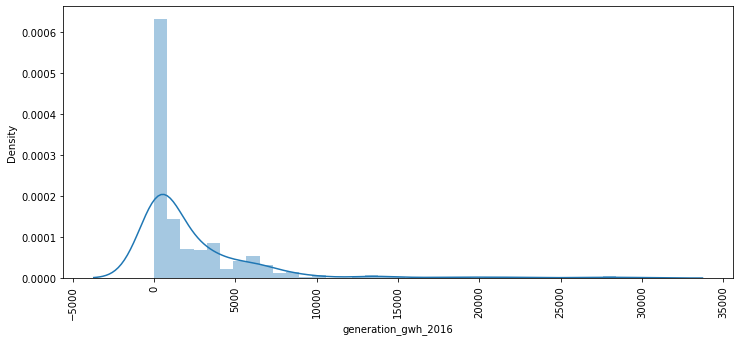

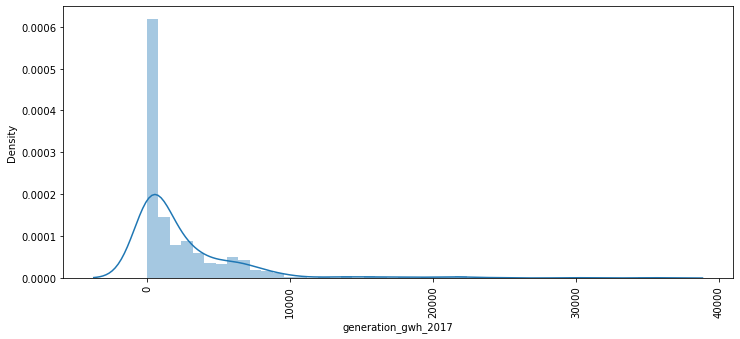

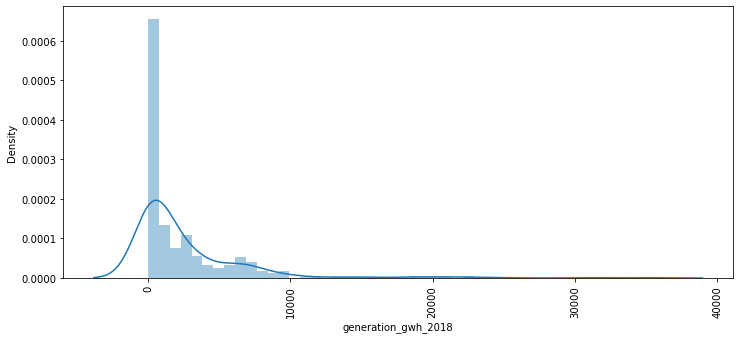

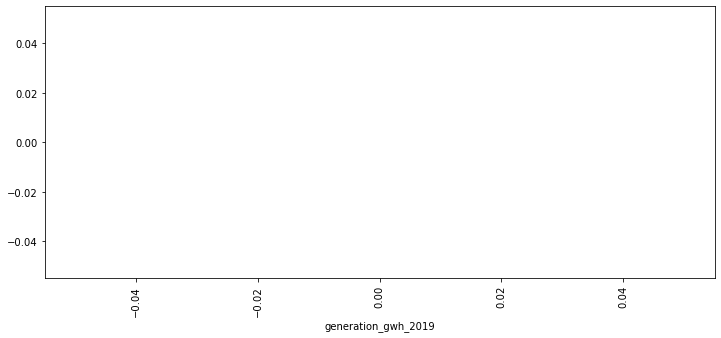

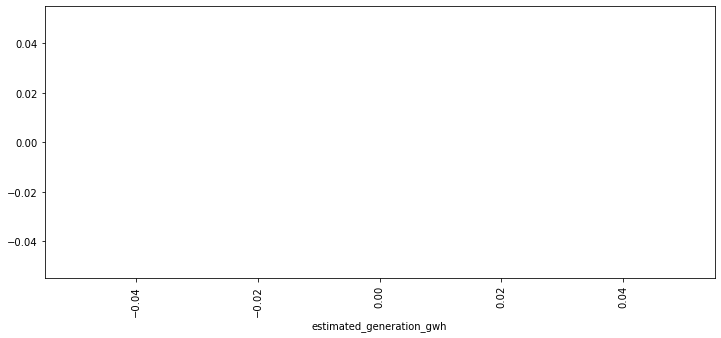

In [46]:
# Distribution plot

for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.distplot(x=df[i])
    plt.xlabel(i)
    plt.xticks(rotation=90)

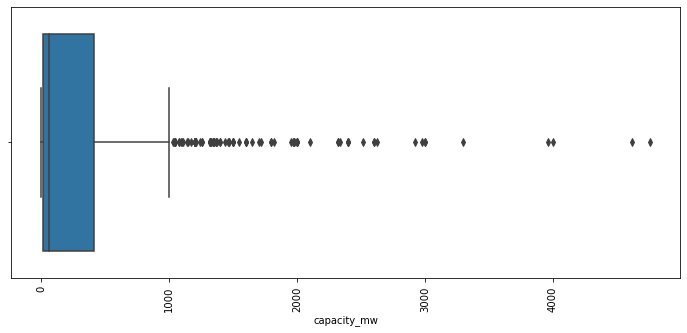

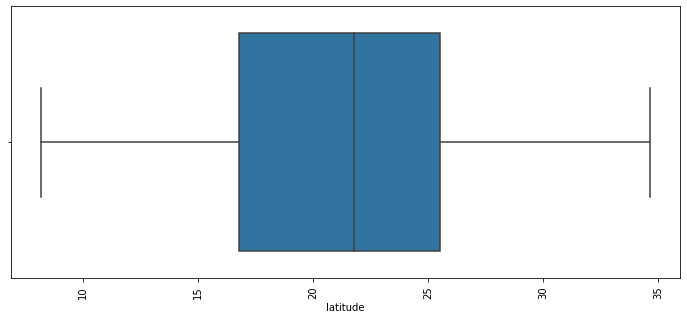

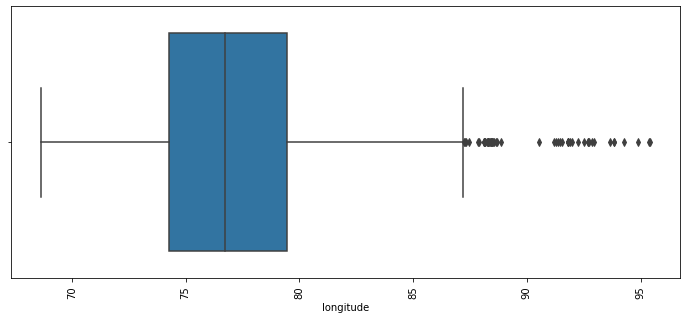

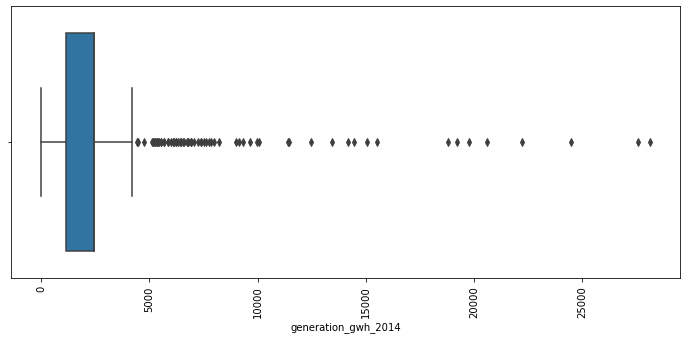

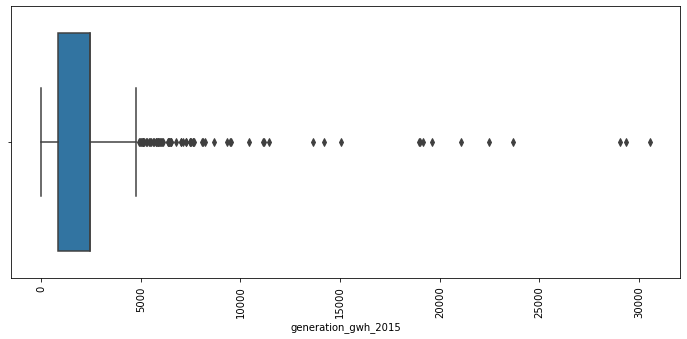

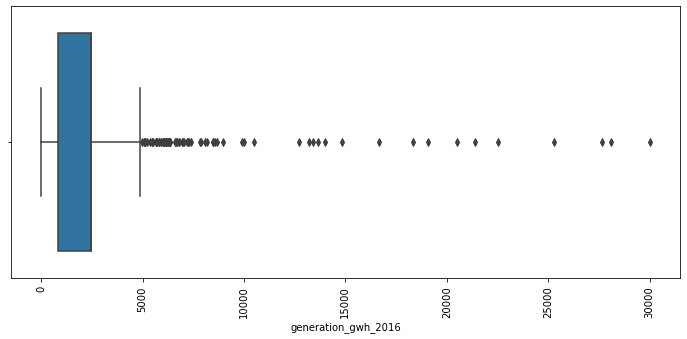

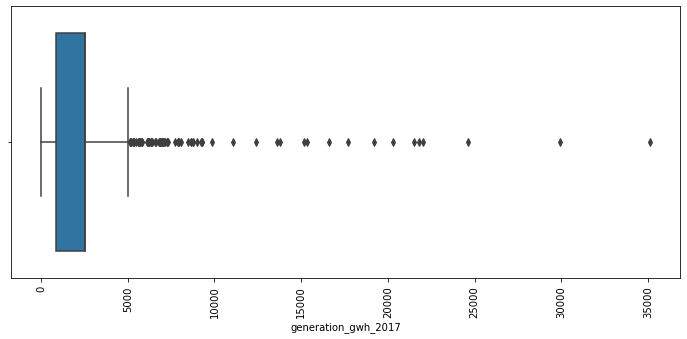

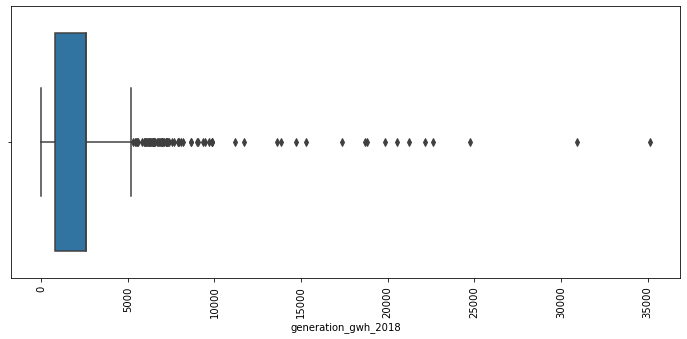

In [53]:
# Box plot

for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.boxplot(x=df[i])
    plt.xlabel(i)
    plt.xticks(rotation=90)

<Figure size 864x360 with 0 Axes>

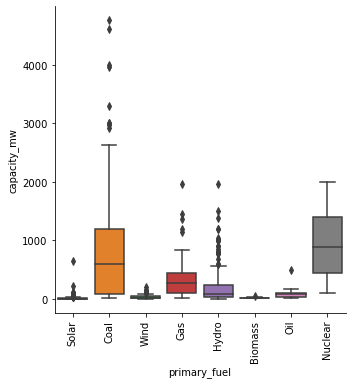

In [34]:
# Catplot of box kind:

f= plt.figure(figsize=(12,5))
ax = sns.catplot(x='primary_fuel',y='capacity_mw',kind='box',data=df)
plt.xlabel('primary_fuel')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

In [35]:
cat_columns

Index(['country', 'country_long', 'name', 'gppd_idnr', 'primary_fuel',
       'commissioning_year', 'owner', 'source', 'url', 'geolocation_source',
       'year_of_capacity_data', 'generation_data_source'],
      dtype='object')

<Figure size 864x360 with 0 Axes>

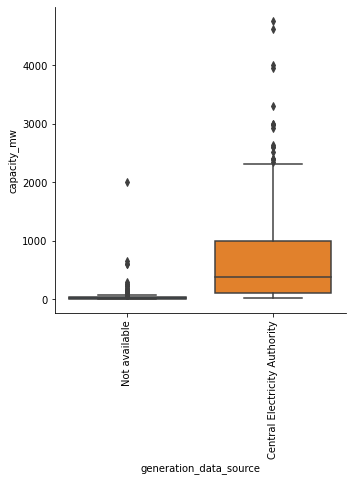

In [42]:
f= plt.figure(figsize=(12,5))
ax = sns.catplot(x='generation_data_source',y='capacity_mw',kind='box',data=df)
plt.xlabel('generation_data_source')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 864x360 with 0 Axes>

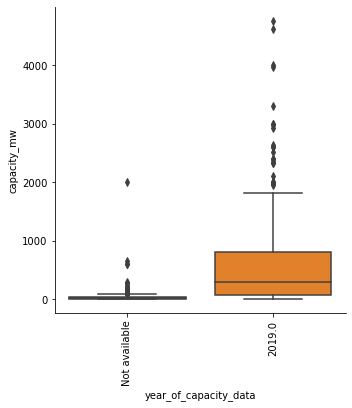

In [41]:
f= plt.figure(figsize=(12,5))
ax = sns.catplot(x='year_of_capacity_data',y='capacity_mw',kind='box',data=df)
plt.xlabel('year_of_capacity_data')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 864x360 with 0 Axes>

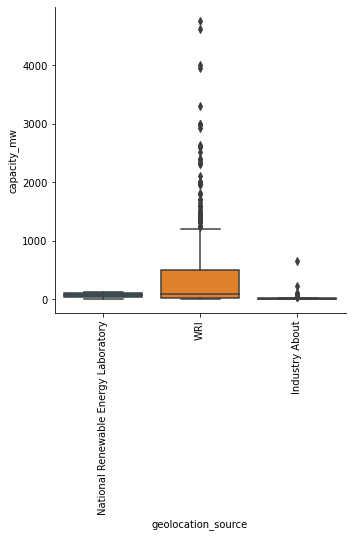

In [40]:
f= plt.figure(figsize=(12,5))
ax = sns.catplot(x='geolocation_source',y='capacity_mw',kind='box',data=df)
plt.xlabel('geolocation_source')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 864x360 with 0 Axes>

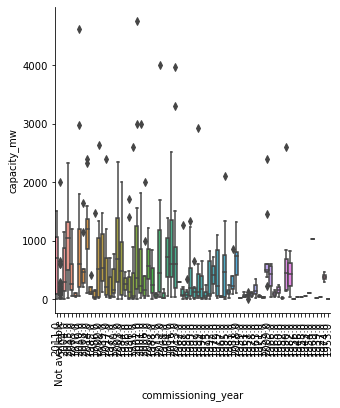

In [35]:
# Catplot of box kind:

f= plt.figure(figsize=(12,5))
ax = sns.catplot(x='commissioning_year',y='capacity_mw',kind='box',data=df)
plt.xlabel('commissioning_year')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 864x360 with 0 Axes>

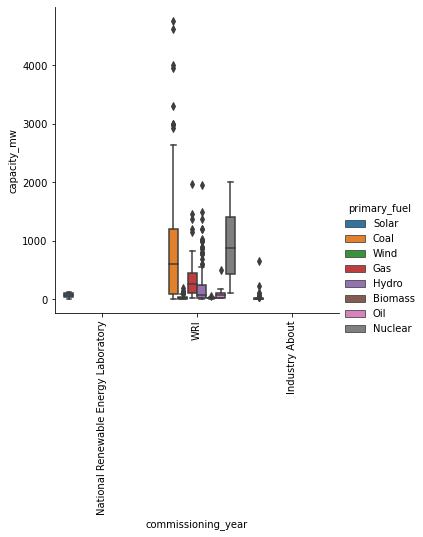

In [37]:
# Catplot of box kind:

f= plt.figure(figsize=(12,5))
ax = sns.catplot(x='geolocation_source',y='capacity_mw',kind='box',data=df,hue='primary_fuel')
plt.xlabel('commissioning_year')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

In [ ]:
# Checking linear relation between features and lables:

<Figure size 864x360 with 0 Axes>

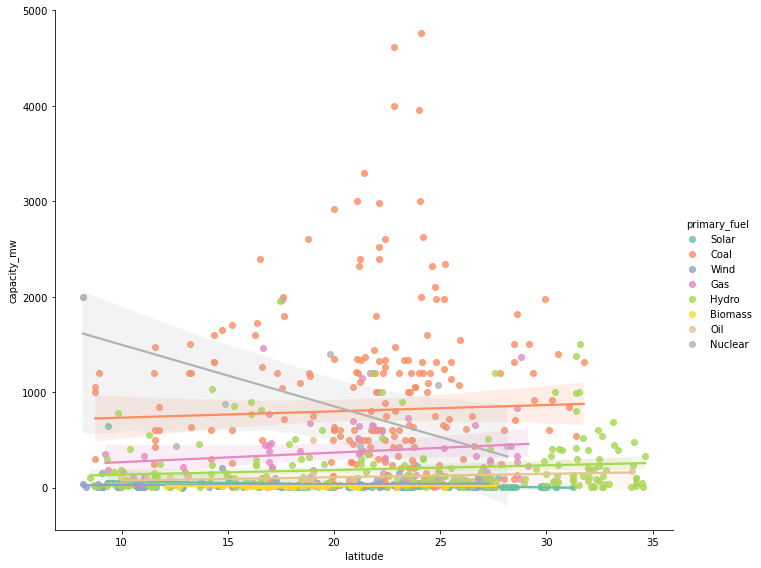

In [43]:
f= plt.figure(figsize=(12,5))
ax =sns.lmplot(x = "latitude", y = "capacity_mw", data=df,hue='primary_fuel', palette='Set2', height=8, aspect=1.2)
plt.show()

<Figure size 864x360 with 0 Axes>

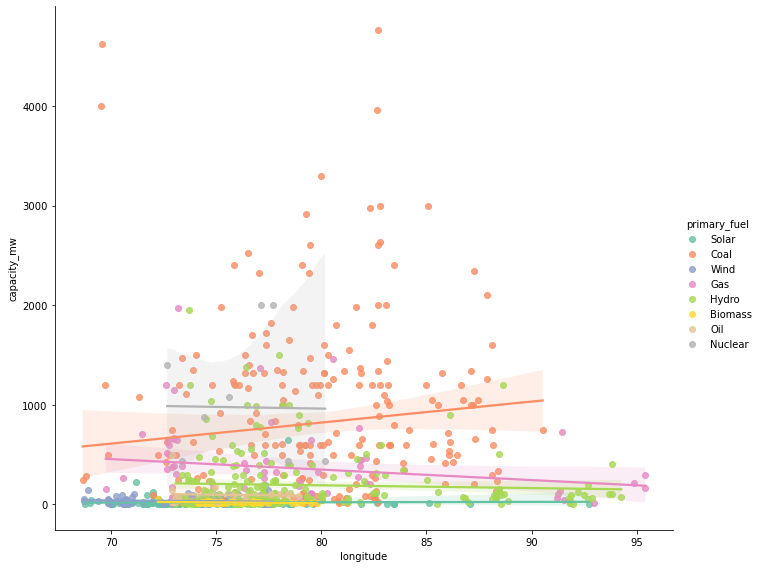

In [40]:
f= plt.figure(figsize=(12,5))
ax =sns.lmplot(x = "longitude", y = "capacity_mw", data=df,hue='primary_fuel', palette='Set2', height=8, aspect=1.2)
plt.show()


<Figure size 864x360 with 0 Axes>

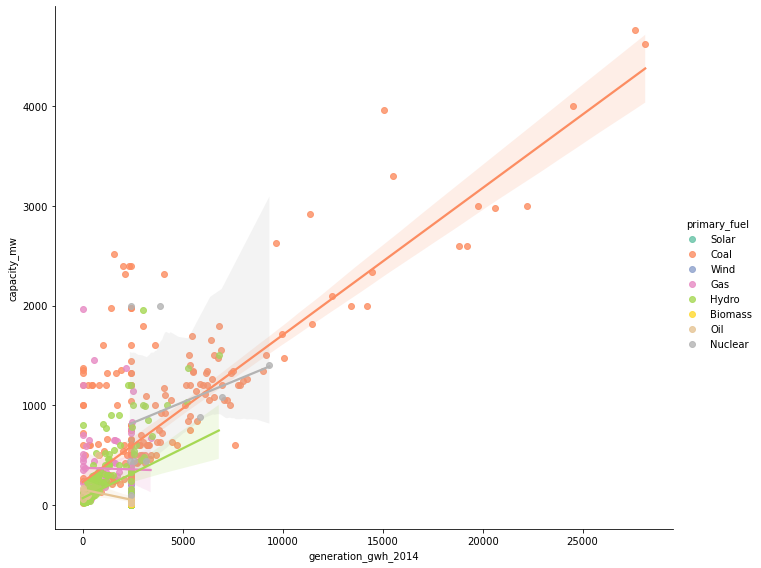

In [44]:
f= plt.figure(figsize=(12,5))
ax =sns.lmplot(x = "generation_gwh_2014", y = "capacity_mw",hue='primary_fuel', data=df, palette='Set2', height=8, aspect=1.2)
plt.show()

<Figure size 864x360 with 0 Axes>

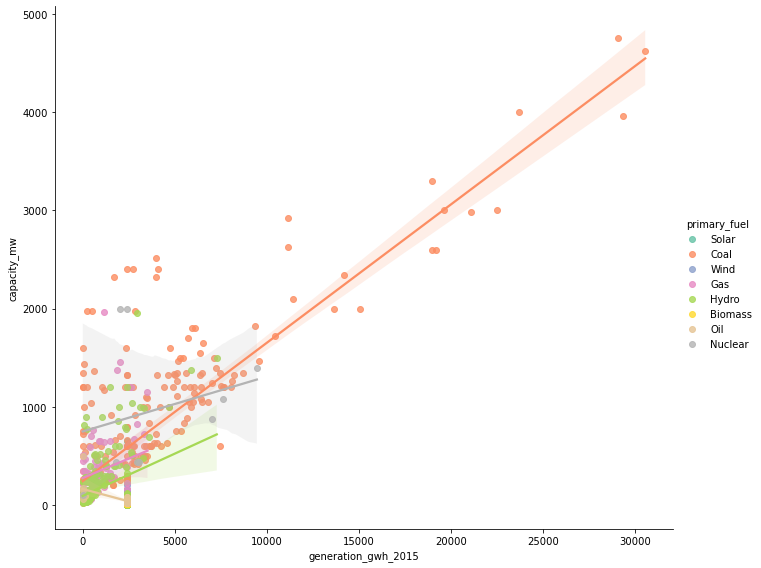

In [45]:
f= plt.figure(figsize=(12,5))
ax =sns.lmplot(x = "generation_gwh_2015", y = "capacity_mw",hue='primary_fuel', data=df, palette='Set2', height=8, aspect=1.2)
plt.show()

<Figure size 864x360 with 0 Axes>

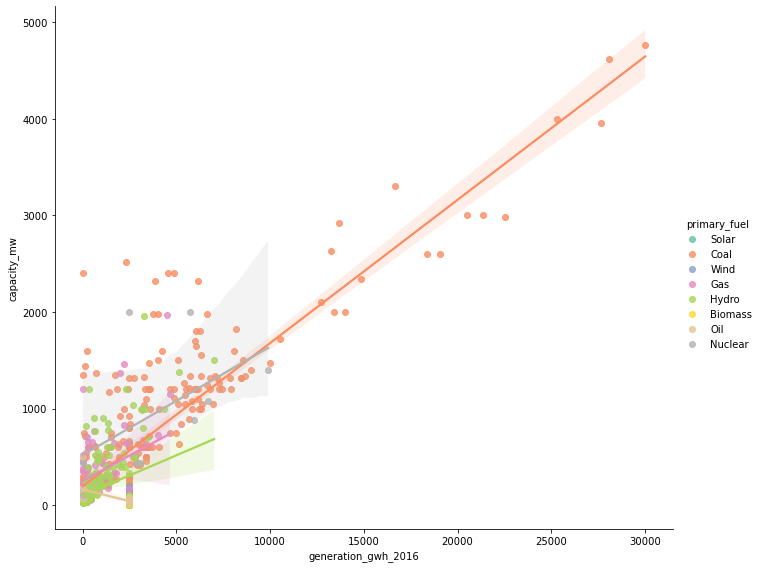

In [46]:
f= plt.figure(figsize=(12,5))
ax =sns.lmplot(x = "generation_gwh_2016", y = "capacity_mw",hue='primary_fuel', data=df, palette='Set2', height=8, aspect=1.2)
plt.show()

<Figure size 864x360 with 0 Axes>

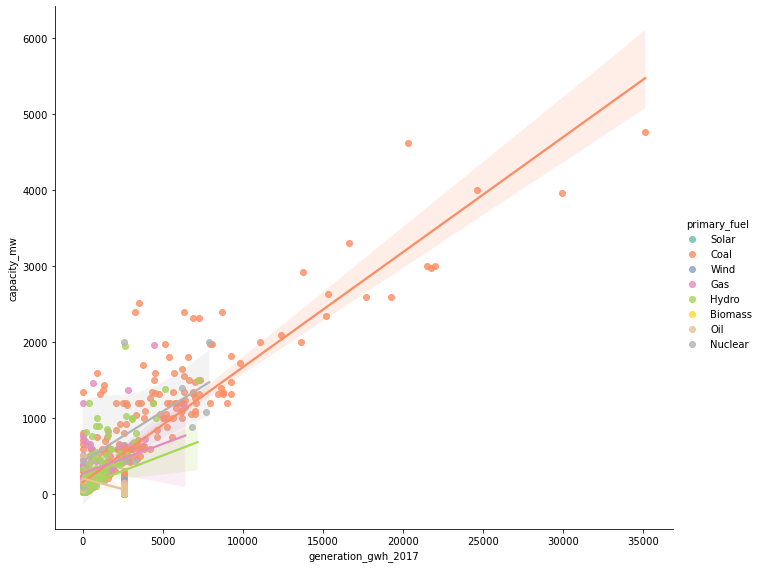

In [47]:
f= plt.figure(figsize=(12,5))
ax =sns.lmplot(x = "generation_gwh_2017", y = "capacity_mw",hue='primary_fuel', data=df, palette='Set2', height=8, aspect=1.2)
plt.show()

<Figure size 864x360 with 0 Axes>

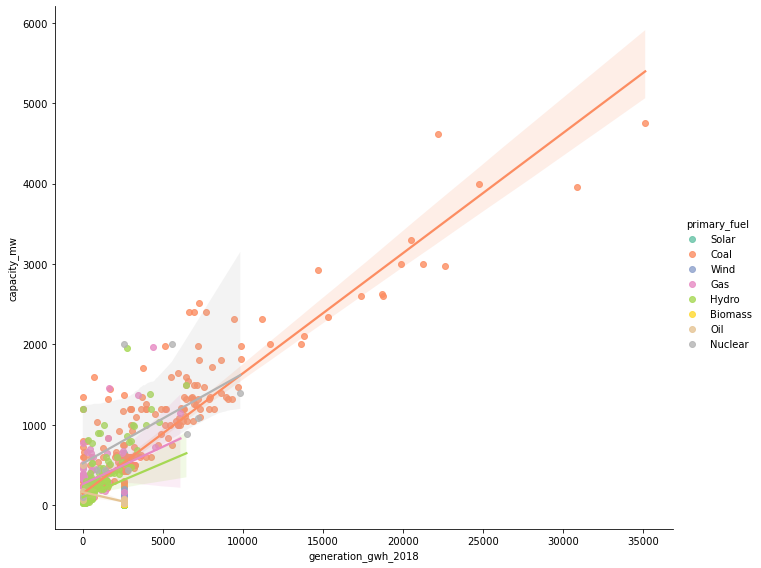

In [48]:
f= plt.figure(figsize=(12,5))
ax =sns.lmplot(x = "generation_gwh_2018", y = "capacity_mw",hue='primary_fuel', data=df, palette='Set2', height=8, aspect=1.2)
plt.show()

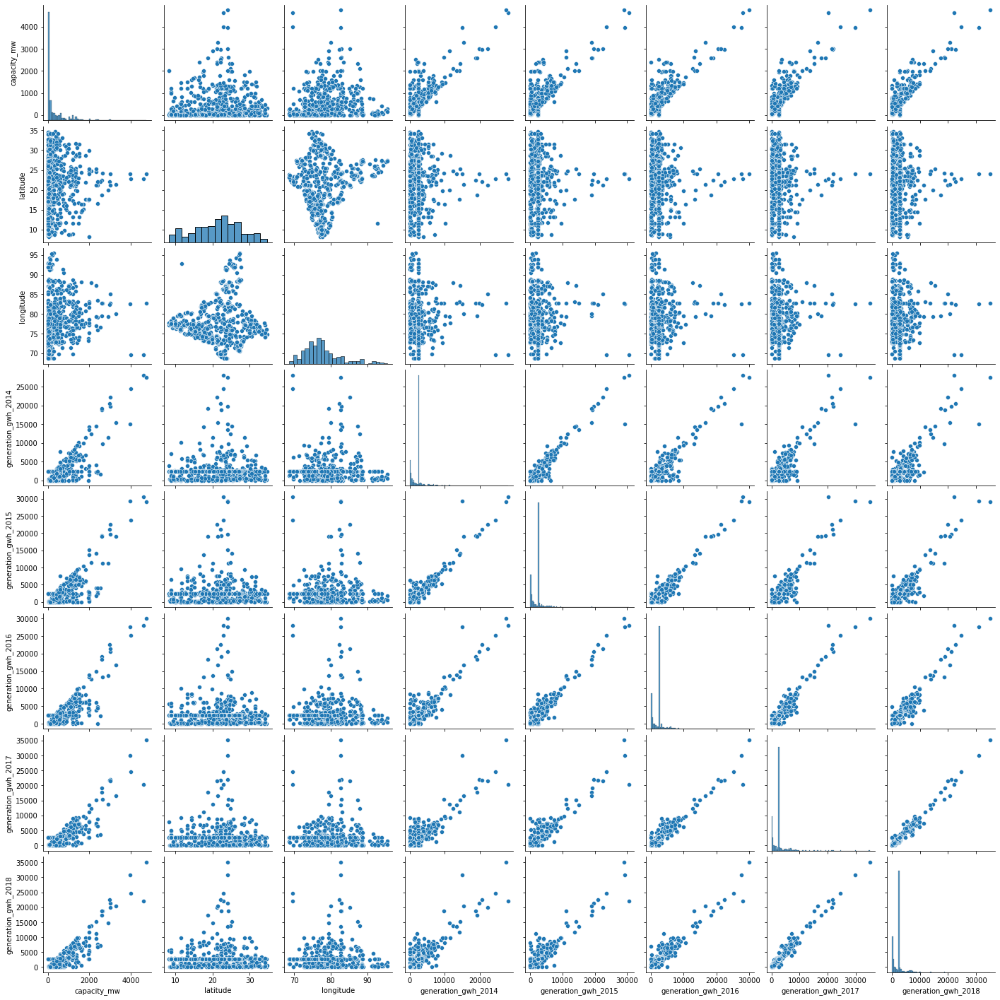

In [33]:
sns.pairplot(df)

In [ ]:
# Checking skewness and correlation

In [28]:
df.skew()

capacity_mw            3.037191
latitude              -0.145866
longitude              1.112646
generation_gwh_2014    4.930254
generation_gwh_2015    5.253370
generation_gwh_2016    4.965294
generation_gwh_2017    5.014455
generation_gwh_2018    4.843057
dtype: float64

In [29]:
df.shape[0]

861

In [30]:
# Using Z Statistics to check and remove any more outliers:

from scipy.stats import zscore

z_score = zscore(df[cont_columns])

abs_z_score = np.abs(z_score)

filtering_entry = (abs_z_score < 3).all(axis=1) # values lying in 3 times std will be removed

df = df[filtering_entry]

df.describe()

,capacity_mw,latitude,longitude,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018
count,825.000000,825.000000,825.000000,825.000000,825.000000,825.000000,825.000000,825.000000
mean,274.289383,21.104112,77.128485,2156.315053,2126.404056,2165.037256,2240.550655,2269.355906
std,427.744391,6.318065,4.514668,1520.239464,1558.540182,1616.584682,1654.614446,1703.087581
min,0.000000,8.168900,68.644700,0.000000,0.000000,0.000000,0.000000,0.000000
25%,16.950000,16.626000,74.192400,1146.966350,788.656100,765.503250,829.611100,699.485000
50%,55.000000,21.583700,76.601100,2431.823590,2428.226946,2467.936859,2547.759305,2600.804099
75%,347.500000,25.486500,79.120000,2431.823590,2428.226946,2467.936859,2547.759305,2600.804099
max,2000.000000,34.649000,92.227900,10063.180000,10422.690000,10503.882000,9833.690000,9859.500000


In [31]:
861-825 # outliers deleted

36

In [32]:
36/861*100

4.181184668989547

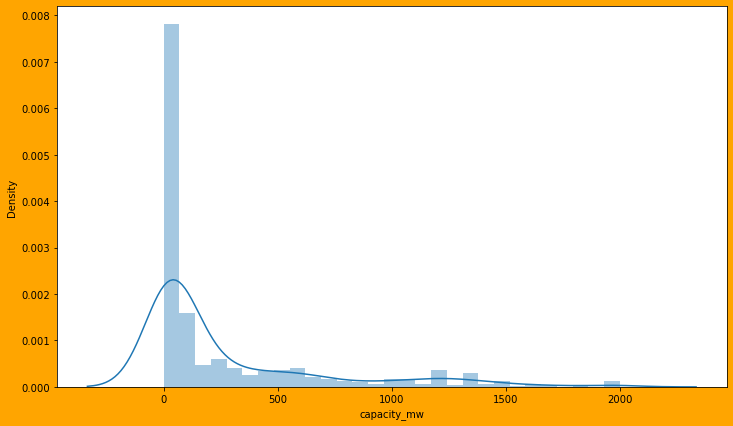

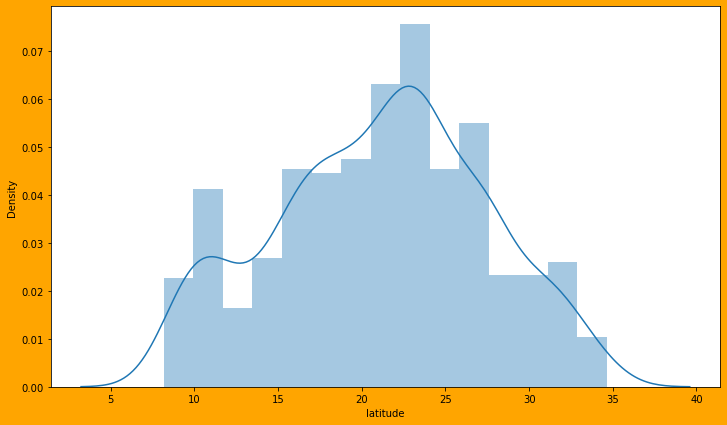

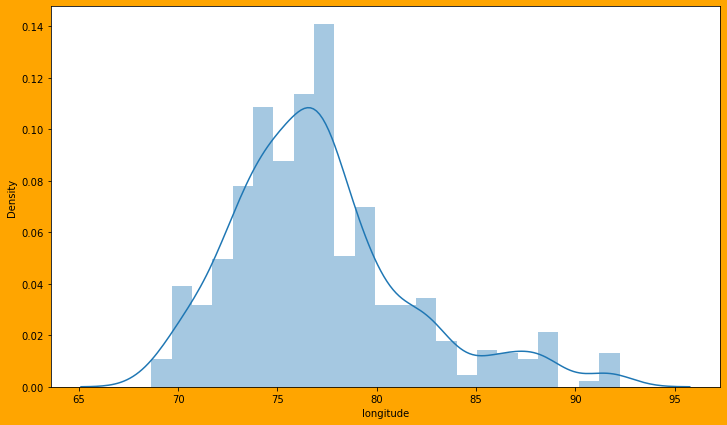

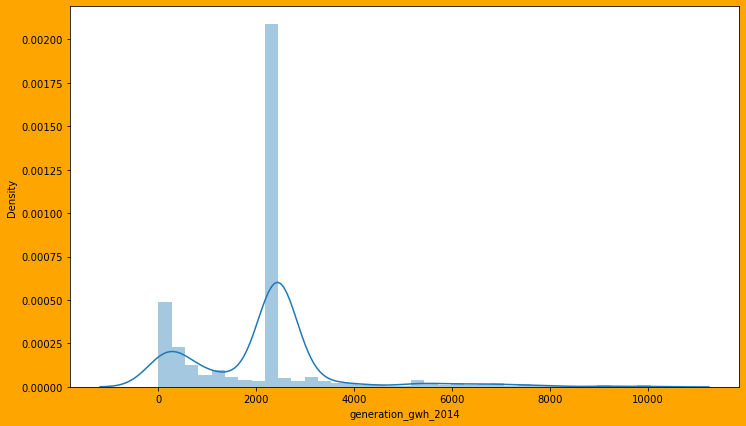

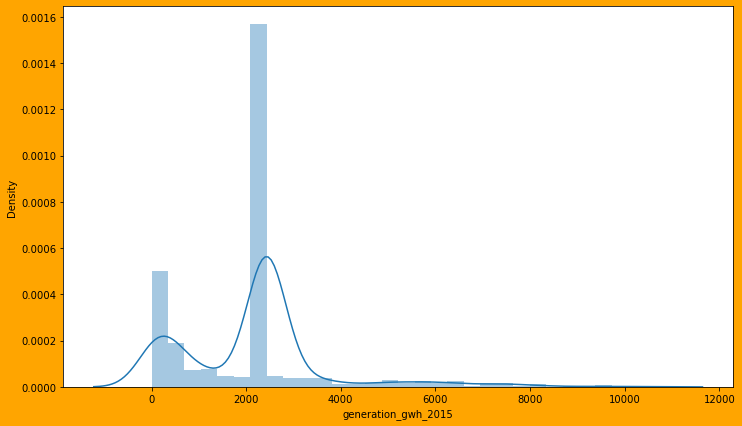

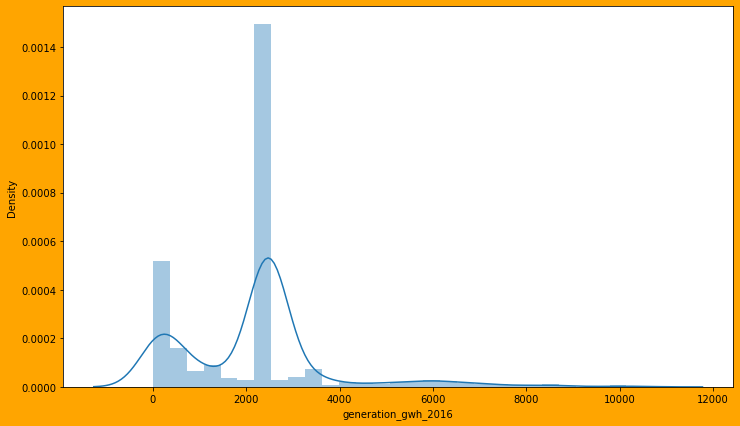

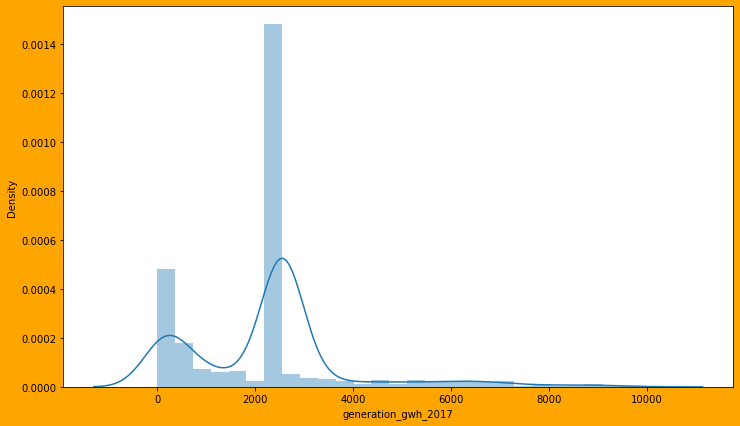

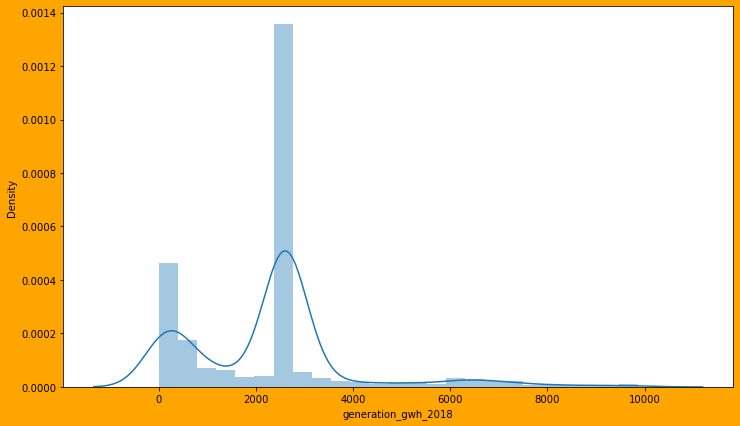

In [53]:
# Checking the distribution of continuous variables:

for i in cont_columns:
    plt.figure(figsize=(12,7),facecolor='orange')
    sns.distplot(df[i])
    plt.show()

In [33]:
df.skew().sort_values()

latitude              -0.108047
longitude              0.967396
generation_gwh_2017    1.280814
generation_gwh_2018    1.319552
generation_gwh_2015    1.389486
generation_gwh_2016    1.410976
generation_gwh_2014    1.515514
capacity_mw            1.945004
dtype: float64

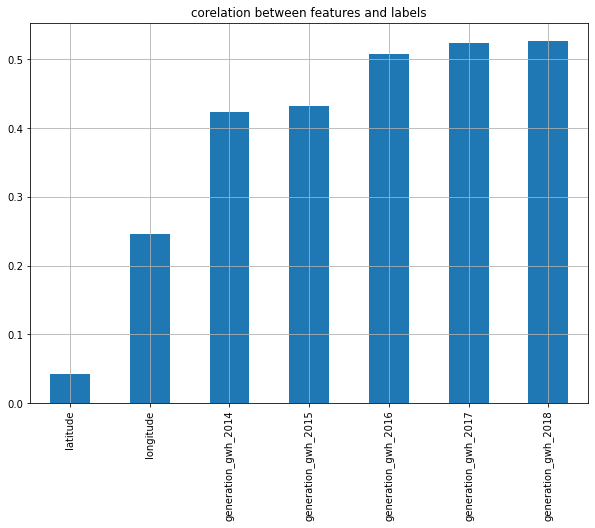

In [57]:
# Correlation between features and label:

# Replacing attrition column values:

df.drop(columns = 'capacity_mw',axis = 1).corrwith(df.capacity_mw).plot(kind='bar',grid=True,figsize=(10,7),title='corelation between features and labels')
plt.show()

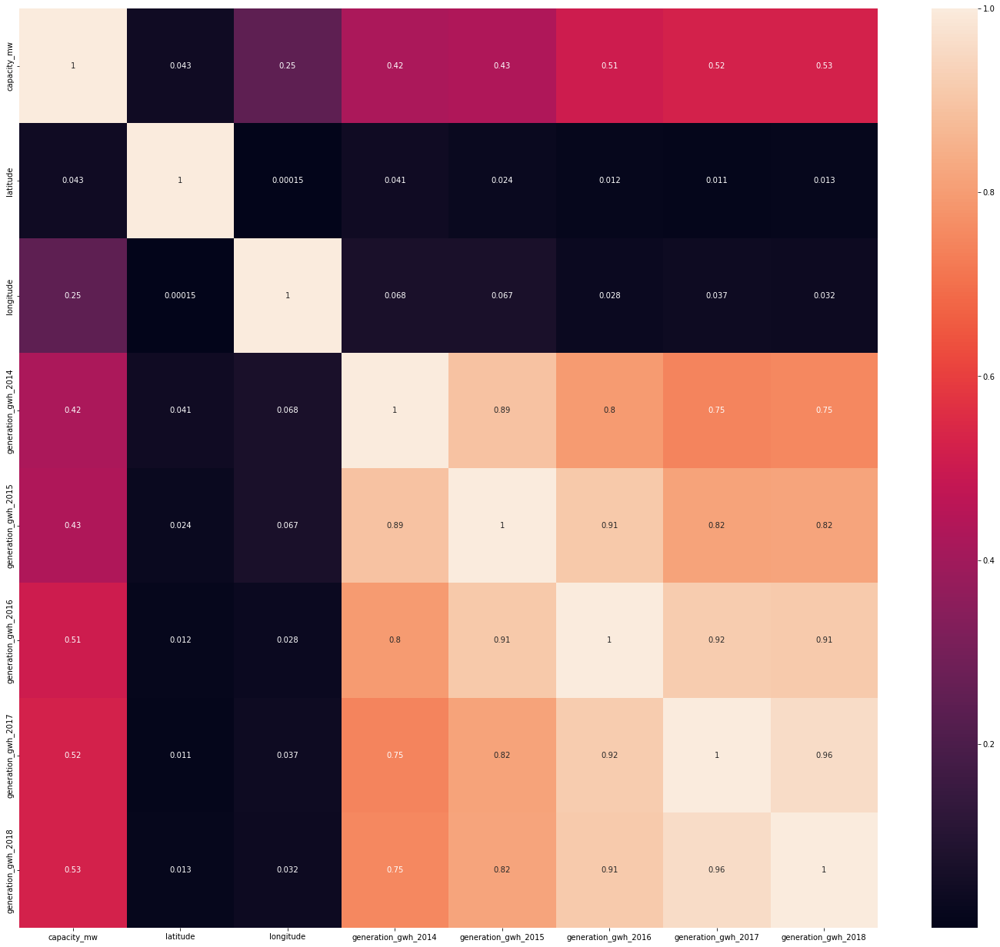

In [58]:
df_corr = df.corr().abs()
plt.figure(figsize=(25,22))
sns.heatmap(df_corr,annot=True,annot_kws={'size':10})
plt.show()

In [34]:
from statsmodels.stats.outliers_influence import variance_inflation_factor


vif = pd.DataFrame()
vif['vif'] = [variance_inflation_factor(df[cont_columns],i) for i in range(df[cont_columns].shape[1])]
vif['features'] = df[cont_columns].columns
vif


,vif,features
0,1.989602,capacity_mw
1,11.799357,latitude
2,13.404212,longitude
3,15.511652,generation_gwh_2014
4,30.363413,generation_gwh_2015
5,35.858405,generation_gwh_2016
6,40.225898,generation_gwh_2017
7,38.136745,generation_gwh_2018


In [35]:
df_new = pd.get_dummies(df)

In [36]:
df_new.shape

(825, 2497)

In [37]:
df_new.columns

Index(['capacity_mw', 'latitude', 'longitude', 'generation_gwh_2014',
       'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017',
       'generation_gwh_2018', 'country_IND', 'country_long_India',
       ...
       'url_https://www.solairedirect.com', 'url_https://www.vardhman.com/',
       'url_https://www.zaubacorp.com/company/MAHATMA-SUGAR-POWER-LIMITED/U15421MH1997PLC111855',
       'geolocation_source_Industry About',
       'geolocation_source_National Renewable Energy Laboratory',
       'geolocation_source_WRI', 'year_of_capacity_data_2019.0',
       'year_of_capacity_data_Not available',
       'generation_data_source_Central Electricity Authority',
       'generation_data_source_Not available'],
      dtype='object', length=2497)

In [63]:
for i in df_new.columns:
    print(i ,':',df_new[i].skew())

capacity_mw : 1.9450037154077853
latitude : -0.10804699022024333
longitude : 0.9673960048008245
generation_gwh_2014 : 1.5155143397505924
generation_gwh_2015 : 1.3894864586600417
generation_gwh_2016 : 1.4109761257769997
generation_gwh_2017 : 1.2808135488418226
generation_gwh_2018 : 1.3195519030420835
country_IND : 0
country_long_India : 0
name_ACME Solar Tower : 28.722813232690164
name_ADITYA CEMENT WORKS : 28.722813232690164
name_AES Saurashtra Windfarms : 28.722813232690164
name_AGARTALA GT : 28.722813232690164
name_AKALTARA TPP : 28.722813232690164
name_AKRIMOTA LIG : 28.722813232690164
name_ALIYAR : 28.722813232690164
name_ALLAIN DUHANGAN : 28.722813232690164
name_ALMATTI DAM : 28.722813232690164
name_AMAR KANTAK : 28.722813232690164
name_AMARAVATI TPP : 28.722813232690164
name_ANANDPUR SAHIB ST-I&II : 28.722813232690164
name_ANAPARA "C" : 28.722813232690164
name_ANDHRA : 28.722813232690164
name_ANTA GT : 28.722813232690164
name_ANUPPUR : 28.722813232690164
name_ANUPUR TPP : 28.7228

In [38]:
from sklearn.preprocessing import PowerTransformer

pt = PowerTransformer()

data_trans = pt.fit_transform(df_new)

In [39]:
# Splitting data into features and label:

y = df_new['capacity_mw']
X = df_new.drop('capacity_mw',axis=1)

In [40]:
from sklearn.preprocessing import PowerTransformer

pt = PowerTransformer()

X_trans = pt.fit_transform(X)

In [42]:
from sklearn.decomposition import PCA
# Using PCA i.e. Principal Component Analysis that is a diamensionallity reduction technique:

pca = PCA()
pca.fit_transform(X_trans)


array([[ 4.21053274e+00,  5.93191912e+00,  1.34123601e+01, ...,
         0.00000000e+00, -0.00000000e+00,  1.80611658e-14],
       [ 3.12541621e+00, -2.44297873e+00,  2.85729789e+00, ...,
        -1.07165782e+00, -1.27892420e+00,  1.80611658e-14],
       [ 4.07650829e+00, -3.48276117e+00, -2.50405476e+00, ...,
         9.16184961e-16,  3.99558824e-15,  1.80611658e-14],
       ...,
       [ 2.75638057e+00, -3.01475266e+00, -1.45294089e+00, ...,
         2.29302717e-15,  3.45386155e-15,  1.80611658e-14],
       [ 3.19706611e+00, -2.34240037e+00,  2.75481172e+00, ...,
        -1.47009914e+00,  2.34796947e-01,  1.80611658e-14],
       [ 3.62951377e+00, -4.11703831e+00, -2.38582487e+00, ...,
        -1.21220367e-15,  3.86717313e-15,  1.80611658e-14]])

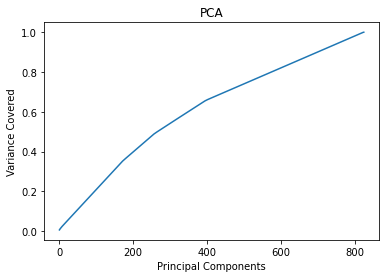

In [43]:
# Using Scree Plot to identify best components:

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal Components')
plt.ylabel('Variance Covered')
plt.title('PCA')
plt.show()


In [44]:
pca = PCA(n_components=800)
new_pcomp = pca.fit_transform(X_trans)
princi_comp = pd.DataFrame(new_pcomp)
princi_comp

,0,1,2,3,4,5,6,7,8,9,...,790,791,792,793,794,795,796,797,798,799
0,4.210533,5.931919,13.412360,31.686018,4.205724,0.713506,-1.536854,-1.110226,0.781194,0.171765,...,-0.000000e+00,0.000000e+00,-5.275404e-298,0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
1,3.125416,-2.442979,2.857298,-1.499244,-0.026418,2.696031,-5.399714,-1.087987,-2.258486,-0.224198,...,2.445693e-02,-1.702727e+00,2.217442e+00,-6.495134e-01,-1.560754e+00,-9.516544e-01,-1.963030e+00,-7.132635e-01,-1.569948e+00,-1.992355e+00
2,4.076508,-3.482761,-2.504055,2.016532,-4.474340,-1.760286,1.110514,0.411390,-1.416840,0.204823,...,-4.215143e-15,-3.801417e-15,1.904117e-15,7.439613e-16,6.179325e-15,-4.807045e-15,-6.220156e-15,-2.735472e-15,3.336095e-15,-9.078397e-15
3,-3.989484,0.562112,-0.526852,-0.044152,0.173105,-0.004765,-0.369484,0.719244,0.932578,0.414703,...,2.915686e-01,1.045023e+00,-2.201512e+00,-4.151660e-01,-3.890948e+00,-2.114088e+00,3.926767e+00,-1.567339e+00,1.839435e+00,-2.060815e+00
4,-1.798080,-1.046977,4.955180,-1.858232,-0.293497,-0.910264,2.543076,0.538195,0.697979,-0.043641,...,1.699777e+00,-2.573769e+00,-2.417131e+00,-2.040633e+00,-3.701203e-01,-7.347872e-01,5.195785e-01,5.972161e-01,5.974325e-02,-3.493379e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
820,-3.699111,0.258138,-0.071756,-0.208219,0.040402,0.193378,-0.741303,-0.410297,-0.142309,-0.353978,...,1.919330e+00,3.661845e-01,-1.681848e+00,-1.379511e-02,1.185555e+00,4.037500e-01,4.005789e+00,-2.289803e+00,2.038727e+00,-4.459350e+00
821,5.214896,4.612724,-0.761988,-1.313829,0.237325,-0.552464,0.030913,-4.497560,9.268823,-7.494257,...,-4.764930e-01,1.409174e+00,1.363655e-01,-8.786903e-02,-1.393067e+00,-2.542443e+00,-9.111179e-01,-1.475159e+00,1.986303e+00,6.821715e-01
822,2.756381,-3.014753,-1.452941,1.075911,-3.013453,-1.370659,0.825570,-0.445207,0.198441,0.206556,...,-1.514837e-14,-4.736934e-15,1.763958e-14,5.873232e-15,-4.735029e-15,-1.357516e-14,1.188648e-14,4.801799e-17,4.972334e-15,-8.979910e-16
823,3.197066,-2.342400,2.754812,-1.311901,-0.196962,2.776996,-5.084559,1.209573,-6.121158,-0.677854,...,-3.420126e+00,3.909408e-01,2.123300e+00,-3.515093e-01,5.738213e-01,-8.046686e-01,1.841703e+00,1.583936e+00,1.035066e+00,-1.542428e-02


In [45]:
princi_comp.shape

(825, 800)

In [71]:
for i in princi_comp.columns:
    print(i ,':',princi_comp[i].skew())

0 : 0.1767006941917561
1 : 0.5479469967515896
2 : 1.1881564162669733
3 : 10.515121783554372
4 : 1.711313444847235
5 : 6.231812787321808
6 : -0.027067144365204892
7 : 4.258567845067958
8 : 1.6087629256613827
9 : 0.10843742445080054
10 : 6.896077066803037
11 : 2.161703101951777
12 : 6.990421489543897
13 : 3.0590503598641523
14 : 4.442209920012982
15 : 2.90887548726918
16 : 9.47360423794292
17 : 4.350893289297654
18 : 3.6704601423190186
19 : 4.655267093582374
20 : 3.751421290396786
21 : -1.9510662566509875
22 : 6.0754935557990315
23 : -0.06656565429056767
24 : 1.697183413953547
25 : 0.23823326635992728
26 : 2.2214887315214744
27 : 0.24136891336052527
28 : 5.2318837012400765
29 : 0.7978449860613833
30 : 2.1474391604933722
31 : 9.987472776375066
32 : 5.79833425363351
33 : 3.7595047744138954
34 : 3.147504520435841
35 : 3.9985973415262372
36 : 5.395887954670795
37 : 5.984831908247345
38 : 2.554580463116203
39 : 2.0059596803328756
40 : 2.337963317149404
41 : 5.518050952982863
42 : 0.2894083140

In [89]:
# Splitting our data to training data and testing data
# x_train,x_test,y_train,y_test

x_train,x_test,y_train,y_test = train_test_split(princi_comp,y,test_size=0.30,random_state=1)

# Here we are keeping training data as our scalled data and testing data as our label or target.

In [47]:
# MOdel instantiating and training

rm = LinearRegression()
rm.fit(x_train,y_train) 
# here we will pass training data

LinearRegression()

In [48]:
# Testing our model with Adjusted R2 Square: 

# on training data

rm.score(x_train,y_train)

1.0

In [49]:
# PLotting and visualizing

y_pred = rm.predict(x_test)

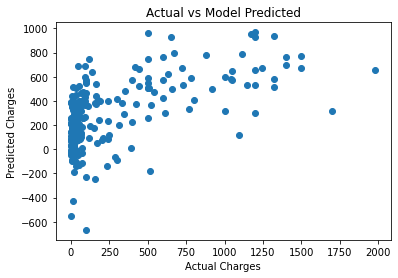

In [50]:
plt.scatter(y_test,y_pred)
plt.xlabel('Actual Charges')
plt.ylabel('Predicted Charges')
plt.title('Actual vs Model Predicted')
plt.show()

In [51]:
# Model Evaluation: MAE , MSE , RMSE

from sklearn.metrics import mean_absolute_error,mean_squared_error

mean_absolute_error(y_test,y_pred) # 4 % error

241.33414499339315

In [78]:
mean_squared_error(y_test,y_pred) # lesser the better

103224.35024323095

In [79]:
# RMSE
np.sqrt(mean_squared_error(y_test,y_pred))

321.2854653469885

In [80]:
print("Score: ", rm.score(x_test, y_test))

Score:  0.32951699774837406


In [81]:
from sklearn.linear_model import Ridge,Lasso,RidgeCV,LassoCV

lassocv = LassoCV(alphas = None , max_iter = 100, normalize = True)
lassocv.fit(x_train,y_train)

LassoCV(max_iter=100, normalize=True)

In [83]:
# Best alpha parameter
alpha = lassocv.alpha_ # Best alpha rate
alpha

0.9576991368193709

In [84]:
# Now since we have the best parameter, lasso regression will be used:
lasso_reg = Lasso(alpha)
lasso_reg.fit(x_train,y_train)
# i.e. when model is training it will learn at this speed 6....

Lasso(alpha=0.9576991368193709)

In [85]:
lasso_reg.score(x_test,y_test)

0.621146300016933

In [86]:
# Ridge Method:

ridgecv = RidgeCV(alphas = np.arange(0.001,0.1,0.01),normalize = True)
ridgecv.fit(x_train,y_train)

RidgeCV(alphas=array([0.001, 0.011, 0.021, 0.031, 0.041, 0.051, 0.061, 0.071, 0.081,
       0.091]),
        normalize=True)

In [87]:
ridgecv.alpha_ # Best alpha rate

0.09099999999999998

In [88]:
ridge_model = Ridge(alpha = ridgecv.alpha_)
ridge_model.fit(x_train,y_train)

Ridge(alpha=0.09099999999999998)

In [89]:
ridge_model.score(x_test,y_test)

0.5533089427140665

In [91]:
print(rm.coef_)
print(f"{rm.intercept_:.2f}")

[-4.19379700e+01 -9.46982394e+00  7.33182503e+01 -3.41278140e+01
 -9.61618047e+00 -1.83449873e+01  5.12853394e+01  1.58671388e+01
  1.13542565e+01 -2.93771529e+00  1.56655732e+00 -8.35703699e-01
 -1.03249629e+00 -9.79581561e-03  2.90031153e-01  7.52750855e-01
  1.81648400e+00  7.20132363e-01 -1.77525993e+00 -2.82464514e+00
 -2.14417068e-01  1.66344863e+00  2.12033282e+00  1.94284236e-01
 -3.04682980e+00  2.73456223e+00  4.26563152e+00  5.67261643e+00
 -3.89001123e+00 -1.26522835e+00  3.01913138e+00 -2.39764994e+00
 -1.10439285e+00 -1.10937759e+00  2.29013799e+00  4.17704485e+00
 -1.46656080e+00 -5.21922823e-01 -1.92816995e+00 -1.29373282e-01
  9.31417319e-01  1.46724776e+00  1.41646994e+00 -4.15524357e+00
 -7.33185418e-02  1.52328336e+00  8.89996487e-01  6.93387309e-01
 -1.92058300e+00 -8.66088913e-01 -5.31248167e-01 -2.86287373e+00
  2.92736691e-01 -5.27648446e-01 -1.36474464e+00 -1.48080964e+00
  4.46952912e-01 -2.11952810e-01  1.14911745e-01  3.23283052e+00
 -3.25722847e+00 -1.91083

In [92]:
# Using decision tree:

from sklearn.tree import DecisionTreeRegressor

model = DecisionTreeRegressor()

model.fit(x_train, y_train)

y_preddt = model.predict(x_test)

r2_score(y_test,y_preddt)


0.4140868347071758

In [93]:
# Random forest:

from sklearn.ensemble import RandomForestRegressor
regressor_rf = RandomForestRegressor(n_estimators = 100)

regressor_rf.fit(x_train, y_train)

lr_normal_rf = regressor_rf.score(x_train, y_train)

lr_normal_rf

0.9591583668290719

In [94]:
y_predrf = regressor_rf.predict(x_test)

lr_normal_rf_test = regressor_rf.score(x_test, y_test)

lr_normal_rf_test

mse_lr_normal_rf  = mean_absolute_error(y_test, y_predrf)

mse_lr_normal_rf

105.41102193548387

In [95]:
# Model Evaluation: MAE , MSE , RMSE

from sklearn.metrics import mean_absolute_error,mean_squared_error

print("MAE: ", metrics.mean_absolute_error(y_test, y_predrf))
print("MSE: ", metrics.mean_squared_error(y_test, y_predrf))
print("RMSE: ", metrics.mean_squared_error(y_test, y_predrf, squared=False))
print("R2: ", metrics.r2_score(y_test, y_predrf), "\n")
print("Score: ", regressor_rf.score(x_test, y_predrf))

MAE:  105.41102193548387
MSE:  28840.147380475755
RMSE:  169.82387164493616
R2:  0.8126718302854246 

Score:  1.0


In [96]:
# Using Support vector regressor:

# Fit the model over the training data
from sklearn.svm import SVR
svr = SVR()
svr.fit(x_train, y_train)

y_predsvr = svr.predict(x_test)

r2_score(y_test,y_predsvr)

-0.2115572298030377

In [97]:
# Using XGBoost:

xgb_clf = xgb.XGBRegressor()
xgb_clf.fit(x_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)

In [98]:
# Using XGBoost:

xgb_clf = xgb.XGBRegressor()
xgb_clf.fit(x_train,y_train)

y_predx = xgb_clf.predict(x_test)

r2_score(y_test,y_predx)

0.7658326825693874

In [99]:
# Hyperparameter tuning for xgboost model

params = {"learning_rate"    : [0.05, 0.10] ,
         "max_depth"        : [ 3, 5, 8, 12]}

grd = GridSearchCV(xgb_clf,param_grid=params)

In [100]:
xgb_boosted = grd.fit(x_train,y_train)

y_predxx = xgb_boosted.predict(x_test)

r2_score(y_test,y_predxx)

0.8165421300307603

In [101]:
# Model Evaluation: MAE , MSE , RMSE

from sklearn.metrics import mean_absolute_error,mean_squared_error

print("MAE: ", metrics.mean_absolute_error(y_test, y_predxx))
print("MSE: ", metrics.mean_squared_error(y_test, y_predxx))
print("RMSE: ", metrics.mean_squared_error(y_test, y_predxx, squared=False))
print("R2: ", metrics.r2_score(y_test, y_predxx), "\n")
print("Score: ", xgb_boosted.score(x_test, y_predxx))

MAE:  104.17561739620085
MSE:  28244.294577172477
RMSE:  168.06038967339234
R2:  0.8165421300307603 

Score:  1.0


In [102]:
# Innitiate k neighbour Regressor:

from sklearn.neighbors import KNeighborsRegressor

params = {'n_neighbors':[2,3,4,5,6,7,8,9]}

knn = KNeighborsRegressor()

knnmodel = GridSearchCV(knn, params, cv=5)
knnmodel.fit(x_train,y_train)
knnmodel.best_params_

{'n_neighbors': 4}

In [103]:
knn_best = KNeighborsRegressor(n_neighbors = 2)
knn_best.fit(x_train,y_train)

KNeighborsRegressor(n_neighbors=2)

In [104]:
y_predknn = knn_best.predict(x_test)

r2_score(y_test,y_predknn)

-0.9683266317769081

In [105]:
# Solving classification problem

In [53]:
df_cl = df.copy()
df_cl.columns

Index(['country', 'country_long', 'name', 'gppd_idnr', 'capacity_mw',
       'latitude', 'longitude', 'primary_fuel', 'commissioning_year', 'owner',
       'source', 'url', 'geolocation_source', 'year_of_capacity_data',
       'generation_gwh_2014', 'generation_gwh_2015', 'generation_gwh_2016',
       'generation_gwh_2017', 'generation_gwh_2018', 'generation_data_source'],
      dtype='object')

In [54]:
# Splitting data into features and label:

y = df_cl['primary_fuel']
X = df_cl.drop('primary_fuel',axis=1)

In [55]:
# Encoding training data:
X_dummies = pd.get_dummies(X)

In [56]:
# Encoding lables:

from sklearn.preprocessing import LabelEncoder

lbl = LabelEncoder()
y_enc = lbl.fit_transform(y)

In [57]:
X_dummies.shape

(825, 2489)

In [58]:
y_enc

array([6, 1, 7, 2, 1, 1, 3, 3, 3, 1, 1, 3, 1, 3, 2, 1, 1, 0, 0, 0, 2, 1,
       1, 6, 7, 6, 7, 7, 7, 6, 6, 6, 6, 6, 6, 6, 1, 0, 3, 3, 1, 3, 1, 1,
       1, 1, 3, 3, 3, 3, 3, 1, 1, 2, 1, 3, 1, 1, 1, 2, 3, 3, 7, 1, 0, 0,
       1, 1, 1, 3, 1, 3, 1, 0, 3, 3, 3, 1, 3, 3, 3, 1, 1, 3, 3, 3, 1, 0,
       1, 1, 1, 1, 3, 3, 1, 1, 1, 7, 5, 2, 1, 3, 5, 1, 6, 6, 7, 6, 6, 6,
       6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 6, 7, 6, 6, 6, 6, 1, 3, 3, 3, 1, 1,
       1, 1, 1, 1, 3, 3, 3, 3, 3, 3, 3, 0, 6, 6, 7, 6, 1, 2, 4, 1, 1, 1,
       0, 0, 3, 1, 2, 3, 3, 1, 1, 3, 2, 2, 5, 3, 0, 5, 3, 3, 0, 3, 1, 1,
       1, 6, 2, 6, 7, 6, 6, 6, 6, 6, 6, 3, 7, 2, 7, 7, 7, 2, 7, 2, 7, 1,
       2, 3, 2, 2, 3, 1, 3, 3, 2, 1, 7, 3, 3, 3, 1, 1, 3, 7, 1, 2, 1, 1,
       2, 1, 3, 7, 6, 6, 6, 6, 6, 6, 7, 6, 6, 6, 1, 3, 0, 3, 0, 2, 2, 0,
       3, 0, 7, 7, 7, 7, 7, 1, 7, 6, 1, 2, 3, 3, 1, 7, 1, 1, 3, 1, 1, 7,
       6, 6, 3, 0, 3, 1, 1, 1, 1, 1, 2, 3, 1, 3, 1, 6, 6, 7, 7, 7, 7, 7,
       3, 3, 3, 4, 1, 3, 4, 3, 3, 1, 3, 1, 1, 1, 3,

In [59]:
from sklearn.preprocessing import PowerTransformer

pt = PowerTransformer()

X_trans_cl = pt.fit_transform(X_dummies)

In [60]:
from sklearn.decomposition import PCA
# Using PCA i.e. Principal Component Analysis that is a diamensionallity reduction technique:

pca1 = PCA()
pca1.fit_transform(X_trans_cl)



array([[ 3.98105304e+00,  5.14753367e+00,  3.29391044e+01, ...,
        -0.00000000e+00, -0.00000000e+00,  3.26568795e-14],
       [ 3.33320989e+00, -2.83090561e+00, -1.19095705e-02, ...,
        -1.76929800e+00,  1.91764075e+00,  3.26568795e-14],
       [ 3.86193716e+00, -2.58234242e+00, -2.97100566e-01, ...,
         8.82445999e-16,  7.10308437e-15,  3.26568795e-14],
       ...,
       [ 2.56912735e+00, -2.23023535e+00, -3.37799894e-01, ...,
         1.70399052e-14,  7.32818122e-15,  3.26568795e-14],
       [ 3.40133162e+00, -2.71372183e+00,  2.01113170e-01, ...,
        -1.09729476e-01,  9.11289893e-01,  3.26568795e-14],
       [ 3.52306078e+00, -3.33733388e+00, -7.75563395e-01, ...,
         7.43487746e-15,  7.83355206e-16,  3.26568795e-14]])

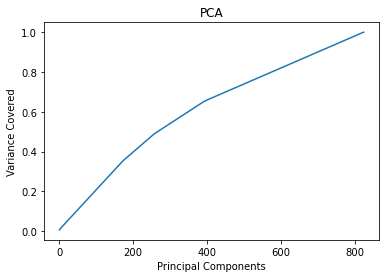

In [61]:
# Using Scree Plot to identify best components:

plt.figure()
plt.plot(np.cumsum(pca1.explained_variance_ratio_))
plt.xlabel('Principal Components')
plt.ylabel('Variance Covered')
plt.title('PCA')
plt.show()


In [62]:
pca1 = PCA(n_components=800)
new_pcomp = pca1.fit_transform(X_trans)
princi_comp = pd.DataFrame(new_pcomp)
princi_comp

,0,1,2,3,4,5,6,7,8,9,...,790,791,792,793,794,795,796,797,798,799
0,4.210533,5.931919,13.412360,31.686018,4.205724,0.713506,-1.536854,-1.110226,0.781194,0.171765,...,-0.000000e+00,0.000000e+00,-5.275404e-298,0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
1,3.125416,-2.442979,2.857298,-1.499244,-0.026418,2.696031,-5.399714,-1.087987,-2.258486,-0.224198,...,2.445693e-02,-1.702727e+00,2.217442e+00,-6.495134e-01,-1.560754e+00,-9.516544e-01,-1.963030e+00,-7.132635e-01,-1.569948e+00,-1.992355e+00
2,4.076508,-3.482761,-2.504055,2.016532,-4.474340,-1.760286,1.110514,0.411390,-1.416840,0.204823,...,-4.215143e-15,-3.801417e-15,1.904117e-15,7.439613e-16,6.179325e-15,-4.807045e-15,-6.220156e-15,-2.735472e-15,3.336095e-15,-9.078397e-15
3,-3.989484,0.562112,-0.526852,-0.044152,0.173105,-0.004765,-0.369484,0.719244,0.932578,0.414703,...,2.915686e-01,1.045023e+00,-2.201512e+00,-4.151660e-01,-3.890948e+00,-2.114088e+00,3.926767e+00,-1.567339e+00,1.839435e+00,-2.060815e+00
4,-1.798080,-1.046977,4.955180,-1.858232,-0.293497,-0.910264,2.543076,0.538195,0.697979,-0.043641,...,1.699777e+00,-2.573769e+00,-2.417131e+00,-2.040633e+00,-3.701203e-01,-7.347872e-01,5.195785e-01,5.972161e-01,5.974325e-02,-3.493379e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
820,-3.699111,0.258138,-0.071756,-0.208219,0.040402,0.193378,-0.741303,-0.410297,-0.142309,-0.353978,...,1.919330e+00,3.661845e-01,-1.681848e+00,-1.379511e-02,1.185555e+00,4.037500e-01,4.005789e+00,-2.289803e+00,2.038727e+00,-4.459350e+00
821,5.214896,4.612724,-0.761988,-1.313829,0.237325,-0.552464,0.030913,-4.497560,9.268823,-7.494257,...,-4.764930e-01,1.409174e+00,1.363655e-01,-8.786903e-02,-1.393067e+00,-2.542443e+00,-9.111179e-01,-1.475159e+00,1.986303e+00,6.821715e-01
822,2.756381,-3.014753,-1.452941,1.075911,-3.013453,-1.370659,0.825570,-0.445207,0.198441,0.206556,...,-1.514837e-14,-4.736934e-15,1.763958e-14,5.873232e-15,-4.735029e-15,-1.357516e-14,1.188648e-14,4.801799e-17,4.972334e-15,-8.979910e-16
823,3.197066,-2.342400,2.754812,-1.311901,-0.196962,2.776996,-5.084559,1.209573,-6.121158,-0.677854,...,-3.420126e+00,3.909408e-01,2.123300e+00,-3.515093e-01,5.738213e-01,-8.046686e-01,1.841703e+00,1.583936e+00,1.035066e+00,-1.542428e-02


In [74]:
X_train, X_test, Y_train, y_test = train_test_split(princi_comp, y_enc, test_size=0.3, random_state=0)

In [75]:
from imblearn.over_sampling import SMOTE

from sklearn.model_selection import train_test_split

print("Number transactions X_train dataset: ", X_train.shape)
print("Number transactions y_train dataset: ", Y_train.shape)
print("Number transactions X_test dataset: ", x_test.shape)
print("Number transactions y_test dataset: ", y_test.shape)

Number transactions X_train dataset:  (577, 800)
Number transactions y_train dataset:  (577,)
Number transactions X_test dataset:  (248, 800)
Number transactions y_test dataset:  (248,)


In [76]:
print("Before OverSampling, counts of label '7': {}".format(sum(Y_train==7)))
print("Before OverSampling, counts of label '6': {}".format(sum(Y_train==6)))
print("Before OverSampling, counts of label '5': {}".format(sum(Y_train==5)))
print("Before OverSampling, counts of label '4': {}".format(sum(Y_train==4)))
print("Before OverSampling, counts of label '3': {}".format(sum(Y_train==3)))
print("Before OverSampling, counts of label '2': {}".format(sum(Y_train==2)))
print("Before OverSampling, counts of label '1': {} \n".format(sum(Y_train==1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(Y_train==0)))

sm = SMOTE(random_state=2)
X_train_res, y_train_res = sm.fit_resample(X_train, Y_train.ravel())

print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_res.shape))

print("After OverSampling, counts of label '7': {}".format(sum(y_train_res==7)))
print("After OverSampling, counts of label '6': {}".format(sum(y_train_res==6)))
print("After OverSampling, counts of label '5': {}".format(sum(y_train_res==5)))
print("After OverSampling, counts of label '4': {}".format(sum(y_train_res==4)))
print("After OverSampling, counts of label '3': {}".format(sum(y_train_res==3)))
print("After OverSampling, counts of label '2': {}".format(sum(y_train_res==2)))
print("After OverSampling, counts of label '1': {}".format(sum(y_train_res==1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res==0)))

Before OverSampling, counts of label '7': 71
Before OverSampling, counts of label '6': 97
Before OverSampling, counts of label '5': 15
Before OverSampling, counts of label '4': 8
Before OverSampling, counts of label '3': 143
Before OverSampling, counts of label '2': 50
Before OverSampling, counts of label '1': 163 

Before OverSampling, counts of label '0': 30 

After OverSampling, the shape of train_X: (1304, 800)
After OverSampling, the shape of train_y: (1304,) 

After OverSampling, counts of label '7': 163
After OverSampling, counts of label '6': 163
After OverSampling, counts of label '5': 163
After OverSampling, counts of label '4': 163
After OverSampling, counts of label '3': 163
After OverSampling, counts of label '2': 163
After OverSampling, counts of label '1': 163
After OverSampling, counts of label '0': 163


In [77]:
arr = np.array(y_train_res)

un, co = np.unique(arr,return_counts=True)

dict(zip(un,co))

{0: 163, 1: 163, 2: 163, 3: 163, 4: 163, 5: 163, 6: 163, 7: 163}

In [78]:
# Logistic Regression:

log_reg = LogisticRegression(random_state=1)

log_reg.fit(X_train_res,y_train_res) 

pred_train = log_reg.predict(X_train_res)

y_pred = log_reg.predict(X_test)

acc = accuracy_score(y_test,y_pred)

print('Accuracy report: ',acc)

confusion_mat = confusion_matrix(y_test,y_pred)

print('Confusion matrix: \n',confusion_mat)

clr = classification_report(y_test,y_pred)

print('classification report: ' ,clr)

Accuracy report:  0.907258064516129
Confusion matrix: 
 [[ 3 17  0  0  0  0  0  0]
 [ 0 66  0  1  0  0  0  0]
 [ 0  0 13  0  0  1  0  0]
 [ 0  1  0 81  0  0  0  0]
 [ 0  0  0  1  0  0  0  0]
 [ 0  1  0  1  0  0  0  0]
 [ 0  0  0  0  0  0 25  0]
 [ 0  0  0  0  0  0  0 37]]
classification report:                precision    recall  f1-score   support

           0       1.00      0.15      0.26        20
           1       0.78      0.99      0.87        67
           2       1.00      0.93      0.96        14
           3       0.96      0.99      0.98        82
           4       0.00      0.00      0.00         1
           5       0.00      0.00      0.00         2
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        37

    accuracy                           0.91       248
   macro avg       0.72      0.63      0.63       248
weighted avg       0.92      0.91      0.88       248



In [79]:
# Best result for Decision Tree Classifier:

dtc = DecisionTreeClassifier(random_state=1)
dtc.fit(X_train_res,y_train_res) 
pred_train_dtc = dtc.predict(X_train_res)
y_pred = dtc.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_dtc)*100)
print('Testing accuracy: ', acc*100)
confusion_mat = confusion_matrix(y_test,y_pred)
print('Confusion matrix: \n',confusion_mat)
clr = classification_report(y_test,y_pred)
print('classification report: ' ,clr)

Training accuracy:  100.0
Testing accuracy:  95.56451612903226
Confusion matrix: 
 [[20  0  0  0  0  0  0  0]
 [ 0 60  1  6  0  0  0  0]
 [ 0  0 13  0  0  1  0  0]
 [ 0  3  0 79  0  0  0  0]
 [ 0  0  0  0  1  0  0  0]
 [ 0  0  0  0  0  2  0  0]
 [ 0  0  0  0  0  0 25  0]
 [ 0  0  0  0  0  0  0 37]]
classification report:                precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       0.95      0.90      0.92        67
           2       0.93      0.93      0.93        14
           3       0.93      0.96      0.95        82
           4       1.00      1.00      1.00         1
           5       0.67      1.00      0.80         2
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        37

    accuracy                           0.96       248
   macro avg       0.93      0.97      0.95       248
weighted avg       0.96      0.96      0.96       248



In [80]:
# Random forrest classifier model:

rfc_f = RandomForestClassifier()
rfc_f.fit(X_train_res,y_train_res) 
pred_train_rfc_f = rfc_f.predict(X_train_res)
y_pred = rfc_f.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_rfc_f)*100)
print('Testing accuracy: ', acc*100)
confusion_mat = confusion_matrix(y_test,y_pred)
print('Confusion matrix: \n',confusion_mat)
clr = classification_report(y_test,y_pred)
print('classification report: ' ,clr)

Training accuracy:  100.0
Testing accuracy:  97.98387096774194
Confusion matrix: 
 [[20  0  0  0  0  0  0  0]
 [ 0 66  0  1  0  0  0  0]
 [ 0  0 13  0  0  1  0  0]
 [ 0  2  0 80  0  0  0  0]
 [ 0  0  0  1  0  0  0  0]
 [ 0  0  0  0  0  2  0  0]
 [ 0  0  0  0  0  0 25  0]
 [ 0  0  0  0  0  0  0 37]]
classification report:                precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       0.97      0.99      0.98        67
           2       1.00      0.93      0.96        14
           3       0.98      0.98      0.98        82
           4       0.00      0.00      0.00         1
           5       0.67      1.00      0.80         2
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        37

    accuracy                           0.98       248
   macro avg       0.83      0.86      0.84       248
weighted avg       0.98      0.98      0.98       248



In [81]:
# Using best parameters for improved score:

svc = SVC()

svc.fit(X_train_res,y_train_res)

pred_train_svc = svc.predict(X_train_res)
y_pred = svc.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_svc)*100)
print('Testing accuracy: ', acc*100)
confusion_mat = confusion_matrix(y_test,y_pred)
print('Confusion matrix: \n',confusion_mat)
clr = classification_report(y_test,y_pred)
print('classification report: ' ,clr)

Training accuracy:  100.0
Testing accuracy:  62.096774193548384
Confusion matrix: 
 [[ 0  1  0  0  0  0 19  0]
 [ 0 50  0  9  0  0  8  0]
 [ 0  3  1  9  0  0  1  0]
 [ 0  5  0 77  0  0  0  0]
 [ 0  0  0  1  0  0  0  0]
 [ 0  0  0  1  0  0  1  0]
 [ 0  0  0  0  0  0 25  0]
 [ 0 19  0  0  0  0 17  1]]
classification report:                precision    recall  f1-score   support

           0       0.00      0.00      0.00        20
           1       0.64      0.75      0.69        67
           2       1.00      0.07      0.13        14
           3       0.79      0.94      0.86        82
           4       0.00      0.00      0.00         1
           5       0.00      0.00      0.00         2
           6       0.35      1.00      0.52        25
           7       1.00      0.03      0.05        37

    accuracy                           0.62       248
   macro avg       0.47      0.35      0.28       248
weighted avg       0.68      0.62      0.54       248



In [82]:
# KNN classifier:

knn = KNeighborsClassifier()
knn.fit(X_train_res,y_train_res) 
pred_train_knn = knn.predict(X_train_res)
y_pred = knn.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_knn)*100)
print('Testing accuracy: ', acc*100)

Training accuracy:  74.46319018404908
Testing accuracy:  17.338709677419356


In [83]:
from sklearn.ensemble import GradientBoostingClassifier

# GBC

gbdt_clf = GradientBoostingClassifier(random_state=3)
gbdt_clf.fit(X_train_res,y_train_res) 
pred_train_gbdt_clf = gbdt_clf.predict(X_train_res)
y_pred = gbdt_clf.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_gbdt_clf)*100)
print('Testing accuracy: ', acc*100)
confusion_mat = confusion_matrix(y_test,y_pred)
print('Confusion matrix: \n',confusion_mat)
clr = classification_report(y_test,y_pred)
print('classification report: ' ,clr)

Training accuracy:  100.0
Testing accuracy:  98.79032258064517
Confusion matrix: 
 [[20  0  0  0  0  0  0  0]
 [ 0 66  1  0  0  0  0  0]
 [ 0  0 13  0  0  1  0  0]
 [ 0  1  0 81  0  0  0  0]
 [ 0  0  0  0  1  0  0  0]
 [ 0  0  0  0  0  2  0  0]
 [ 0  0  0  0  0  0 25  0]
 [ 0  0  0  0  0  0  0 37]]
classification report:                precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       0.99      0.99      0.99        67
           2       0.93      0.93      0.93        14
           3       1.00      0.99      0.99        82
           4       1.00      1.00      1.00         1
           5       0.67      1.00      0.80         2
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        37

    accuracy                           0.99       248
   macro avg       0.95      0.99      0.96       248
weighted avg       0.99      0.99      0.99       248



In [84]:
# ADA model:
from sklearn.ensemble import AdaBoostClassifier

ada_boosted = AdaBoostClassifier()
ada_boosted.fit(X_train_res,y_train_res)
yb_pred = ada_boosted.predict(X_test)
pred_train_ada = ada_boosted.predict(X_train_res)
y_pred = ada_boosted.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_ada)*100)
print('Testing accuracy: ', acc*100)
confusion_mat = confusion_matrix(y_test,y_pred)
print('Confusion matrix: \n',confusion_mat)
clr = classification_report(y_test,y_pred)
print('classification report: ' ,clr)

Training accuracy:  62.5
Testing accuracy:  60.88709677419355
Confusion matrix: 
 [[20  0  0  0  0  0  0  0]
 [ 0 67  0  0  0  0  0  0]
 [ 0 13  0  0  0  1  0  0]
 [ 0 82  0  0  0  0  0  0]
 [ 0  1  0  0  0  0  0  0]
 [ 0  0  0  0  0  2  0  0]
 [ 0  0  0  0  0  0 25  0]
 [ 0  0  0  0  0  0  0 37]]
classification report:                precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       0.41      1.00      0.58        67
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        82
           4       0.00      0.00      0.00         1
           5       0.67      1.00      0.80         2
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        37

    accuracy                           0.61       248
   macro avg       0.51      0.62      0.55       248
weighted avg       0.45      0.61      0.49       248



In [185]:
# training a Naive Bayes classifier
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB().fit(X_train_res, y_train_res)
gnb_predictions = gnb.predict(X_test)
  
# accuracy on X_test
accuracy = gnb.score(X_test, y_test)
print(accuracy)

0.592741935483871


In [187]:
# Lets plot ROC AUC curve to choose best model:

from sklearn.metrics import roc_curve,roc_auc_score
from sklearn.metrics import plot_roc_curve

In [ ]:
# Chosing best models for classification and regression problems:

In [ ]:
# Finding best random state for RandomForestregressor model:

maxAccu = 0
maxRS = 0

for i in range(1,200):
    regressor_rf = RandomForestRegressor(n_estimators = 100)
    regressor_rf.fit(X_train_res,y_train_res) 
    y_pred = regressor_rf.predict(X_test)
    acc = accuracy_score(y_test,y_pred)
    print('Testing accuracy: ', acc, 'at random state', i)
    
    if acc > maxAccu:
        maxAccu = acc
        maxRS = i
        print('Max accuracy',maxAccu,'max random state',maxRS)

In [ ]:
# Random forest:

from sklearn.ensemble import RandomForestRegressor
regressor_rf = RandomForestRegressor(n_estimators = 100)

regressor_rf.fit(x_train, y_train)

lr_normal_rf = regressor_rf.score(x_train, y_train)

lr_normal_rf

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

In [ ]:
# Our besy model for classification problem is:

# Random forrest classifier model:

rfc_f = RandomForestClassifier()
rfc_f.fit(X_train_res,y_train_res) 
pred_train_rfc_f = rfc_f.predict(X_train_res)
y_pred = rfc_f.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_rfc_f)*100)
print('Testing accuracy: ', acc*100)
confusion_mat = confusion_matrix(y_test,y_pred)
print('Confusion matrix: \n',confusion_mat)
clr = classification_report(y_test,y_pred)
print('classification report: ' ,clr)

In [189]:
# Finding best random state for RandomForestClassifier model:

maxAccu = 0
maxRS = 0

for i in range(1,200):
    rfc = RandomForestClassifier()
    rfc.fit(X_train_res,y_train_res) 
    y_pred = rfc.predict(X_test)
    acc = accuracy_score(y_test,y_pred)
    print('Testing accuracy: ', acc, 'at random state', i)
    
    if acc > maxAccu:
        maxAccu = acc
        maxRS = i
        print('Max accuracy',maxAccu,'max random state',maxRS)

Testing accuracy:  0.8266129032258065 at random state 1
Max accuracy 0.8266129032258065 max random state 1
Testing accuracy:  0.8225806451612904 at random state 2
Testing accuracy:  0.8306451612903226 at random state 3
Max accuracy 0.8306451612903226 max random state 3
Testing accuracy:  0.8266129032258065 at random state 4
Testing accuracy:  0.8145161290322581 at random state 5
Testing accuracy:  0.8145161290322581 at random state 6
Testing accuracy:  0.8306451612903226 at random state 7
Testing accuracy:  0.8346774193548387 at random state 8
Max accuracy 0.8346774193548387 max random state 8
Testing accuracy:  0.8266129032258065 at random state 9
Testing accuracy:  0.8185483870967742 at random state 10
Testing accuracy:  0.8266129032258065 at random state 11
Testing accuracy:  0.8306451612903226 at random state 12
Testing accuracy:  0.8064516129032258 at random state 13
Testing accuracy:  0.8266129032258065 at random state 14
Testing accuracy:  0.8225806451612904 at random state 15
T

In [190]:
print('Best accuracy: ',maxAccu,'at random state: ',maxRS)

Best accuracy:  0.8467741935483871 at random state:  66


In [193]:
rfc_f = RandomForestClassifier(random_state=66)
rfc_f.fit(X_train_res,y_train_res) 
pred_train_rfc_f = rfc_f.predict(X_train_res)
y_pred = rfc_f.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_rfc_f)*100)
print('Testing accuracy: ', acc*100)
confusion_mat = confusion_matrix(y_test,y_pred)
print('Confusion matrix: \n',confusion_mat)
clr = classification_report(y_test,y_pred)
print('classification report: ' ,clr)

Training accuracy:  100.0
Testing accuracy:  82.25806451612904
Confusion matrix: 
 [[18  2  0  0  0  0  0  0]
 [ 2 52  5  7  0  1  0  0]
 [ 0  4  2  5  0  3  0  0]
 [ 0  5  8 69  0  0  0  0]
 [ 0  0  0  1  0  0  0  0]
 [ 0  0  1  0  0  1  0  0]
 [ 0  0  0  0  0  0 25  0]
 [ 0  0  0  0  0  0  0 37]]
classification report:                precision    recall  f1-score   support

           0       0.90      0.90      0.90        20
           1       0.83      0.78      0.80        67
           2       0.12      0.14      0.13        14
           3       0.84      0.84      0.84        82
           4       0.00      0.00      0.00         1
           5       0.20      0.50      0.29         2
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        37

    accuracy                           0.82       248
   macro avg       0.61      0.65      0.62       248
weighted avg       0.83      0.82      0.83       248



In [210]:
from sklearn.model_selection import GridSearchCV

param_grid = [{'n_estimators': [5,10,15,25,30,50,100],'criterion':['gini','entropy'], 'max_depth': [5,10,15,20,40,50,100], 'bootstrap': [True, False]}]

grid_search_forest = GridSearchCV(rfc_f, param_grid, cv=10, scoring='neg_mean_squared_error')
grid_search_forest.fit(X_train_res,y_train_res)

GridSearchCV(cv=10,
             estimator=RandomForestClassifier(bootstrap=False, max_depth=20,
                                              max_features=10, n_estimators=10,
                                              random_state=6),
             param_grid=[{'bootstrap': [True, False],
                          'criterion': ['gini', 'entropy'],
                          'max_depth': [5, 10, 15, 20, 40, 50, 100],
                          'n_estimators': [5, 10, 15, 25, 30, 50, 100]}],
             scoring='neg_mean_squared_error')

In [211]:
#find the best model of grid search
grid_search_forest.best_estimator_

RandomForestClassifier(max_depth=15, max_features=10, random_state=6)

In [73]:
rfc_f = RandomForestClassifier(random_state=6)
rfc_f.fit(X_train_res,y_train_res) 
pred_train_rfc_f = rfc_f.predict(X_train_res)
y_pred = rfc_f.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_rfc_f)*100)
print('Testing accuracy: ', acc*100)
confusion_mat = confusion_matrix(y_test,y_pred)
print('Confusion matrix: \n',confusion_mat)
clr = classification_report(y_test,y_pred)
print('classification report: ' ,clr)

NameError: name 'X_test' is not defined

In [215]:
from sklearn.model_selection import RandomizedSearchCV

# Number of trees in random forest
n_estimators = [int(x) for x in range(200,2000,200)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [216]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier(random_state=6)
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 10, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train_res,y_train_res)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(random_state=6),
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800]},
                   random_state=42, verbose=2)

In [219]:
pred_train_rfc_ran = rf_random.predict(X_train_res)
y_pred = rf_random.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_rfc_ran)*100)
print('Testing accuracy: ', acc*100)
confusion_mat = confusion_matrix(y_test,y_pred)
print('Confusion matrix: \n',confusion_mat)
clr = classification_report(y_test,y_pred)
print('classification report: ' ,clr)

Training accuracy:  100.0
Testing accuracy:  82.25806451612904
Confusion matrix: 
 [[17  3  0  0  0  0  0  0]
 [ 1 53  2 10  0  1  0  0]
 [ 0  3  2  7  0  2  0  0]
 [ 0  6  7 69  0  0  0  0]
 [ 0  0  0  1  0  0  0  0]
 [ 0  0  0  1  0  1  0  0]
 [ 0  0  0  0  0  0 25  0]
 [ 0  0  0  0  0  0  0 37]]
classification report:                precision    recall  f1-score   support

           0       0.94      0.85      0.89        20
           1       0.82      0.79      0.80        67
           2       0.18      0.14      0.16        14
           3       0.78      0.84      0.81        82
           4       0.00      0.00      0.00         1
           5       0.25      0.50      0.33         2
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        37

    accuracy                           0.82       248
   macro avg       0.62      0.64      0.63       248
weighted avg       0.82      0.82      0.82       248



In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

# GBC

gbdt_clf = GradientBoostingClassifier(random_state=3)
gbdt_clf.fit(X_train_res,y_train_res) 
pred_train_gbdt_clf = gbdt_clf.predict(X_train_res)
y_pred = gbdt_clf.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_gbdt_clf)*100)
print('Testing accuracy: ', acc*100)
confusion_mat = confusion_matrix(y_test,y_pred)
print('Confusion matrix: \n',confusion_mat)
clr = classification_report(y_test,y_pred)
print('classification report: ' ,clr)

In [95]:
# Creating pipeline:

from sklearn.pipeline import Pipeline

pipecl = Pipeline([('pt',PowerTransformer()),('pca',PCA(n_components=800)),('base_model1',GradientBoostingClassifier(random_state=3))])

pipecl.fit(X_train_res,y_train_res)

y_predcl = pipecl.predict(X_test)

accuracy_score(y_test,y_predcl)


0.0

In [96]:
# Saving regression model to pickle string

import pickle 
saved_model1 = pickle.dumps(pipecl) 
pipe_pickle1 = pickle.loads(saved_model1)
pipe_pickle1.predict(X_test) # predicting testing data


array([4, 7, 4, 4, 4, 4, 4, 0, 0, 4, 3, 0, 7, 4, 3, 4, 0, 7, 4, 7, 2, 7,
       7, 3, 4, 4, 3, 6, 3, 6, 7, 4, 7, 0, 7, 0, 0, 7, 7, 7, 0, 4, 7, 0,
       6, 6, 7, 4, 4, 7, 4, 4, 4, 7, 7, 7, 4, 4, 0, 6, 7, 3, 4, 4, 7, 7,
       4, 7, 7, 0, 7, 0, 6, 4, 3, 7, 7, 0, 3, 0, 4, 7, 3, 7, 0, 4, 7, 6,
       7, 2, 7, 7, 4, 4, 4, 4, 4, 7, 7, 7, 4, 0, 4, 4, 7, 7, 4, 7, 7, 0,
       4, 6, 2, 7, 0, 0, 6, 4, 7, 0, 4, 0, 7, 7, 4, 7, 4, 0, 4, 4, 4, 7,
       0, 0, 0, 7, 0, 0, 7, 7, 7, 7, 6, 7, 7, 7, 0, 4, 7, 7, 7, 0, 7, 4,
       6, 4, 7, 7, 7, 4, 7, 4, 3, 4, 6, 0, 4, 0, 4, 4, 4, 7, 4, 3, 7, 7,
       7, 0, 6, 4, 7, 7, 6, 0, 4, 7, 4, 7, 7, 4, 4, 7, 7, 7, 4, 4, 4, 7,
       6, 7, 7, 4, 0, 4, 4, 4, 2, 4, 7, 0, 7, 4, 4, 6, 0, 0, 4, 2, 2, 4,
       7, 2, 7, 7, 7, 7, 7, 4, 4, 4, 0, 3, 6, 4, 6, 0, 6, 7, 4, 4, 4, 4,
       0, 4, 0, 4, 7, 7])

In [97]:
# Creating pipeline:

from sklearn.pipeline import Pipeline

pipereg = Pipeline([('pt',PowerTransformer()),('pca1',PCA(n_components=800)),('base_model2',xgb.XGBRegressor())])

pipereg.fit(X_train_res,y_train_res)

y_predreg = pipereg.predict(X_test)

accuracy_score(y_test,y_pred)


KeyboardInterrupt: 

In [ ]:
# Saving regression model to pickle string

import pickle 
saved_model2 = pickle.dumps(pipereg) 
pipe_pickle2 = pickle.loads(saved_model1)
pipe_pickle1.predict(X_test) # predicting testing data
